In [1]:
import cv2
import json
import torch
import numpy as np
import os
import torch.nn as nn
import random
from torch.utils.data import Dataset
import cv2
import numpy as np
from torchvision import transforms
from PIL import Image

In [3]:
def preprocess_image_and_annotations(image, lanes, h_samples, new_width=512, new_height=256):
    # Original image dimensions
    original_height, original_width = image.shape[:2]

    # Calculate scaling factors for x and y coordinates
    x_scale = new_width / original_width
    y_scale = new_height / original_height

    # Resize the image
    resized_image = cv2.resize(image, (new_width, new_height))

    # Adjust lane coordinates
    adjusted_lanes = [[int(x * x_scale) if x != -2 else -2 for x in lane] for lane in lanes]
    adjusted_h_samples = [int(h * y_scale) for h in h_samples]

    return resized_image, adjusted_lanes, adjusted_h_samples

# Load the JSON annotation file (replace with your file path)
annotations=[]
test_annotations=[]
with open('TUSimple/train_set/label_data_0313.json', 'r') as f:
    for line in f:
        annotations.append(json.loads(line))

with open('TUSimple/train_set/label_data_0531.json', 'r') as f:
    for line in f:
        annotations.append(json.loads(line))

with open('TUSimple/train_set/label_data_0601.json', 'r') as f:
    for line in f:
        annotations.append(json.loads(line))

with open('TUSimple/test_set/test_tasks_0627.json', 'r') as f:
    for line in f:
        test_annotations.append(json.loads(line))

In [3]:


def fill_lane_markings(edges, kernel_size=5, dilate_iterations=2):
    """
    Fills hollow lane markings and connects parallel lanes by applying morphological closing and dilation.
    
    Args:
    - edges (np.ndarray): The edge-detected image (binary mask) where lane lines are marked.
    - kernel_size (int): Size of the kernel for morphological operations.
    - dilate_iterations (int): Number of iterations for dilation to connect lane lines.
    
    Returns:
    - filled_edges (np.ndarray): The processed image with solid lane markings.
    """
    # Create a kernel for morphological operations
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (kernel_size, kernel_size))

    # Apply closing to fill gaps and hollow sections
    closed_edges = cv2.morphologyEx(edges, cv2.MORPH_CLOSE, kernel)

    # Dilate to expand lane markings and fill the space between parallel lanes
    filled_edges = cv2.dilate(closed_edges, kernel, iterations=dilate_iterations)

    return filled_edges

class LaneDataset(Dataset):
    def __init__(self, image_paths, annotations,transform=None,apply_transform=False, new_width=512, new_height=256):
        self.image_paths = image_paths
        self.annotations = annotations
        self.new_width = new_width
        self.new_height = new_height
        self.transform=transform
        self.apply_transform = apply_transform

    def __len__(self):
        return len(self.image_paths)

    def preprocess_image(self, image):
        gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

        # Step 2: Apply Gaussian blur to reduce noise
        blurred_image = cv2.GaussianBlur(gray_image, (5, 5), 0)

        # Step 3: Apply Canny edge detection to get all edges
        edges = cv2.Canny(blurred_image, threshold1=50, threshold2=150)

        # Step 4: Detect horizontal edges
        horizontal_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (15, 1))  # Horizontal kernel
        horizontal_edges = cv2.morphologyEx(edges, cv2.MORPH_OPEN, horizontal_kernel)

        # Step 5: Remove horizontal edges from the main edge-detected image
        edges_no_horizontal = cv2.subtract(edges, horizontal_edges)

        # Step 6: Black out the top 100 pixels
        edges_no_horizontal[:100, :] = 0

        # Step 7: Normalize the image to [0, 1] range
        normalized_image = edges_no_horizontal / 255.0
        # Resize the image
        resized_image = cv2.resize(normalized_image, (self.new_width, self.new_height))
        resized_image[:100,:]=0
        filled_edges = fill_lane_markings(resized_image,3,1)
        filled_edges = cv2.resize(filled_edges, (self.new_width, self.new_height))
        filled_edges[:100,:]=0

        # return resized_image

        return filled_edges

    def preprocess_mask(self, mask, original_height, original_width):
        """
        Preprocess the mask to match the preprocessing steps of the image, including resizing,
        filling, and adjusting the mask to be continuous.
        """
        # Resize the mask to the original image dimensions before filling
        mask_resized = cv2.resize(mask, (original_width, original_height), interpolation=cv2.INTER_NEAREST)

        # Apply the same filling operations to the mask
        filled_mask = fill_lane_markings(mask_resized, kernel_size=5, dilate_iterations=1)

        # Resize the mask to the target dimensions
        final_mask = cv2.resize(filled_mask, (self.new_width, self.new_height), interpolation=cv2.INTER_NEAREST)

        return final_mask
    

    def __getitem__(self, idx):
        # Load the original image
        image = cv2.imread(self.image_paths[idx])
        annotation = self.annotations[idx]  # Get the corresponding annotation
        # print(image.shape)
        
        lanes = annotation['lanes']  # x-coordinates of the lane points
        h_samples = annotation['h_samples']  # y-coordinates (heights)

        # Apply preprocessing to the image
        preprocessed_image = self.preprocess_image(image)

        # Adjust the lane annotations to match the new dimensions
        x_scale = self.new_width / image.shape[1]
        y_scale = self.new_height / image.shape[0]
        adjusted_lanes = [[int(x * x_scale) if x != -2 else -2 for x in lane] for lane in lanes]
        adjusted_h_samples = [int(h * y_scale) for h in h_samples]

        # Generate a binary lane mask based on the adjusted lanes
        original_height, original_width = image.shape[:2]
        lane_mask = np.zeros((self.new_height, self.new_width), dtype=np.uint8)
        for lane in adjusted_lanes:
            for x, y in zip(lane, adjusted_h_samples):
                if x != -2 and y >= 100:  # Ignore non-visible lanes (-2) and top 100 pixels
                    lane_mask[y, x] = 1  # Mark the lane in the mask

        preprocessed_image=Image.fromarray(preprocessed_image)
        lane_mask=self.preprocess_mask(lane_mask,self.new_height,self.new_width)
        lane_mask=Image.fromarray(lane_mask)
        
        if self.apply_transform and self.transform:
            image_tensor, mask_tensor = self.transform(preprocessed_image, lane_mask)
        else:
            image_tensor = transforms.ToTensor()(preprocessed_image)
            mask_tensor = torch.as_tensor(np.array(lane_mask), dtype=torch.float32).unsqueeze(0) / 255.0
        return image_tensor, mask_tensor, self.image_paths[idx]

class CustomTransform:
    def __init__(self, target_size=(256, 512)):
        self.target_size = target_size
        self.transforms = transforms.Compose([
            transforms.ToTensor(),  # Convert to PyTorch tensor and normalize to [0, 1]
            transforms.Normalize([0.5], [0.5])  # Normalize if needed
        ])

    def __call__(self, image, mask):
        # Random horizontal flip
        if random.random() > 0.5:
            image = transforms.functional.hflip(image)
            mask = transforms.functional.hflip(mask)

        # Random rotation
        angle = random.uniform(-10, 10)  # Rotate between -10 and 10 degrees
        image = transforms.functional.rotate(image, angle)
        mask = transforms.functional.rotate(mask, angle)

        # Random crop and resize (scaling)
        i, j, h, w = transforms.RandomResizedCrop.get_params(image, scale=(0.8, 1.0), ratio=(1.0, 1.0))
        image = transforms.functional.resized_crop(image, i, j, h, w, self.target_size)
        mask = transforms.functional.resized_crop(mask, i, j, h, w, self.target_size)

        # Apply standard tensor transformations
        image = self.transforms(image)
        # mask=self.transforms(mask)
        mask = torch.as_tensor(np.array(mask), dtype=torch.float32).unsqueeze(0) / 255.0  # Normalize mask

        return image, mask


In [5]:
class TestTransform:
    def __init__(self, target_size=(256, 512)):
        self.target_size = target_size
        self.transforms = transforms.Compose([
            transforms.ToTensor(),  # Convert to PyTorch tensor
            transforms.Normalize([0.5], [0.5])  # Normalize to [-1, 1] range
        ])

    def __call__(self, image, mask):
        # Resize the image and mask to the target size
        image = transforms.functional.resize(image, self.target_size)
        mask = transforms.functional.resize(mask, self.target_size)

        # Apply the transformations
        image = self.transforms(image)
        mask = torch.as_tensor(np.array(mask), dtype=torch.float32).unsqueeze(0) / 255.0  # Normalize mask

        return image, mask

In [6]:
class VideoTestTransform:
    def __init__(self, target_size=(256, 512)):
        self.target_size = target_size
        self.transforms = transforms.Compose([
            transforms.ToTensor(),  # Convert to PyTorch tensor
            transforms.Normalize([0.5], [0.5])  # Normalize to [-1, 1] range
        ])

    def __call__(self, image):
        # Resize the image to the target size
        image = transforms.functional.resize(image, self.target_size)

        # Apply the transformations
        image = self.transforms(image)
        return image

In [7]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class UNet(nn.Module):
    def __init__(self):
        super(UNet, self).__init__()
        
        # Encoding (downsampling path)
        self.enc1 = self.conv_block(1, 64)
        self.enc2 = self.conv_block(64, 128)
        self.enc3 = self.conv_block(128, 256)
        self.enc4 = self.conv_block(256, 512)
        
        # Bottleneck
        self.bottleneck = self.conv_block(512, 1024)
        
        # Decoding (upsampling path)
        self.upconv4 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)
        self.dec4 = self.conv_block(1024, 512)
        
        self.upconv3 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.dec3 = self.conv_block(512, 256)
        
        self.upconv2 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.dec2 = self.conv_block(256, 128)
        
        self.upconv1 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.dec1 = self.conv_block(128, 64)
        
        # Final layer
        self.out_conv = nn.Conv2d(64, 1, kernel_size=1)

    def conv_block(self, in_channels, out_channels):
        """
        Convolutional block with two sequential convolutional layers, each followed by BatchNorm and ReLU activation.
        """
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        # Encoding path
        enc1 = self.enc1(x)  # [B, 64, H, W]
        enc2 = self.enc2(self.pool(enc1))  # [B, 128, H/2, W/2]
        enc3 = self.enc3(self.pool(enc2))  # [B, 256, H/4, W/4]
        enc4 = self.enc4(self.pool(enc3))  # [B, 512, H/8, W/8]
        
        # Bottleneck
        bottleneck = self.bottleneck(self.pool(enc4))  # [B, 1024, H/16, W/16]
        
        # Decoding path
        dec4 = self.upconv4(bottleneck)  # [B, 512, H/8, W/8]
        dec4 = torch.cat((dec4, enc4), dim=1)  # Concatenate with encoder output
        dec4 = self.dec4(dec4)
        
        dec3 = self.upconv3(dec4)  # [B, 256, H/4, W/4]
        dec3 = torch.cat((dec3, enc3), dim=1)
        dec3 = self.dec3(dec3)
        
        dec2 = self.upconv2(dec3)  # [B, 128, H/2, W/2]
        dec2 = torch.cat((dec2, enc2), dim=1)
        dec2 = self.dec2(dec2)
        
        dec1 = self.upconv1(dec2)  # [B, 64, H, W]
        dec1 = torch.cat((dec1, enc1), dim=1)
        dec1 = self.dec1(dec1)
        
        # Final output layer
        out = self.out_conv(dec1)  # [B, 1, H, W]
        return torch.sigmoid(out)  # Apply sigmoid for BCE loss compatibility

    def pool(self, x):
        """
        Max pooling layer with a 2x2 kernel.
        """
        return F.max_pool2d(x, kernel_size=2, stride=2)


In [8]:
class ResidualBlock(nn.Module):
    def __init__(self, in_channels, out_channels, dilation=1):
        super(ResidualBlock, self).__init__()
        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=dilation, dilation=dilation)
        self.bn1 = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU(inplace=True)
        
        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1)
        self.bn2 = nn.BatchNorm2d(out_channels)
        
        if in_channels != out_channels:
            self.residual_conv = nn.Conv2d(in_channels, out_channels, kernel_size=1)
        else:
            self.residual_conv = None

    def forward(self, x):
        residual = x
        x = self.relu(self.bn1(self.conv1(x)))
        x = self.bn2(self.conv2(x))
        
        if self.residual_conv is not None:
            residual = self.residual_conv(residual)
        
        x += residual  # Skip connection
        return self.relu(x)

# Attention Block to enhance feature selection
class AttentionBlock(nn.Module):
    def __init__(self, F_g, F_l, F_int):
        super(AttentionBlock, self).__init__()
        self.W_g = nn.Sequential(
            nn.Conv2d(F_g, F_int, kernel_size=1, stride=1, padding=0, bias=True),
            nn.BatchNorm2d(F_int)
        )
        
        self.W_x = nn.Sequential(
            nn.Conv2d(F_l, F_int, kernel_size=1, stride=1, padding=0, bias=True),
            nn.BatchNorm2d(F_int)
        )
        
        self.psi = nn.Sequential(
            nn.Conv2d(F_int, 1, kernel_size=1, stride=1, padding=0, bias=True),
            nn.BatchNorm2d(1),
            nn.Sigmoid()
        )
        
        self.relu = nn.ReLU(inplace=True)
    
    def forward(self, g, x):
        g1 = self.W_g(g)
        x1 = self.W_x(x)
        psi = self.relu(g1 + x1)
        psi = self.psi(psi)
        return x * psi

class CustomUNet(nn.Module):
    def __init__(self):
        super(CustomUNet, self).__init__()
        
        # Encoding path with residual blocks
        self.enc1 = ResidualBlock(1, 64)
        self.enc2 = ResidualBlock(64, 128)
        self.enc3 = ResidualBlock(128, 256)
        self.enc4 = ResidualBlock(256, 512)
        
        # Bottleneck with dilated residual blocks
        self.bottleneck = nn.Sequential(
            ResidualBlock(512, 1024, dilation=2),
            ResidualBlock(1024, 1024, dilation=4)
        )
        
        # Decoding path with attention blocks
        self.upconv4 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)
        self.att4 = AttentionBlock(F_g=512, F_l=512, F_int=256)
        self.dec4 = ResidualBlock(1024, 512)
        
        self.upconv3 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.att3 = AttentionBlock(F_g=256, F_l=256, F_int=128)
        self.dec3 = ResidualBlock(512, 256)
        
        self.upconv2 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.att2 = AttentionBlock(F_g=128, F_l=128, F_int=64)
        self.dec2 = ResidualBlock(256, 128)
        
        self.upconv1 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.att1 = AttentionBlock(F_g=64, F_l=64, F_int=32)
        self.dec1 = ResidualBlock(128, 64)
        
        # Final output layer
        self.out_conv = nn.Conv2d(64, 1, kernel_size=1)

    def forward(self, x):
        # Encoding path
        enc1 = self.enc1(x)
        enc2 = self.enc2(F.max_pool2d(enc1, 2))
        enc3 = self.enc3(F.max_pool2d(enc2, 2))
        enc4 = self.enc4(F.max_pool2d(enc3, 2))
        
        # Bottleneck
        bottleneck = self.bottleneck(F.max_pool2d(enc4, 2))
        
        # Decoding path with attention
        dec4 = self.upconv4(bottleneck)
        enc4 = self.att4(dec4, enc4)
        dec4 = torch.cat((dec4, enc4), dim=1)
        dec4 = self.dec4(dec4)
        
        dec3 = self.upconv3(dec4)
        enc3 = self.att3(dec3, enc3)
        dec3 = torch.cat((dec3, enc3), dim=1)
        dec3 = self.dec3(dec3)
        
        dec2 = self.upconv2(dec3)
        enc2 = self.att2(dec2, enc2)
        dec2 = torch.cat((dec2, enc2), dim=1)
        dec2 = self.dec2(dec2)
        
        dec1 = self.upconv1(dec2)
        enc1 = self.att1(dec1, enc1)
        dec1 = torch.cat((dec1, enc1), dim=1)
        dec1 = self.dec1(dec1)
        
        # Final output layer
        out = self.out_conv(dec1)
        return torch.sigmoid(out)

In [ ]:
import matplotlib.pyplot as plt

def visualize_predictions(model, dataloader, device, num_samples=3):
    """
    Visualizes model predictions on a few samples from the dataloader.
    :param model: Trained PyTorch model for lane detection.
    :param dataloader: DataLoader for the validation or test dataset.
    :param device: Device on which the model is located (CPU or GPU).
    :param num_samples: Number of samples to visualize.
    """
    model.eval()  # Set model to evaluation mode

    with torch.no_grad():  # Disable gradient computation for inference
        samples_shown = 0
        for images, masks, file_path in dataloader:
            images, masks = images.to(device), masks.to(device)
            outputs = model(images)  # Get model predictions
            preds=outputs
            # Loop through each sample in the batch
            for i in range(images.size(0)):
                if samples_shown >= num_samples:
                    return  # Exit after visualizing the desired number of samples

                # Convert tensors to CPU for plotting
                image = images[i].cpu().squeeze().numpy()
                mask = masks[i].cpu().squeeze().numpy()
                pred = preds[i].cpu().squeeze().numpy()

                # Plot input image, ground truth mask, and predicted mask
                fig, axes = plt.subplots(1, 3, figsize=(15, 5))
                axes[0].imshow(image, cmap='gray')
                axes[0].set_title("Input Image")
                axes[0].axis('off')

                axes[1].imshow(mask, cmap='gray')
                axes[1].set_title("Ground Truth Mask")
                axes[1].axis('off')

                axes[2].imshow(pred, cmap='gray')
                axes[2].set_title("Predicted Mask")
                axes[2].axis('off')

                plt.show()
                samples_shown += 1


In [10]:
def overlay_predictions(original_image, pred1, color1=(255, 0, 0), alpha=0.5):
    """
    Overlay predictions from two models onto the original image.
    
    Args:
    - original_image (np.ndarray): Original image in RGB format.
    - pred1 (np.ndarray): Binary mask of the first model's prediction (1 for lane, 0 for background).
    - pred2 (np.ndarray): Binary mask of the second model's prediction.
    - color1 (tuple): RGB color for the first model's prediction overlay.
    - color2 (tuple): RGB color for the second model's prediction overlay.
    - alpha (float): Transparency factor for the overlay.

    Returns:
    - overlayed_image (np.ndarray): Image with the predictions overlayed.
    """
    # Ensure the original image is in RGB format
    overlayed_image = original_image.copy()

    # Convert grayscale masks to 3 channels for coloring
    pred1_colored = np.zeros_like(overlayed_image)

    # Apply the specified colors to the predictions
    pred1_colored[pred1 == 1] = color1

    # Overlay the colored predictions onto the original image with transparency
    overlayed_image = cv2.addWeighted(overlayed_image, 1, pred1_colored, alpha, 0)

    return overlayed_image

In [11]:
def visualize_test_results(model1, model2, dataloader, device, num_samples=3):
    """
    Visualizes model predictions on a few samples from the dataloader.
    :param model: Trained PyTorch model for lane detection.
    :param dataloader: DataLoader for the validation or test dataset.
    :param device: Device on which the model is located (CPU or GPU).
    :param num_samples: Number of samples to visualize.
    """
    model1.eval()  # Set model to evaluation mode
    model2.eval()
    with torch.no_grad():  # Disable gradient computation for inference
        samples_shown = 0
        for images, masks, file_path in dataloader:
            images, masks = images.to(device), masks.to(device)
            outputs1 = model1(images)  # Get model predictions
            outputs2 = model2(images)
            preds1=outputs1
            preds2=outputs2

            for i in range(images.size(0)):
                if samples_shown >= num_samples:
                    return  # Exit after visualizing the desired number of samples

                # Convert tensors to CPU for plotting
                raw=cv2.imread(file_path[i])
                raw = cv2.cvtColor(raw, cv2.COLOR_BGR2RGB)
                raw = cv2.resize(raw, (512, 256))
                image = images[i].cpu().squeeze().numpy()
                pred1 = preds1[i].cpu().squeeze().numpy()
                pred2 = preds2[i].cpu().squeeze().numpy()

                # Plot input image, ground truth mask, and predicted mask
                fig, axes = plt.subplots(1, 4, figsize=(15, 5))
                axes[0].imshow(raw)
                axes[0].set_title("Raw Image")
                axes[0].axis('off')

                axes[1].imshow(image, cmap='gray')
                axes[1].set_title("Input Image")
                axes[1].axis('off')

                axes[2].imshow(pred1, cmap='gray')
                axes[2].set_title("UNet pred")
                axes[2].axis('off')

                axes[3].imshow(pred2, cmap='gray')
                axes[3].set_title("Custom Net pred")
                axes[3].axis('off')

                plt.show()
            
                pred1_binary = (pred1 > 0.001).astype(np.uint8)  
                pred2_binary = (pred2 > 0.001).astype(np.uint8)

                # Overlay predictions on the original image with specified colors
                overlayed_image_unet = overlay_predictions(
                    raw,
                    pred1_binary,
                    color1=(255, 0, 0),
                    alpha=0.5
                )

                overlayed_image_customnet = overlay_predictions(
                    raw,
                    pred2_binary,
                    color1=(255, 0, 0),
                    alpha=0.5
                )

                ig, axes = plt.subplots(1, 3, figsize=(15, 5))
                axes[0].imshow(raw)
                axes[0].set_title("Raw Image")
                axes[0].axis('off')

                axes[1].imshow(overlayed_image_unet, cmap='gray')
                axes[1].set_title("UNet results")
                axes[1].axis('off')

                axes[2].imshow(overlayed_image_customnet, cmap='gray')
                axes[2].set_title("Customnet results")
                axes[2].axis('off')

                samples_shown += 1


3626
Visualizing predictions after epoch 2


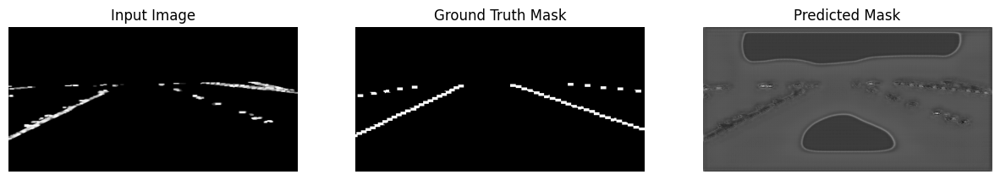

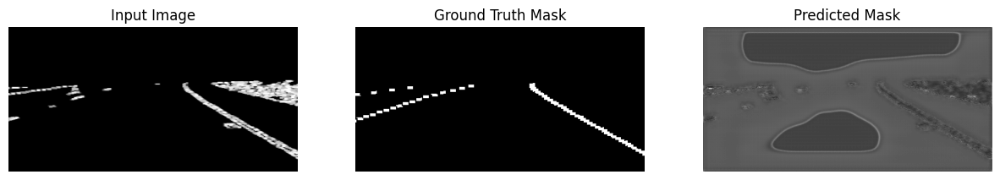

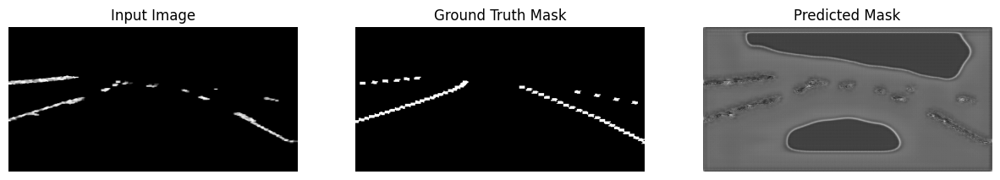

Epoch [2/50], Loss: 0.3618012480273646
Visualizing predictions after epoch 3


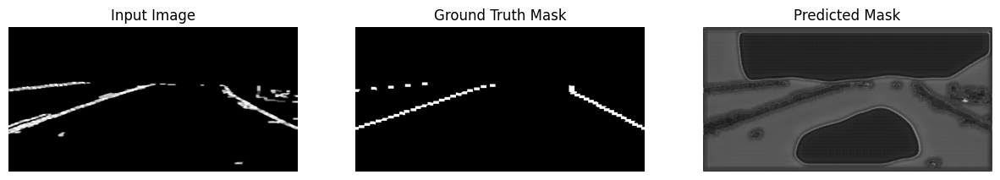

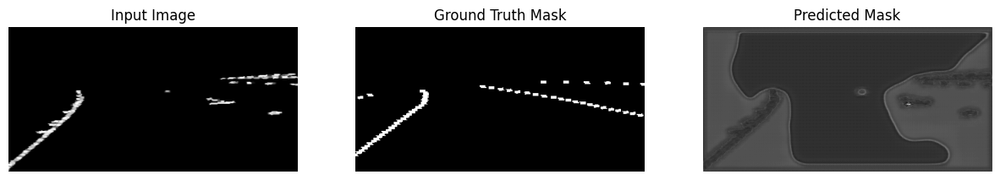

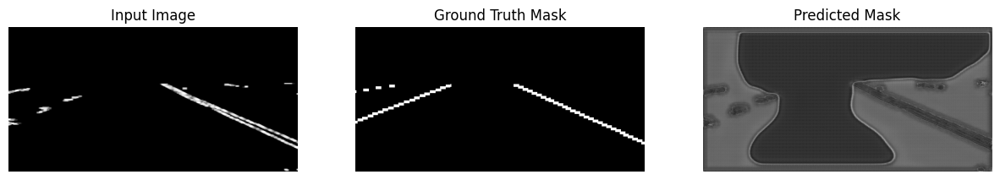

Epoch [3/50], Loss: 0.20196153453268142
Visualizing predictions after epoch 4


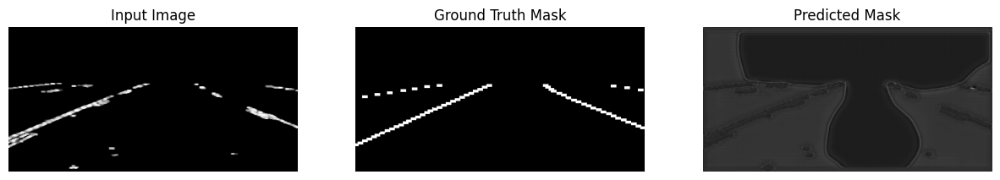

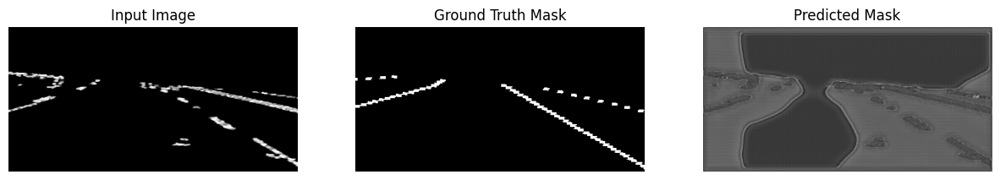

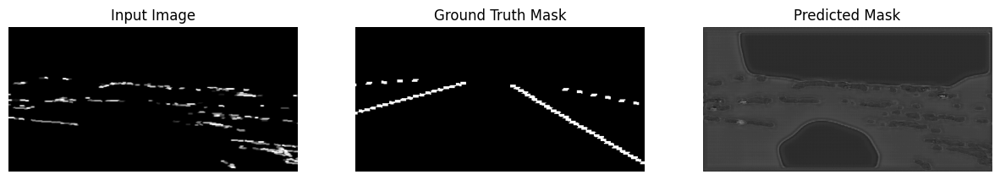

Epoch [4/50], Loss: 0.13603962504916253
Visualizing predictions after epoch 5


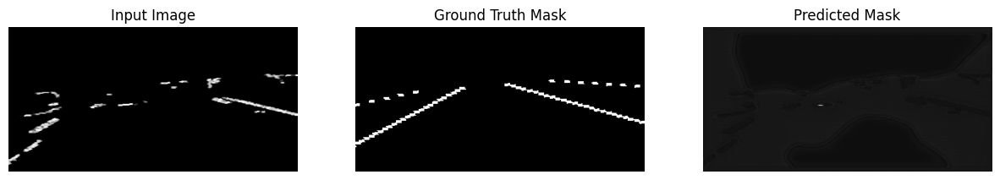

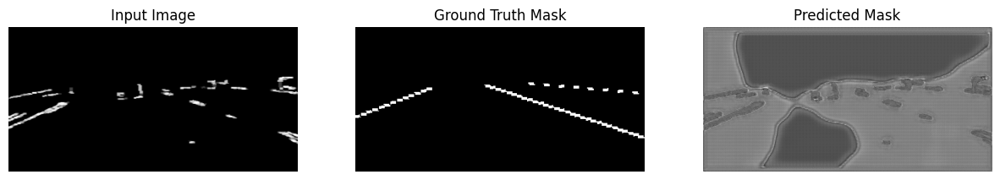

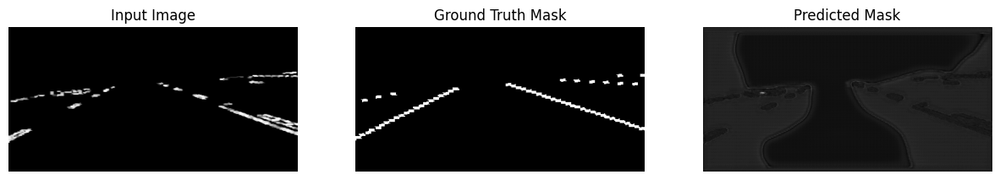

Epoch [5/50], Loss: 0.09472078754513275
Visualizing predictions after epoch 6


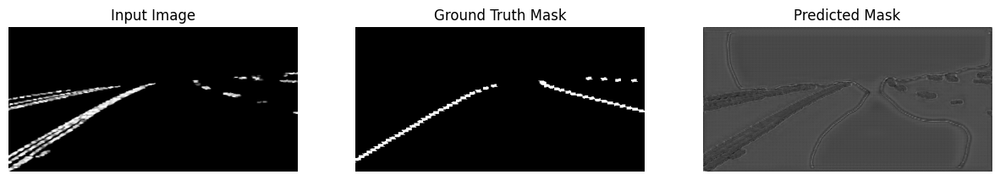

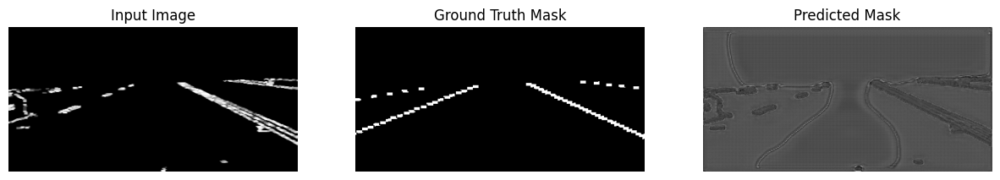

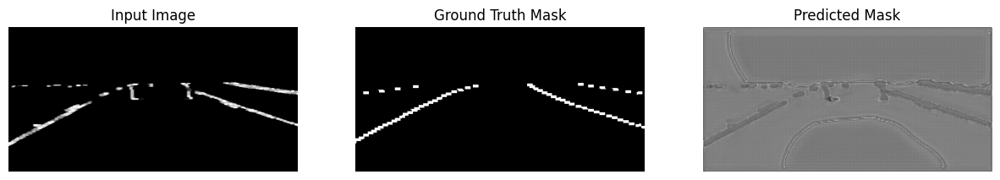

Epoch [6/50], Loss: 0.06748812038467844
Visualizing predictions after epoch 7


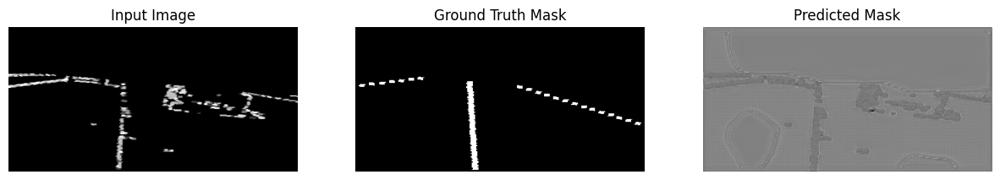

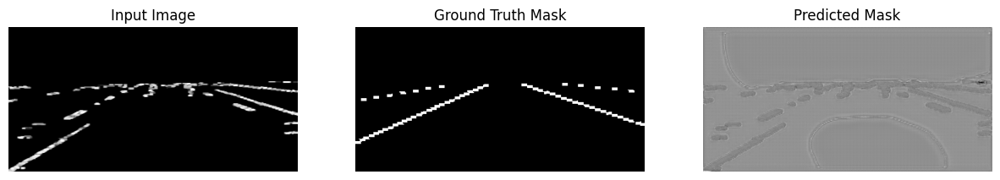

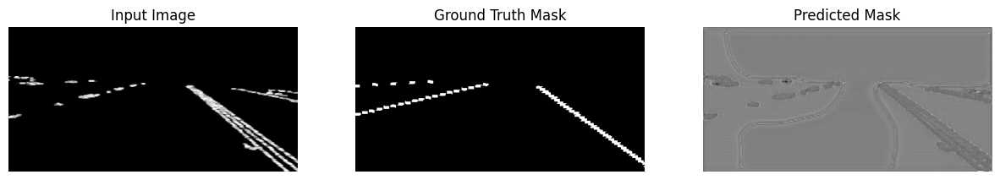

Epoch [7/50], Loss: 0.04968310575850209
Visualizing predictions after epoch 8


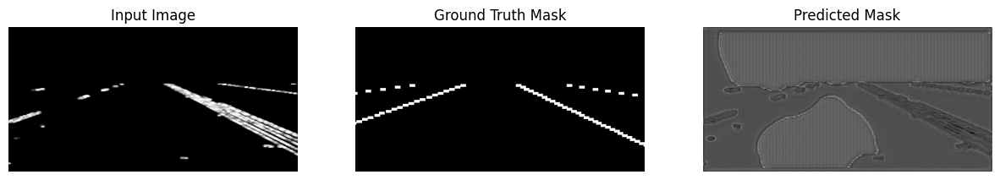

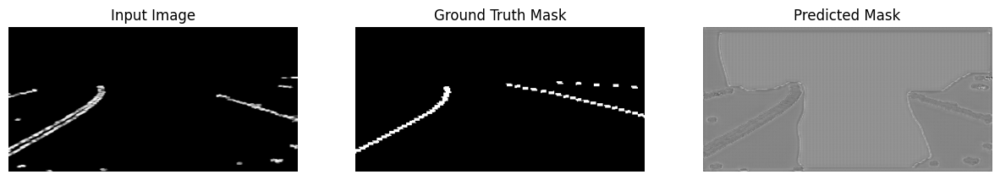

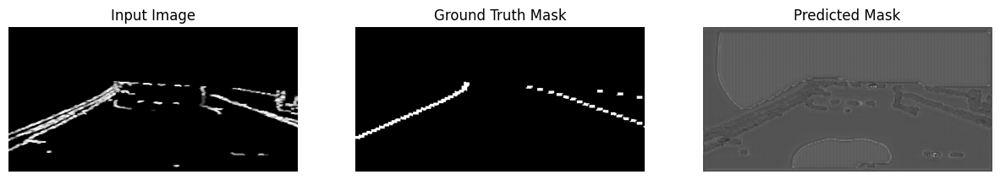

Epoch [8/50], Loss: 0.03746610382645666
Visualizing predictions after epoch 9


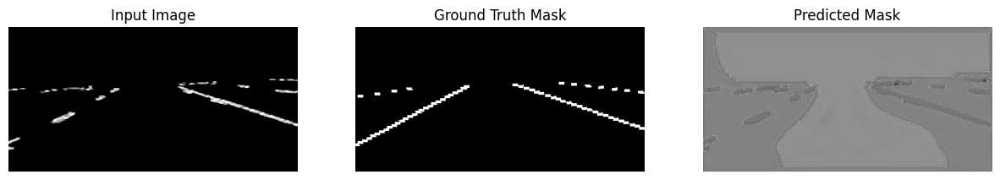

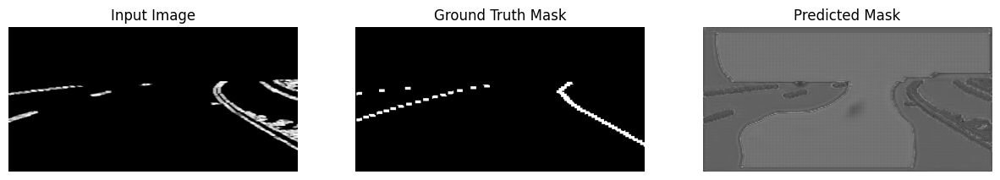

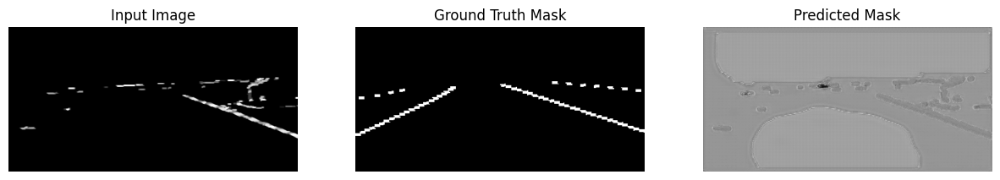

Epoch [9/50], Loss: 0.028747501278435606
Visualizing predictions after epoch 10


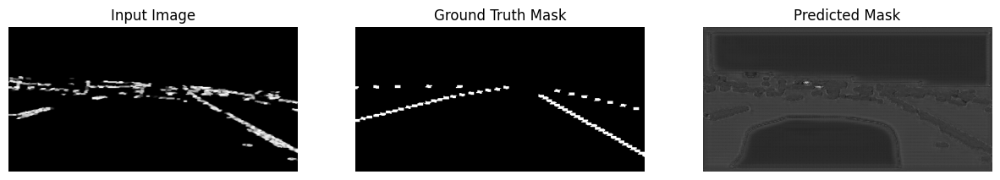

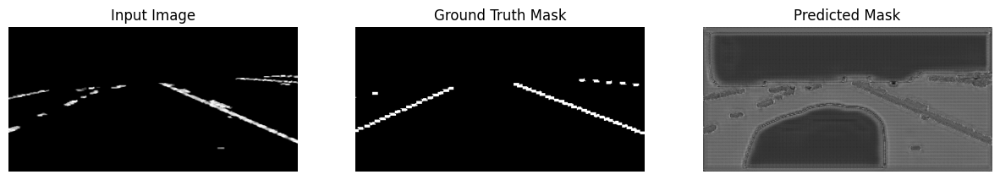

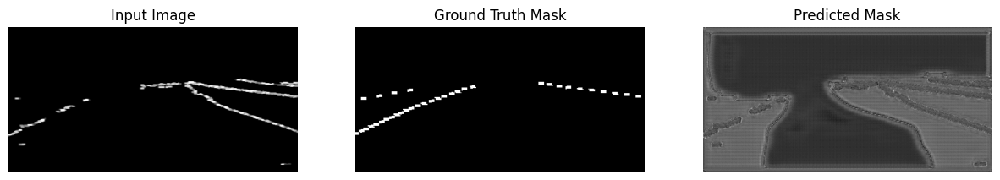

Epoch [10/50], Loss: 0.02242841560902312
Visualizing predictions after epoch 11


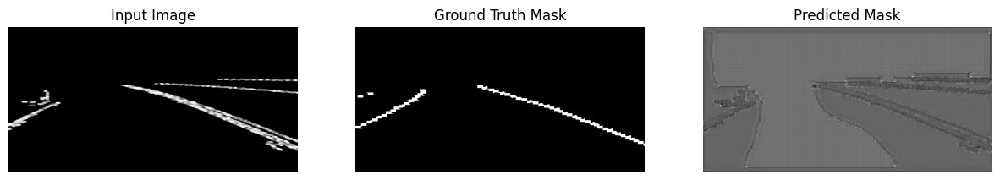

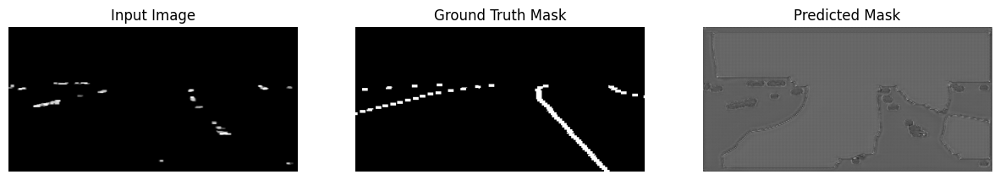

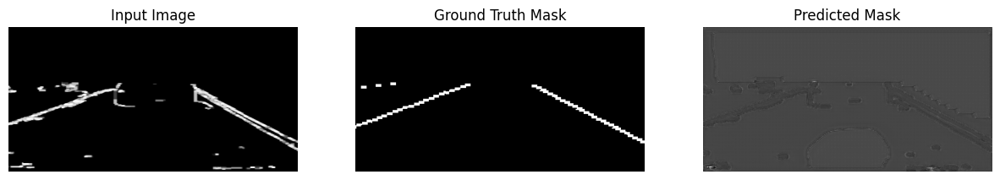

Epoch [11/50], Loss: 0.017832094573698904
Visualizing predictions after epoch 12


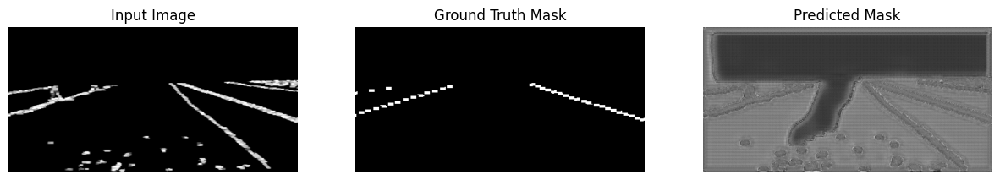

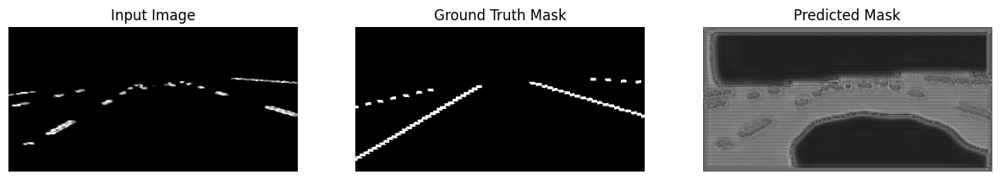

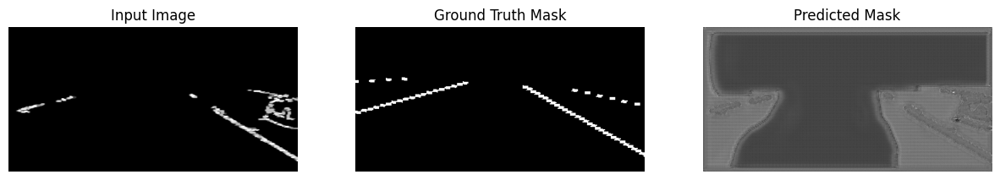

Epoch [12/50], Loss: 0.014396208182535244
Visualizing predictions after epoch 13


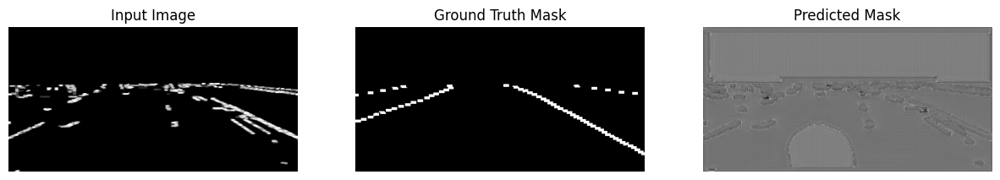

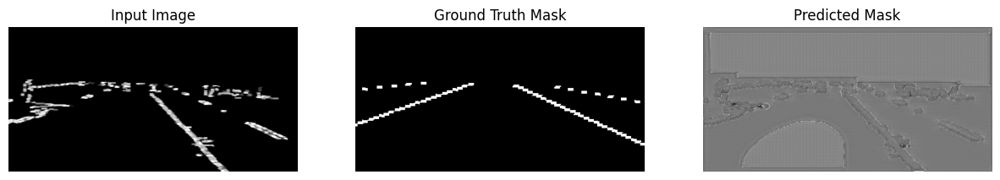

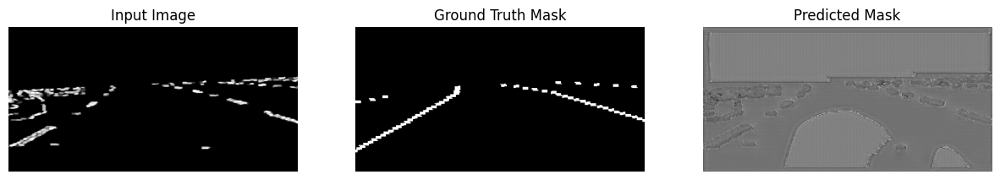

Epoch [13/50], Loss: 0.011778277386029124
Visualizing predictions after epoch 14


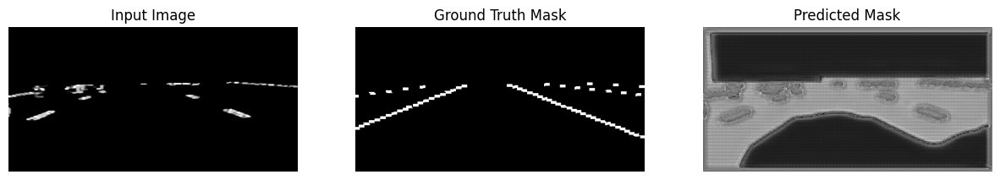

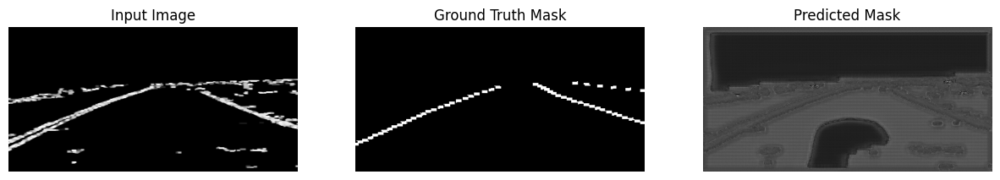

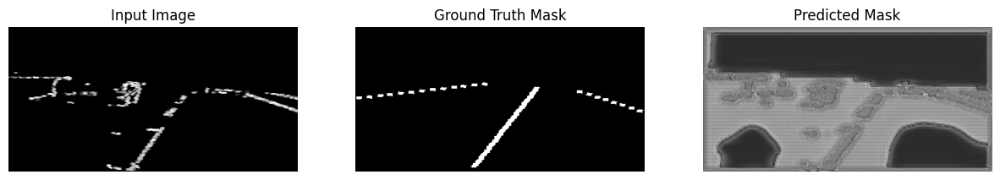

Epoch [14/50], Loss: 0.009753674884133928
Visualizing predictions after epoch 15


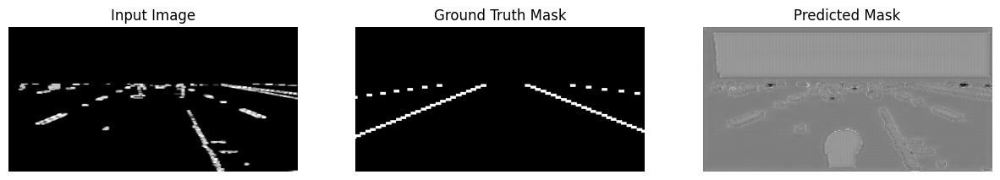

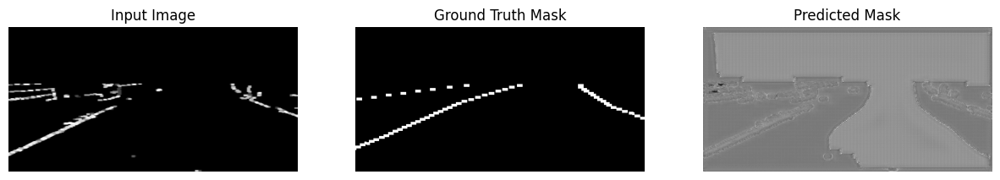

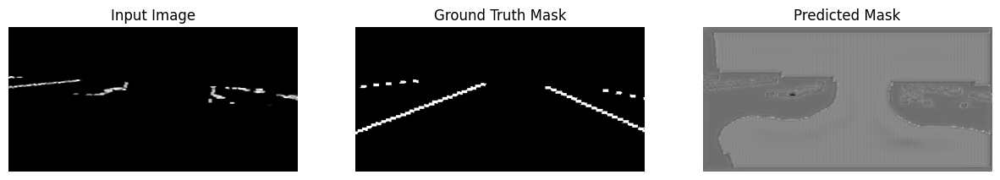

Epoch [15/50], Loss: 0.008156429783395995
Visualizing predictions after epoch 16


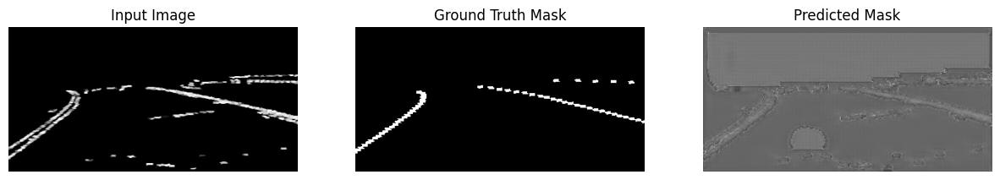

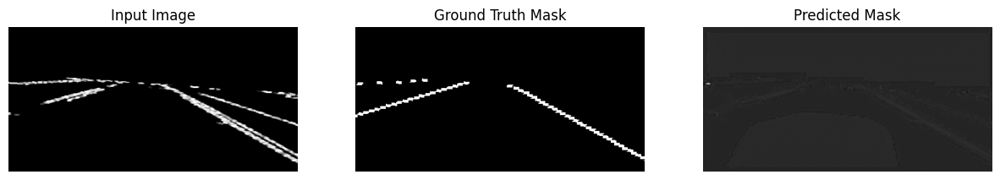

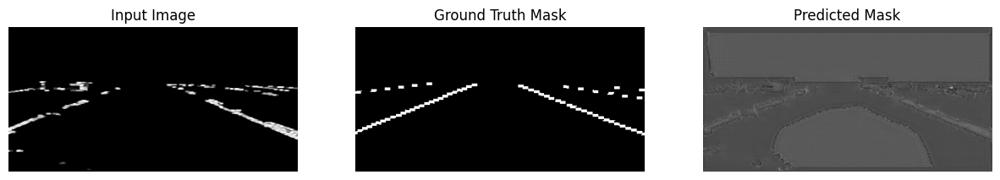

Epoch [16/50], Loss: 0.0068558056403919725
Visualizing predictions after epoch 17


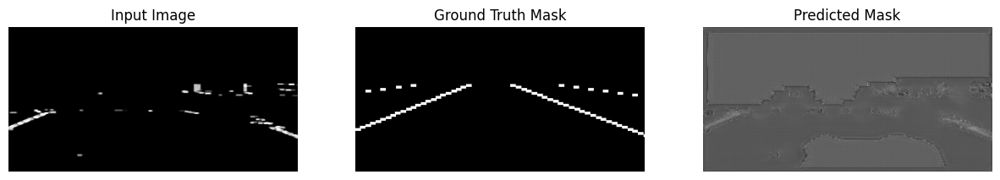

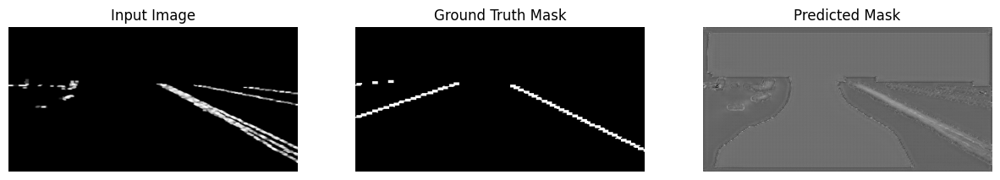

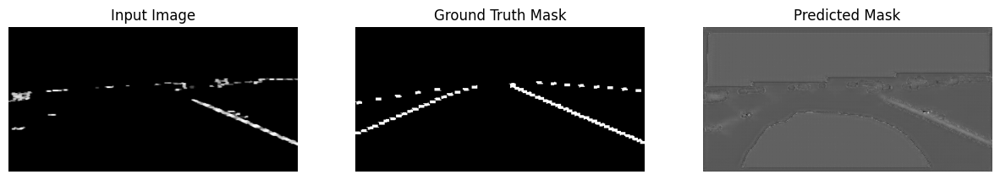

Epoch [17/50], Loss: 0.0058048426579798895
Visualizing predictions after epoch 18


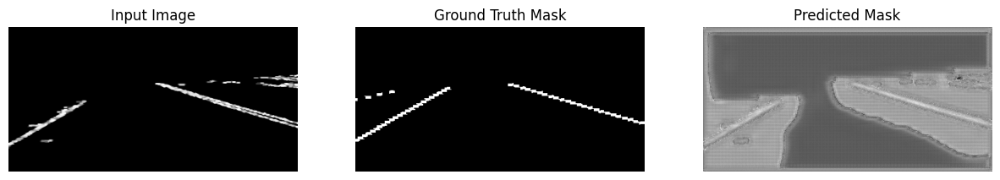

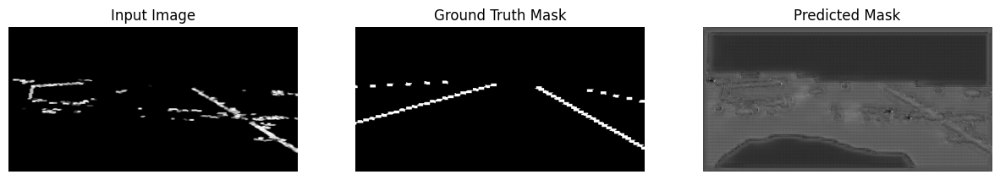

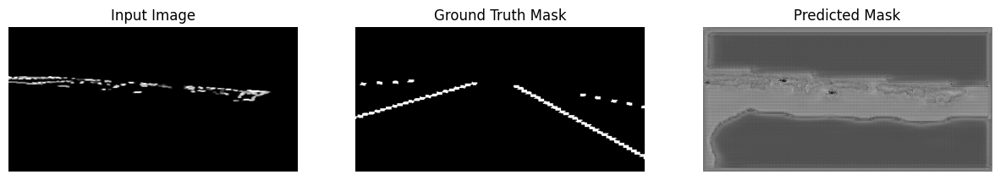

Epoch [18/50], Loss: 0.004959600167307954
Visualizing predictions after epoch 19


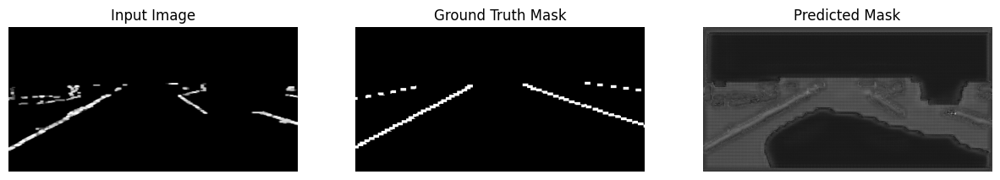

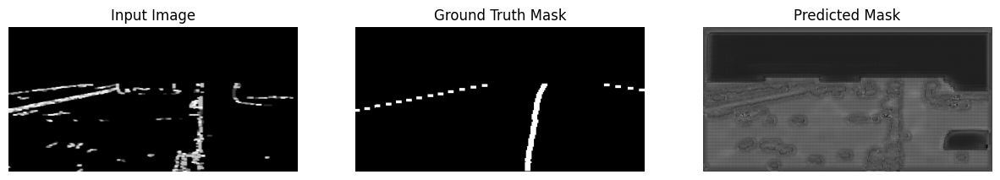

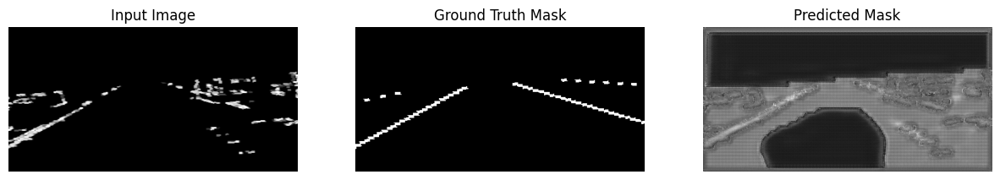

Epoch [19/50], Loss: 0.004273570520138688
Visualizing predictions after epoch 20


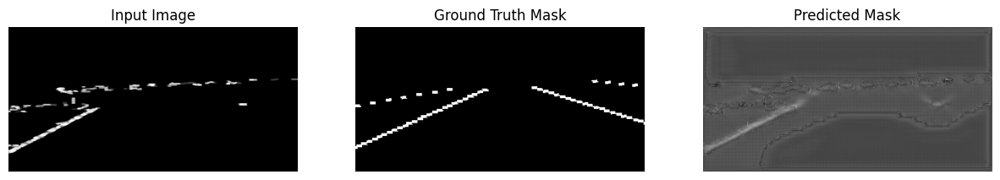

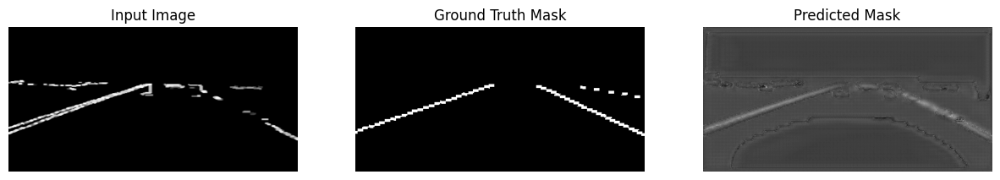

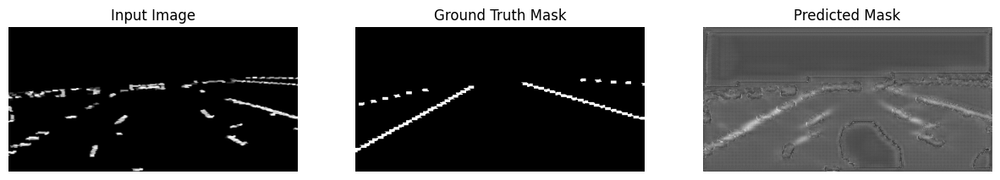

Epoch [20/50], Loss: 0.0037113062612761615
Visualizing predictions after epoch 21


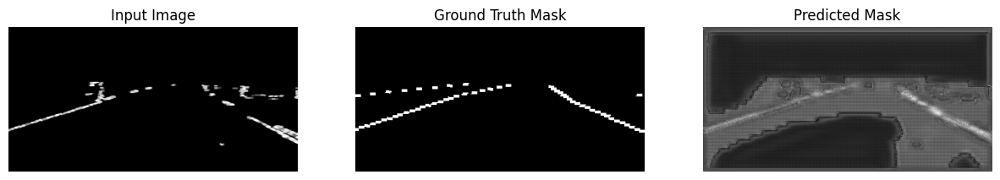

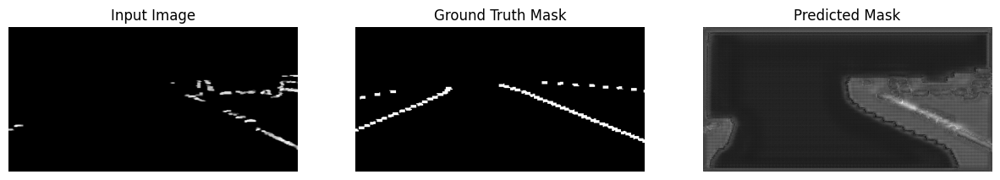

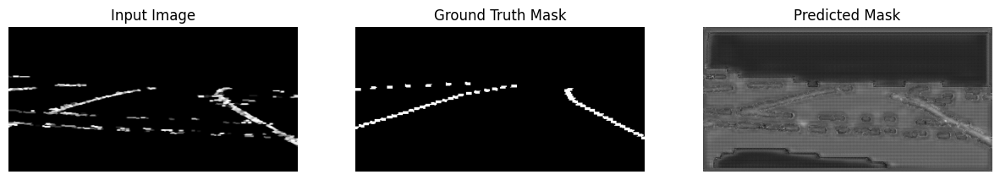

Epoch [21/50], Loss: 0.003246492045697662
Visualizing predictions after epoch 22


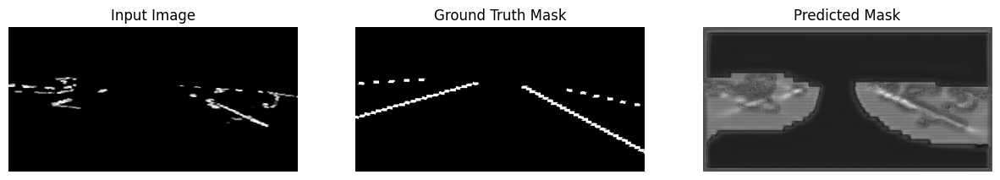

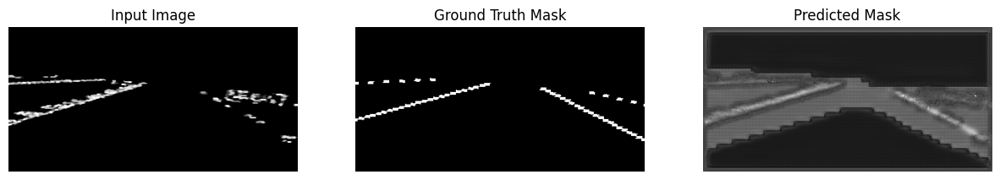

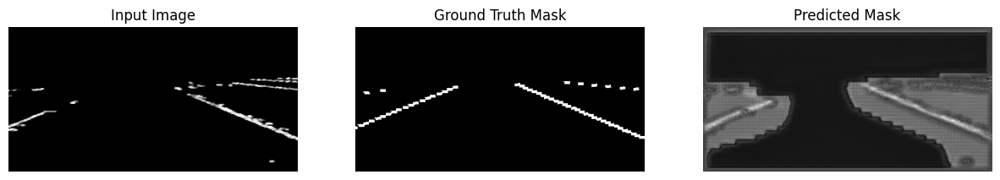

Epoch [22/50], Loss: 0.002860015451021919
Visualizing predictions after epoch 23


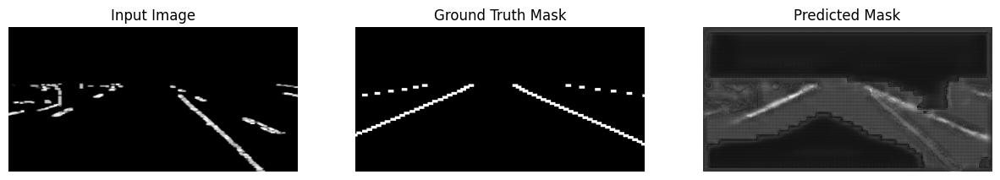

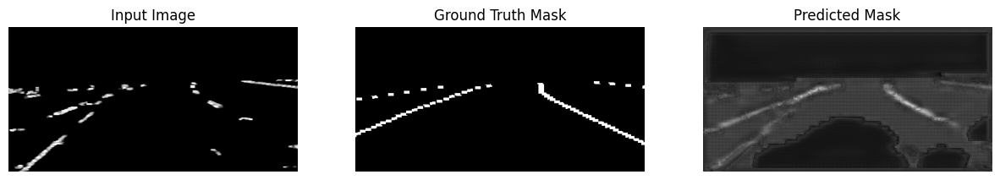

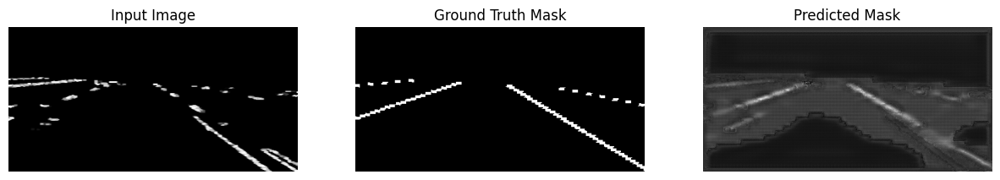

Epoch [23/50], Loss: 0.002536783793875496
Visualizing predictions after epoch 24


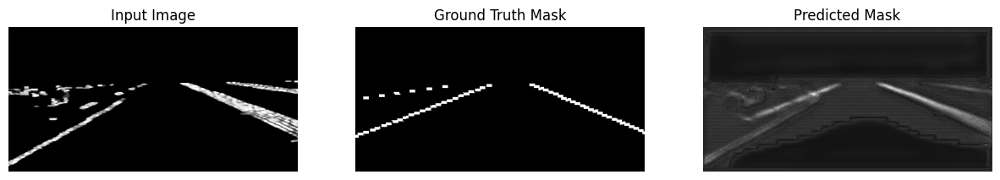

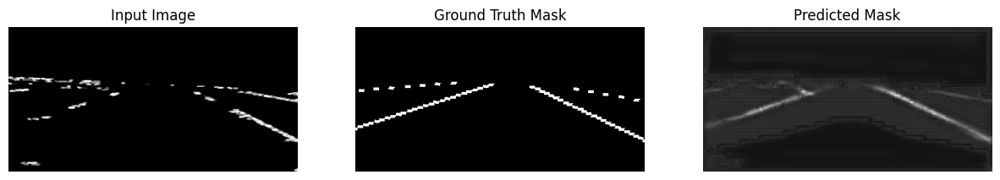

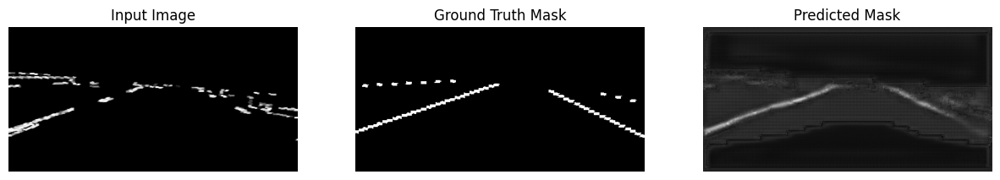

Epoch [24/50], Loss: 0.0022657590401297363
Visualizing predictions after epoch 25


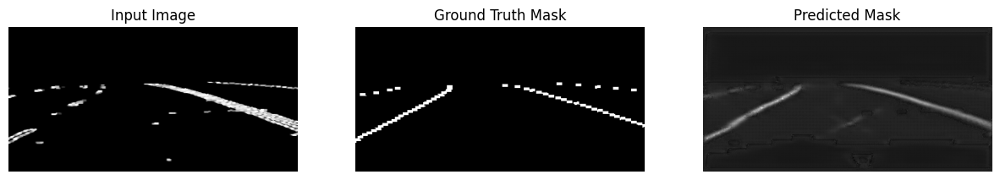

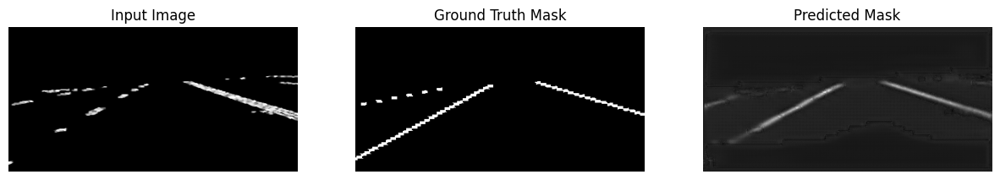

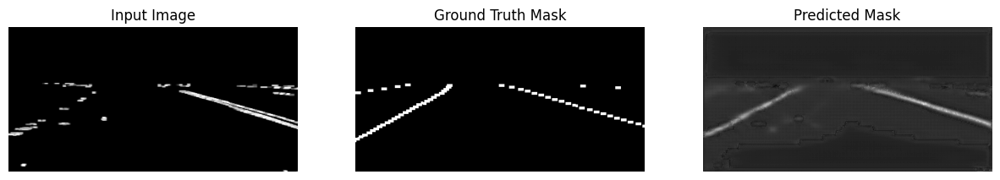

Epoch [25/50], Loss: 0.0020369838498582003
Visualizing predictions after epoch 26


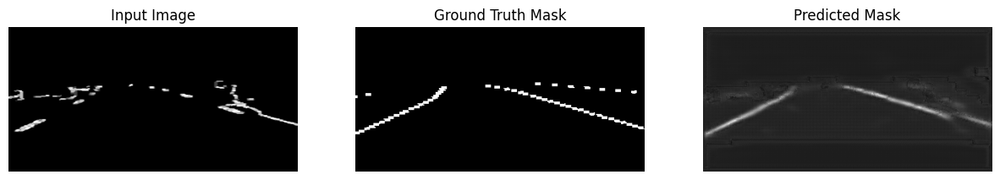

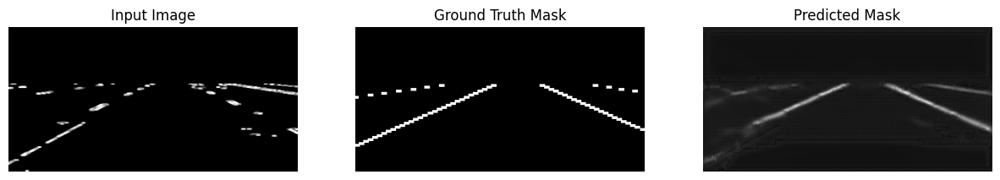

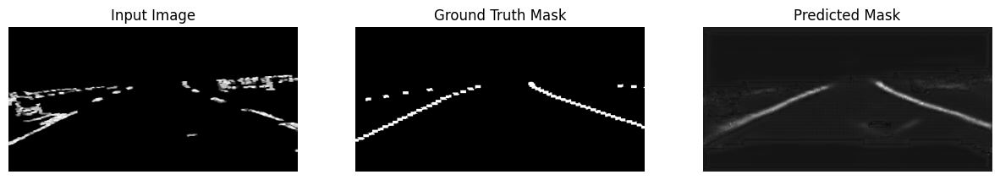

Epoch [26/50], Loss: 0.0018441315462386096
Visualizing predictions after epoch 27


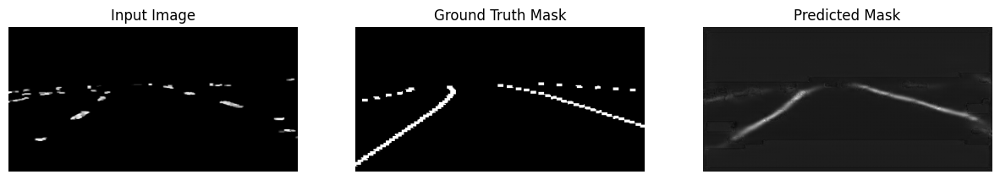

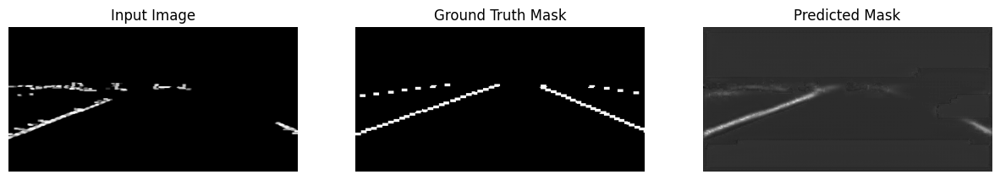

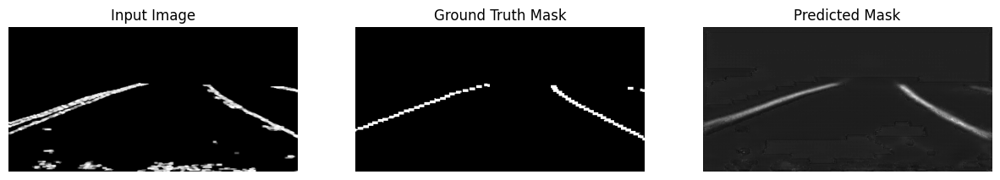

Epoch [27/50], Loss: 0.001677795026106719
Visualizing predictions after epoch 28


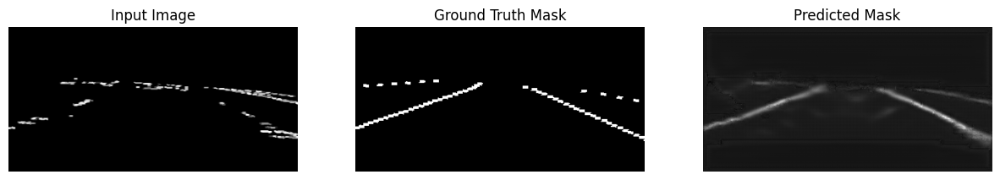

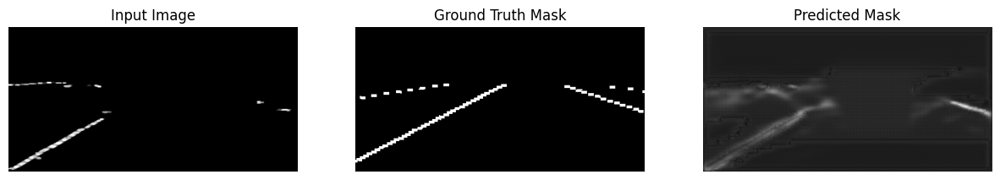

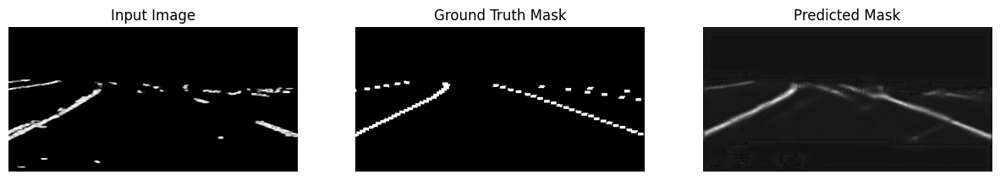

Epoch [28/50], Loss: 0.0015380189765351394
Visualizing predictions after epoch 29


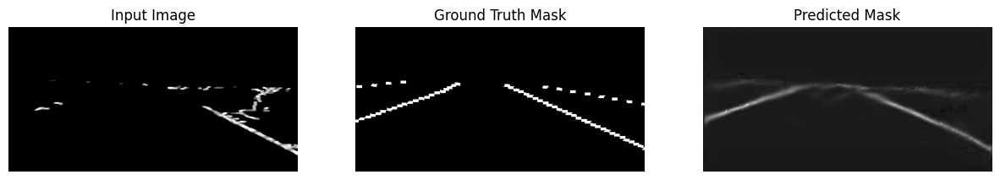

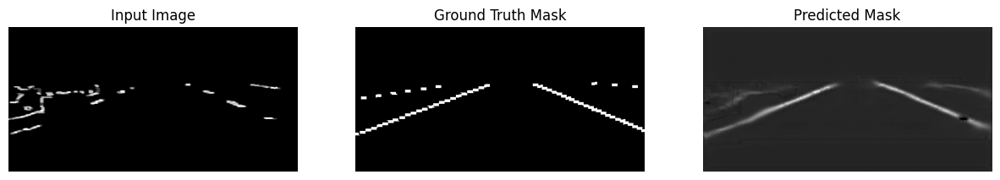

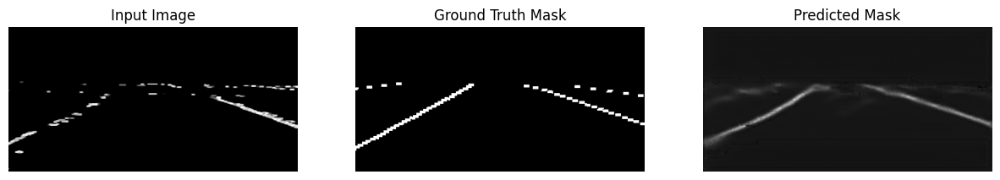

Epoch [29/50], Loss: 0.0014174417156668684
Visualizing predictions after epoch 30


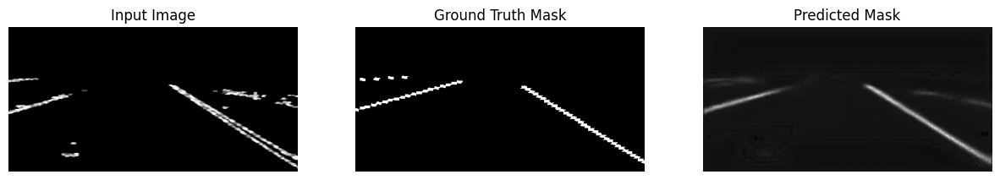

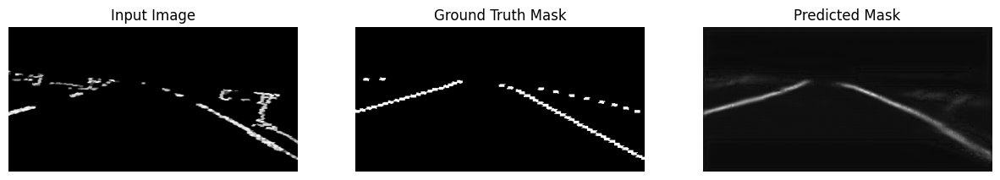

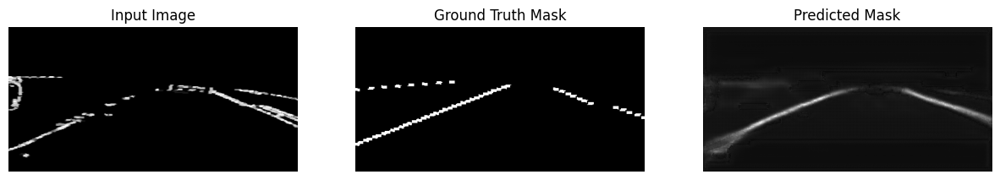

Epoch [30/50], Loss: 0.0013142793043414008
Visualizing predictions after epoch 31


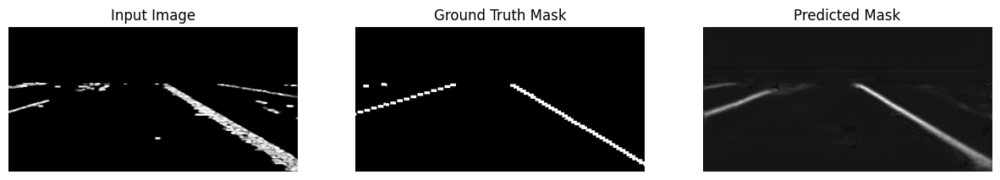

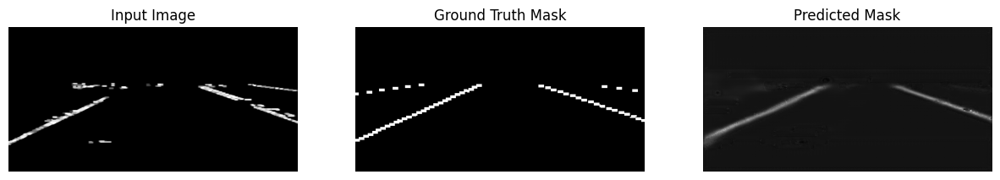

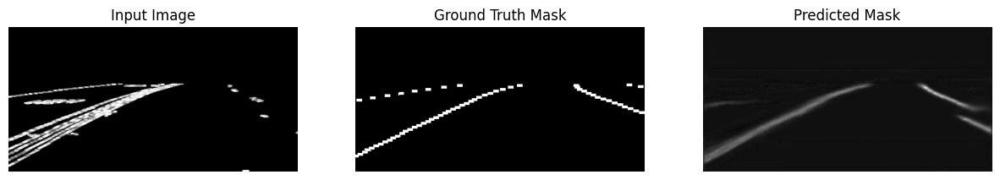

Epoch [31/50], Loss: 0.0012246264741727303
Visualizing predictions after epoch 32


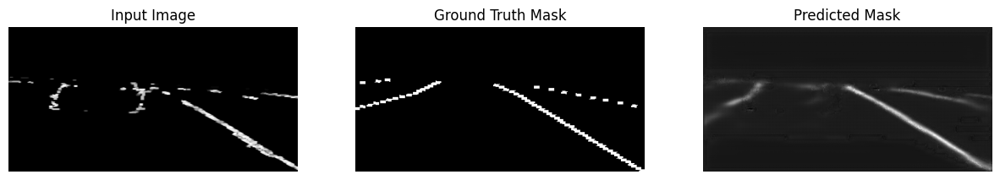

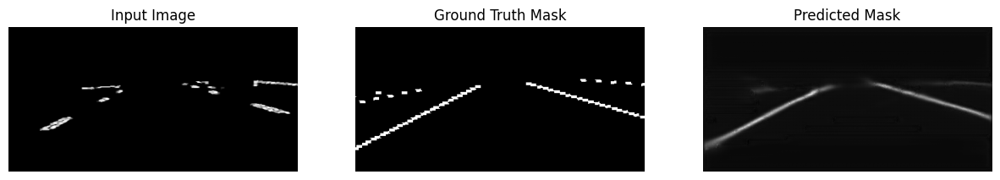

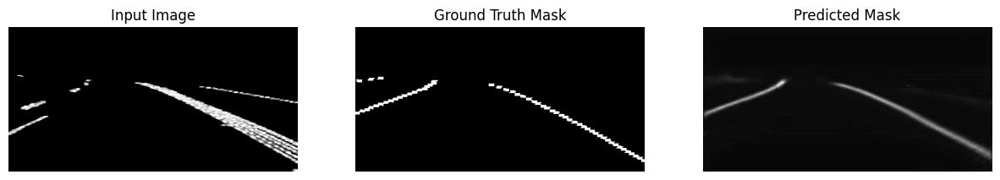

Epoch [32/50], Loss: 0.0011478322158087586
Visualizing predictions after epoch 33


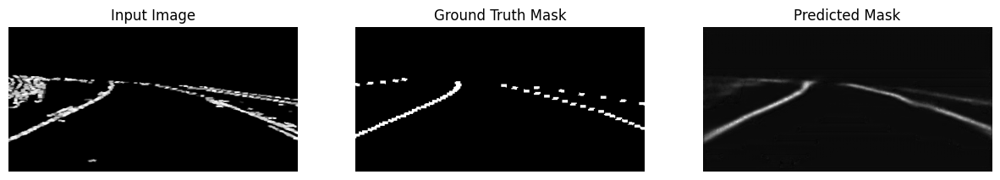

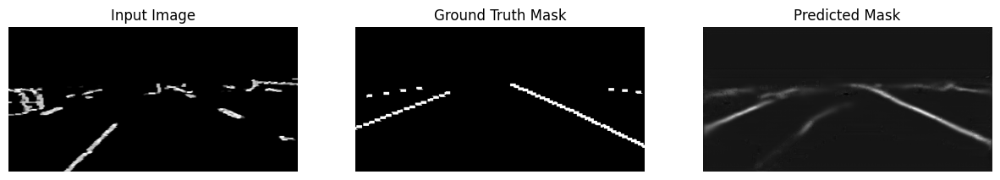

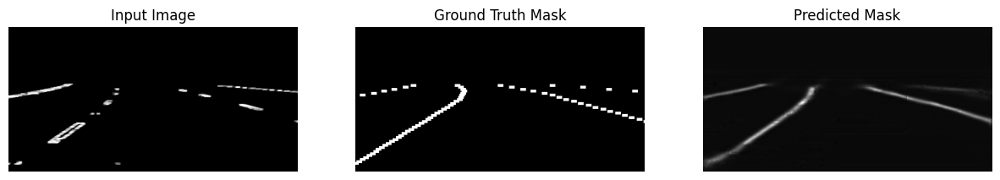

Epoch [33/50], Loss: 0.0010817572084719127
Visualizing predictions after epoch 34


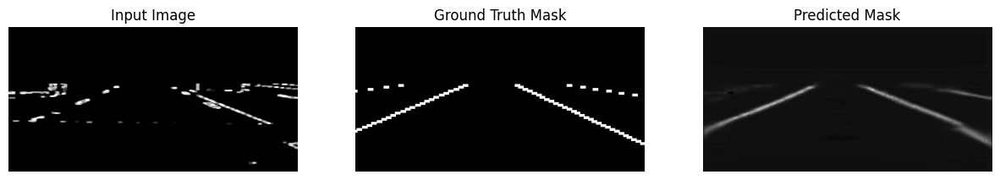

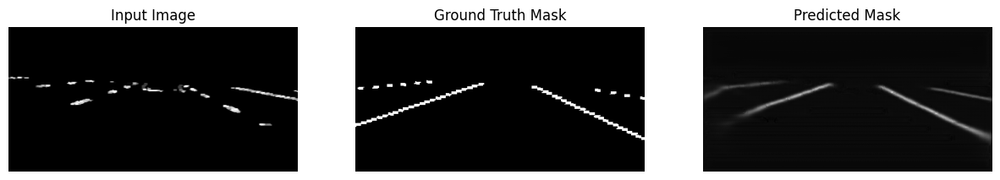

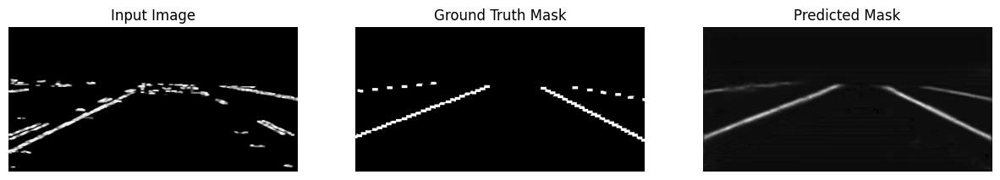

Epoch [34/50], Loss: 0.0010238925447904953
Visualizing predictions after epoch 35


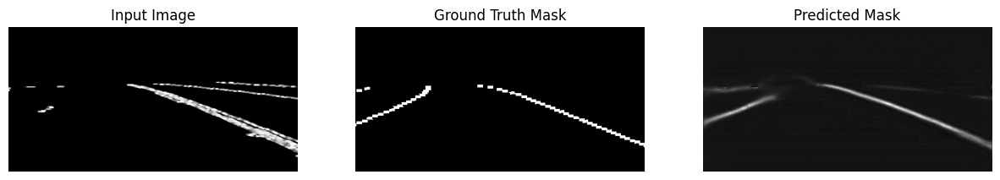

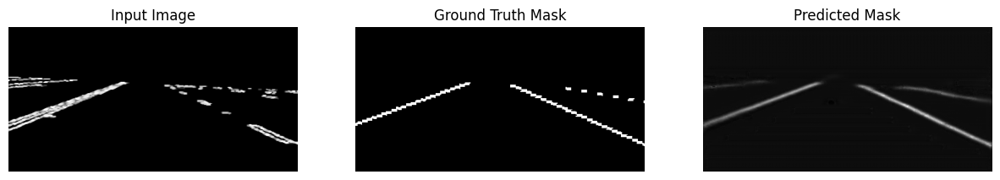

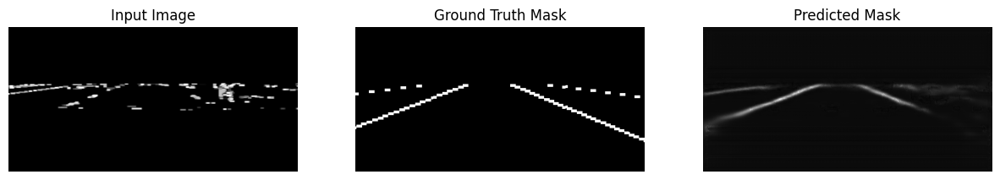

Epoch [35/50], Loss: 0.0009735972432846343
Visualizing predictions after epoch 36


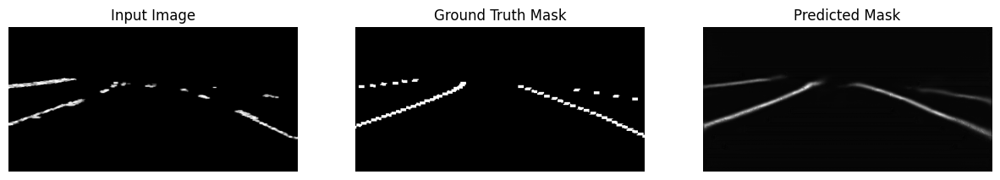

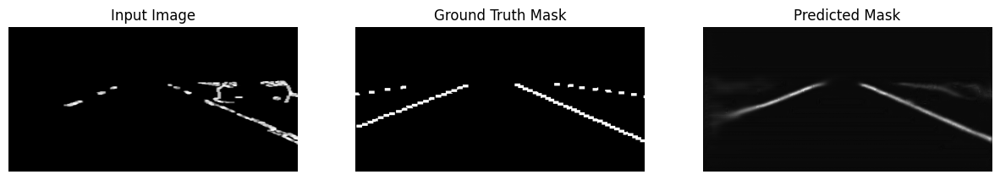

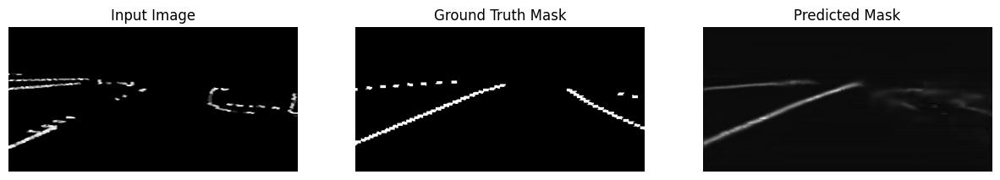

Epoch [36/50], Loss: 0.000931495076736706
Visualizing predictions after epoch 37


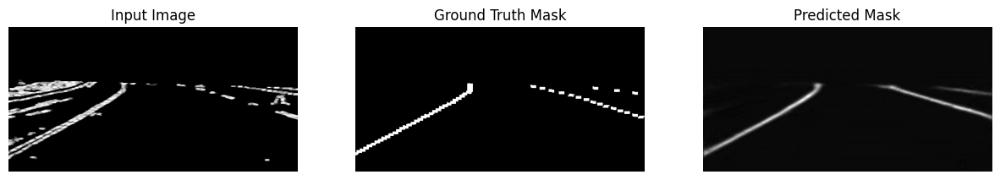

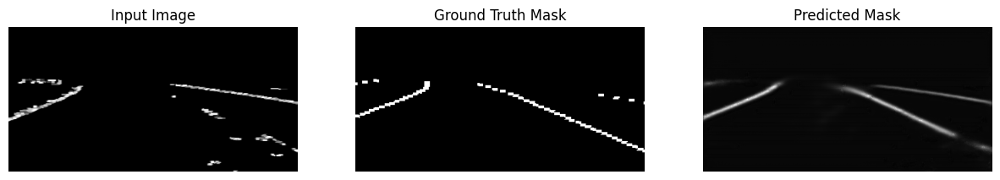

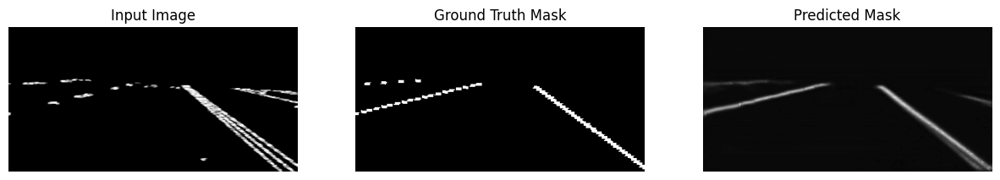

Epoch [37/50], Loss: 0.0008940016396963222
Visualizing predictions after epoch 38


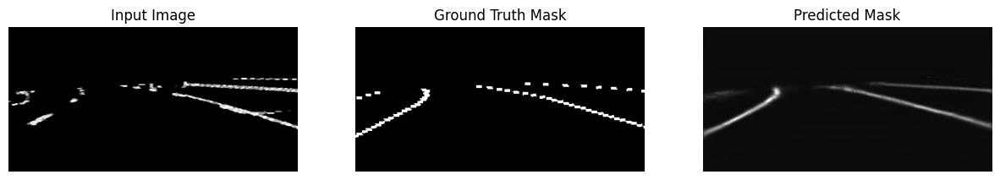

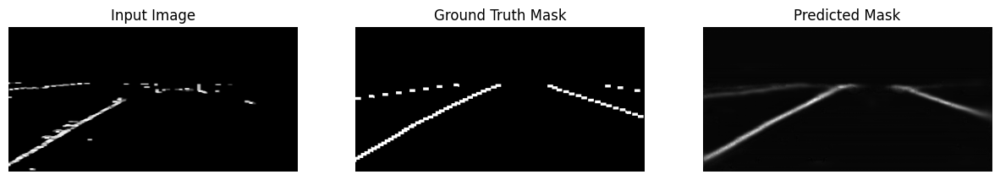

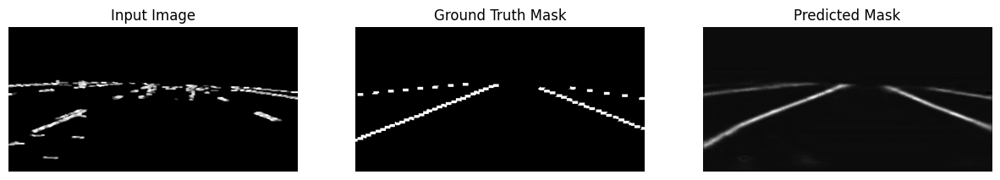

Epoch [38/50], Loss: 0.0008622024032402176
Visualizing predictions after epoch 39


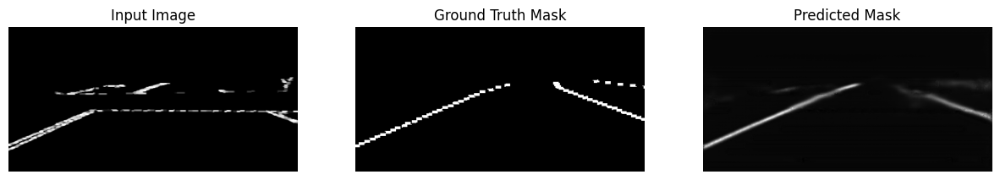

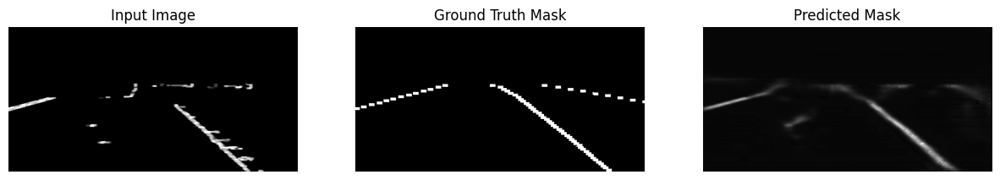

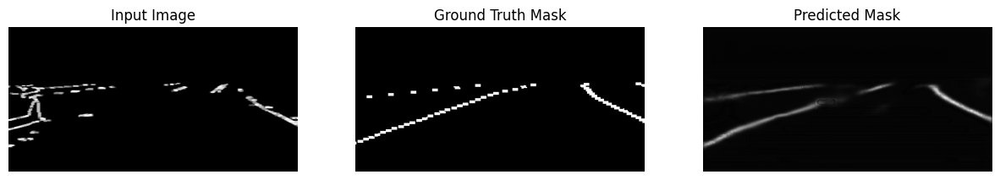

Epoch [39/50], Loss: 0.0008351488245573174
Visualizing predictions after epoch 40


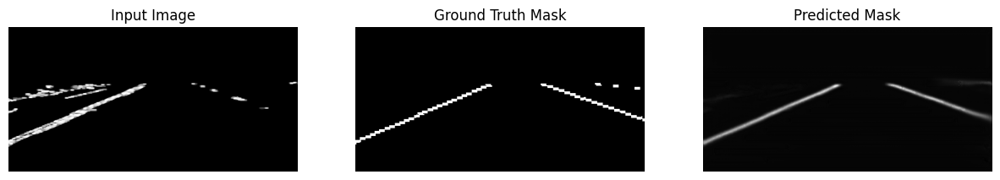

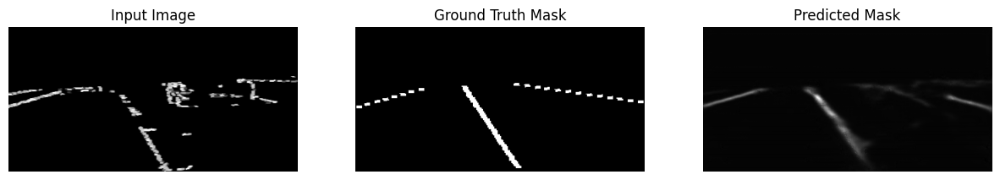

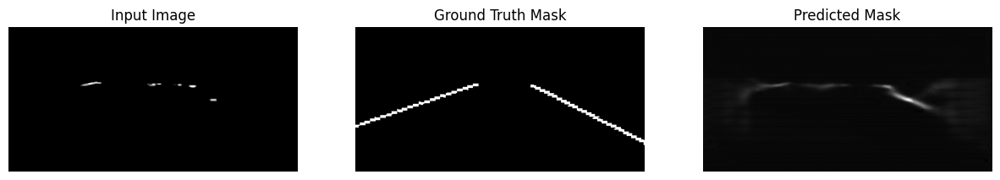

Epoch [40/50], Loss: 0.0008104138123999772
Visualizing predictions after epoch 41


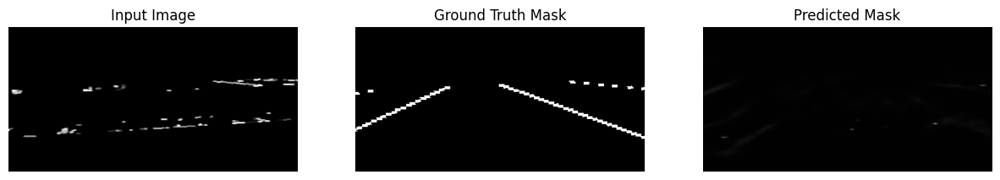

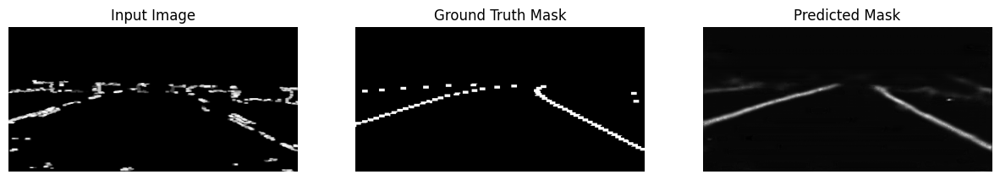

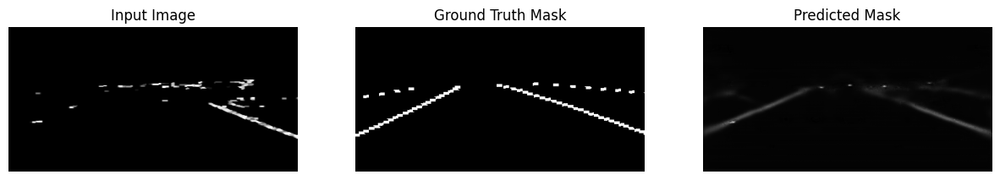

Epoch [41/50], Loss: 0.0007898697805476051
Visualizing predictions after epoch 42


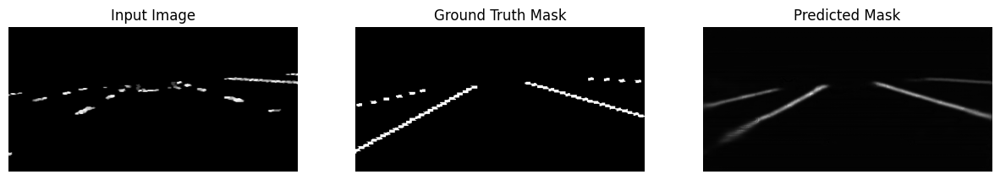

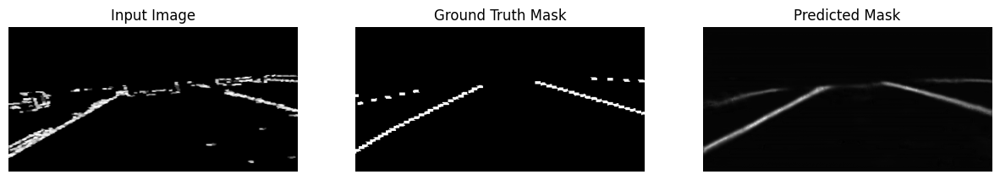

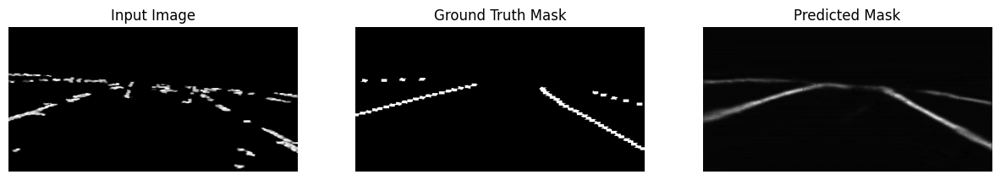

Epoch [42/50], Loss: 0.000770709493519566
Visualizing predictions after epoch 43


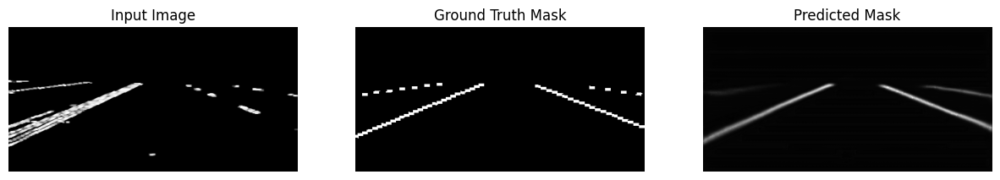

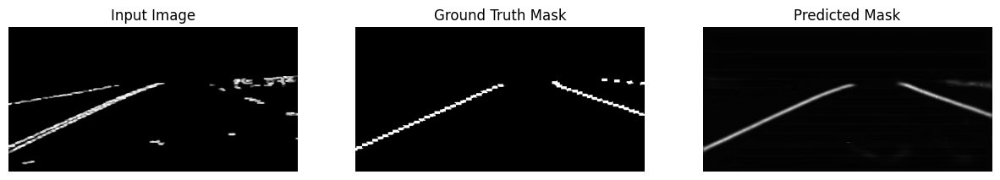

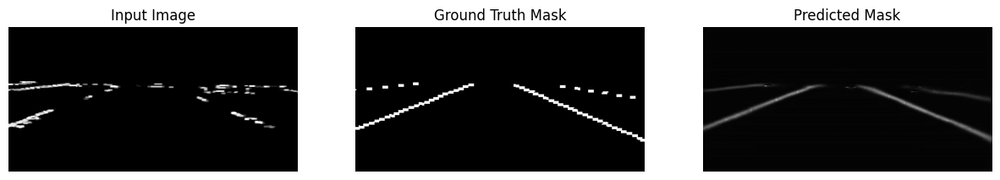

Epoch [43/50], Loss: 0.0007538284659221571
Visualizing predictions after epoch 44


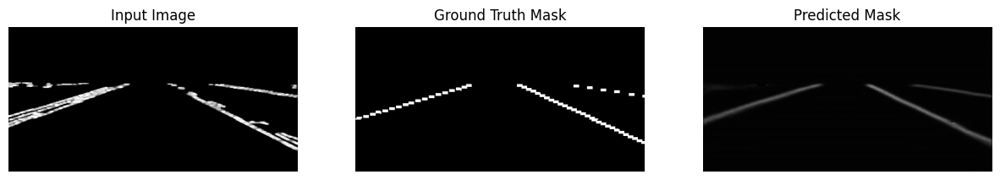

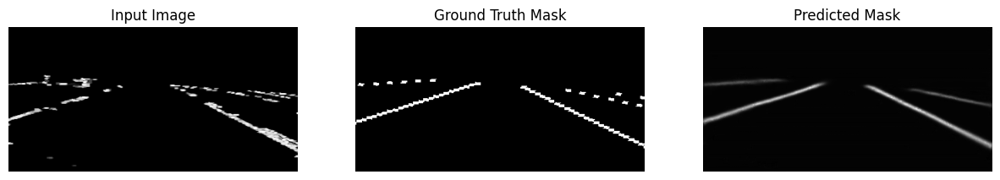

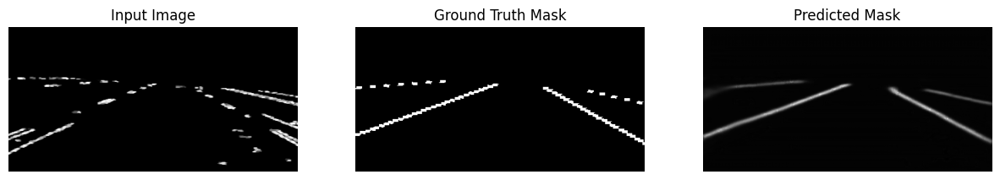

Epoch [44/50], Loss: 0.0007397213262005295
Visualizing predictions after epoch 45


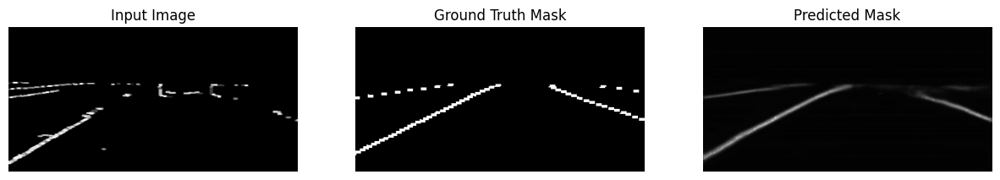

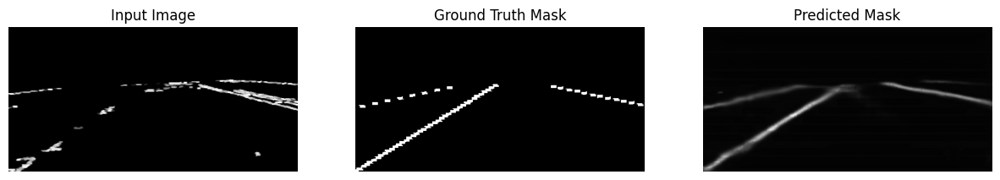

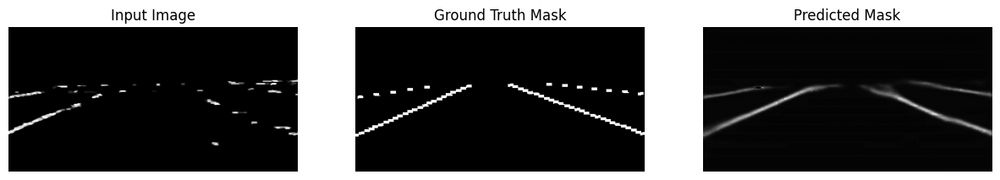

Epoch [45/50], Loss: 0.0007272476406300251
Visualizing predictions after epoch 46


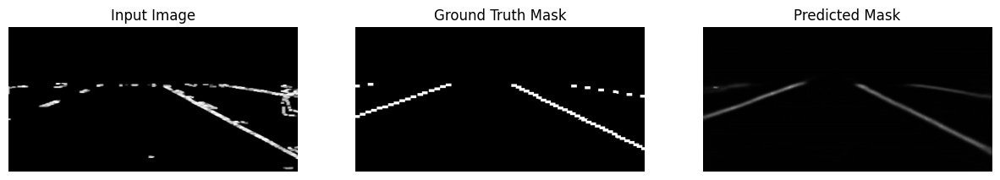

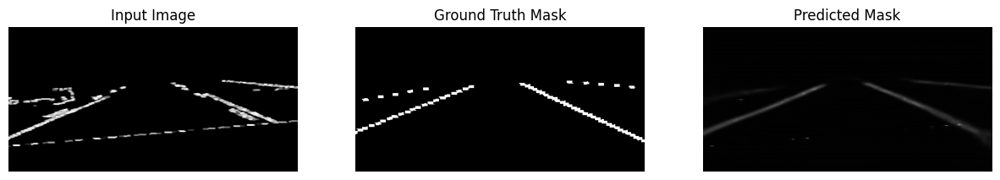

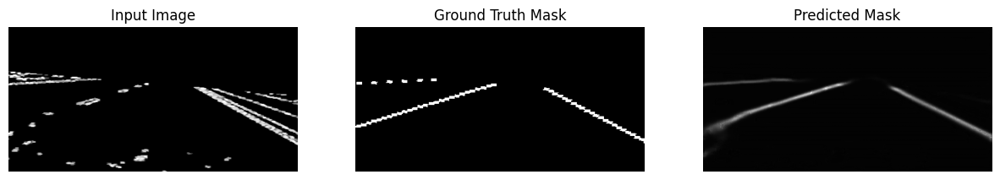

Epoch [46/50], Loss: 0.000715654883902963
Visualizing predictions after epoch 47


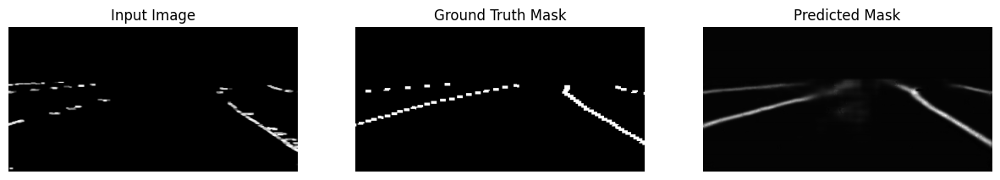

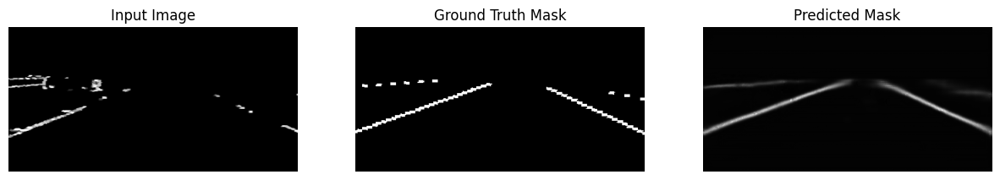

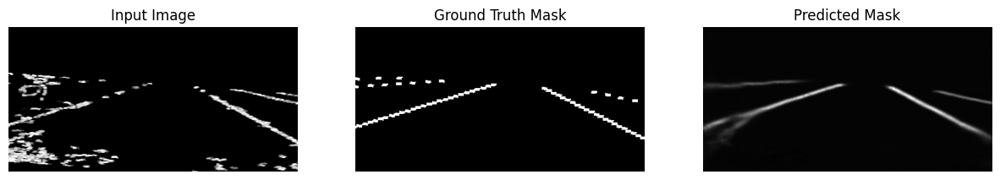

Epoch [47/50], Loss: 0.0007059908534055535
Visualizing predictions after epoch 48


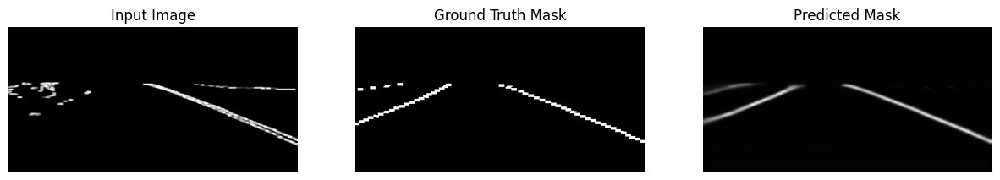

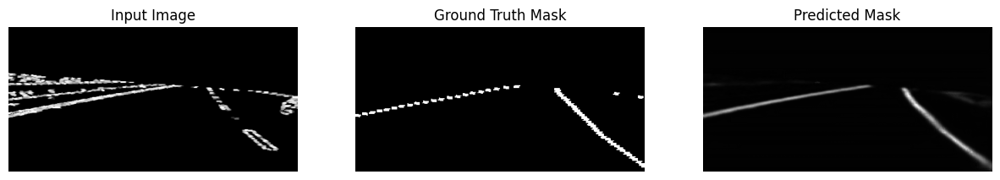

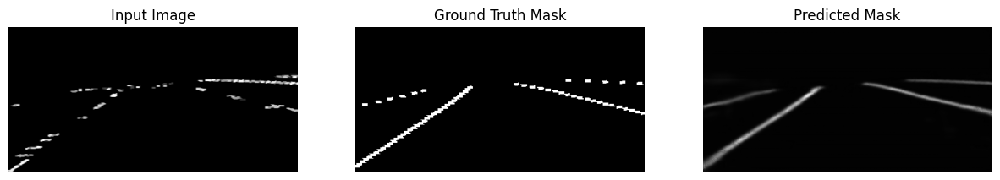

Epoch [48/50], Loss: 0.0006979352167380834
Visualizing predictions after epoch 49


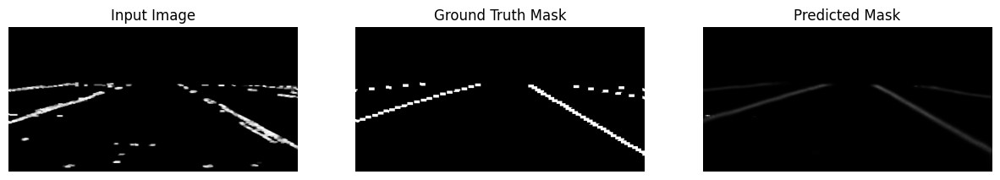

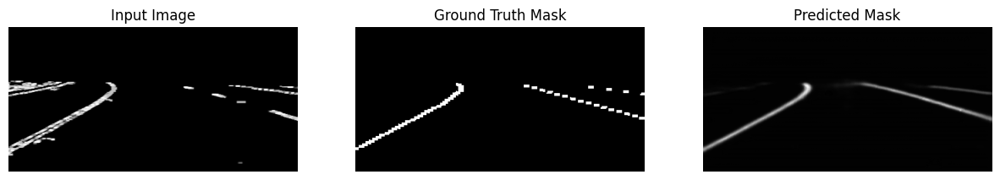

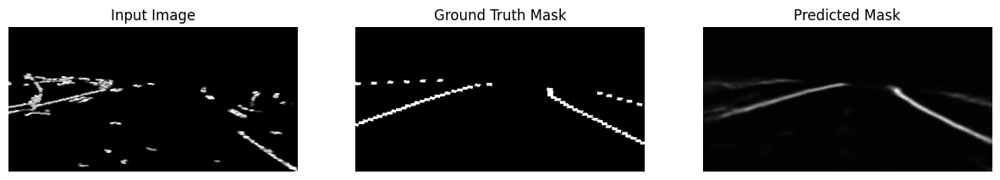

Epoch [49/50], Loss: 0.0006904963366502674
Visualizing predictions after epoch 50


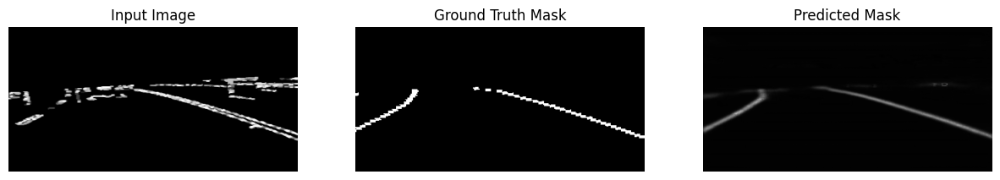

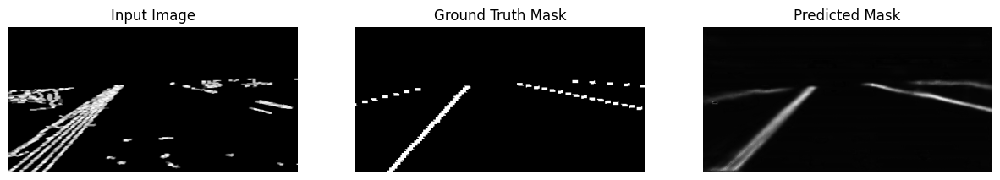

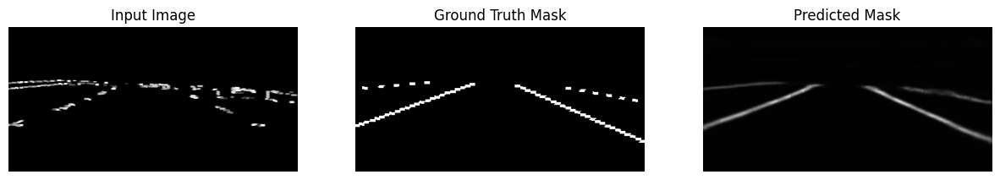

Epoch [50/50], Loss: 0.0006841464718959668
Visualizing predictions after epoch 51


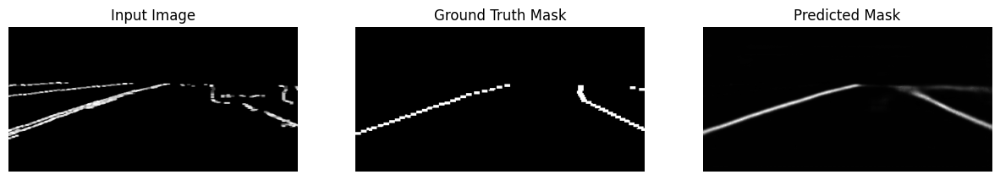

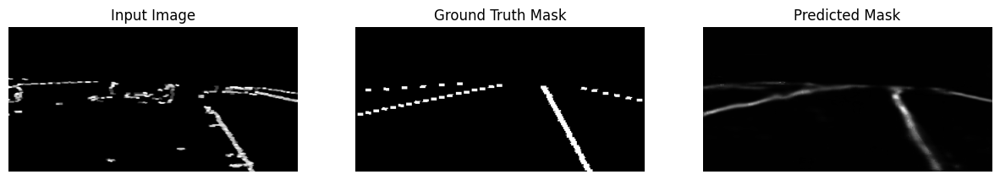

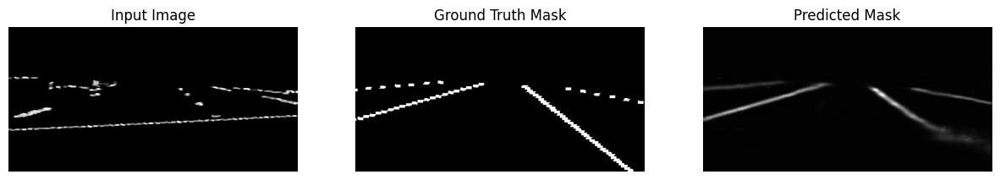

Epoch [51/50], Loss: 0.0006778379807367691
Visualizing predictions after epoch 52


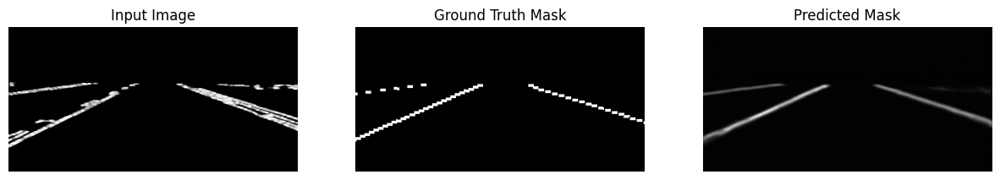

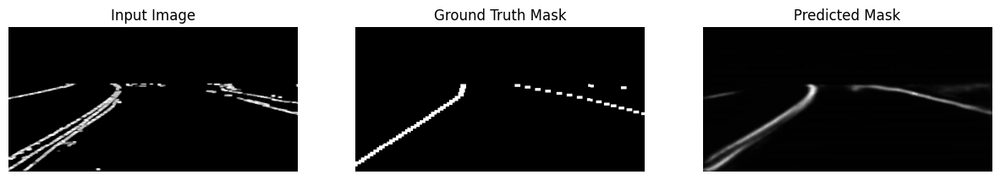

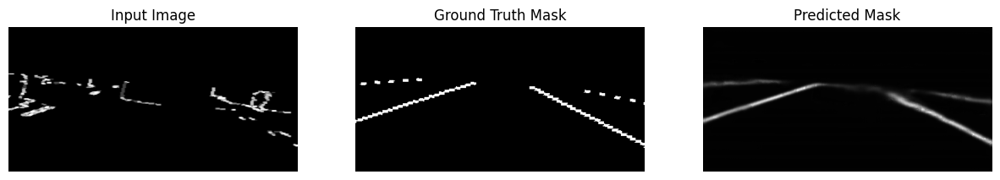

Epoch [52/50], Loss: 0.0006727610159837661
Visualizing predictions after epoch 53


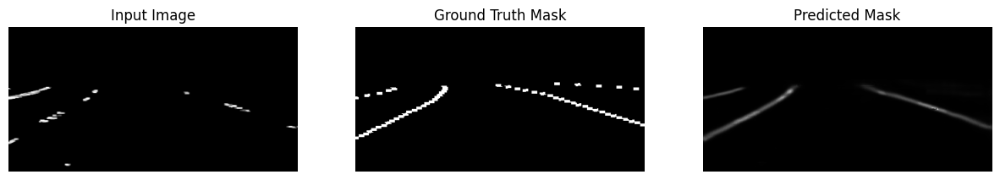

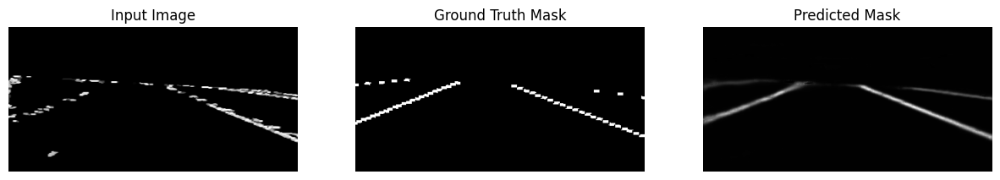

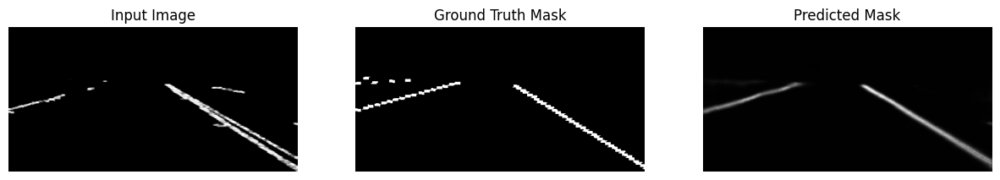

Epoch [53/50], Loss: 0.0006680943793412052
Visualizing predictions after epoch 54


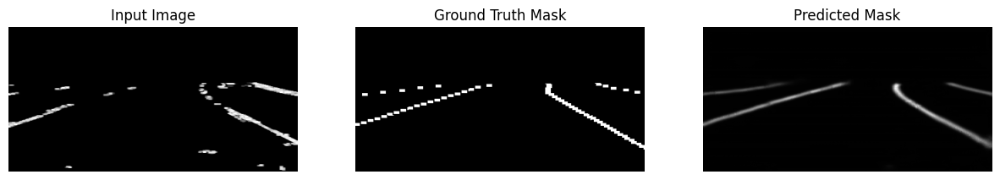

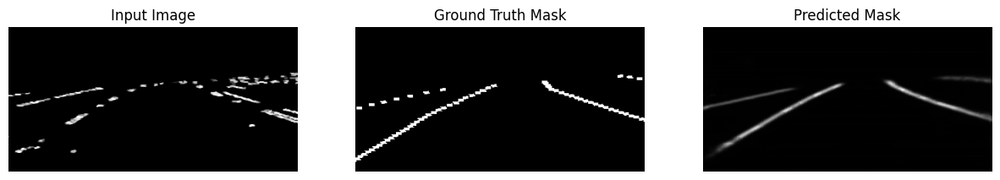

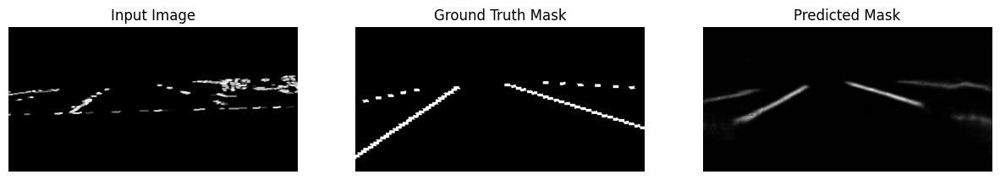

Epoch [54/50], Loss: 0.0006639830814777066
Visualizing predictions after epoch 55


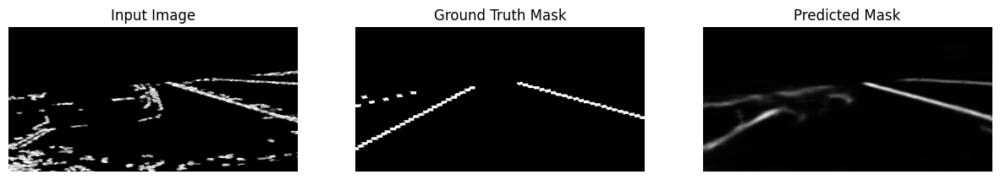

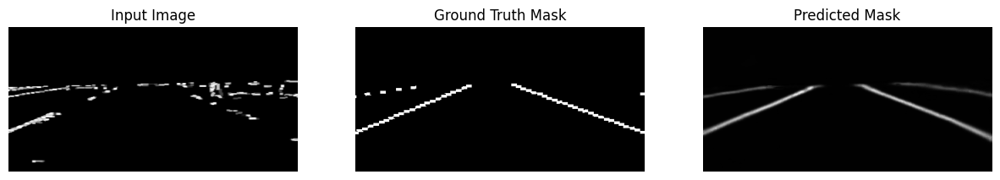

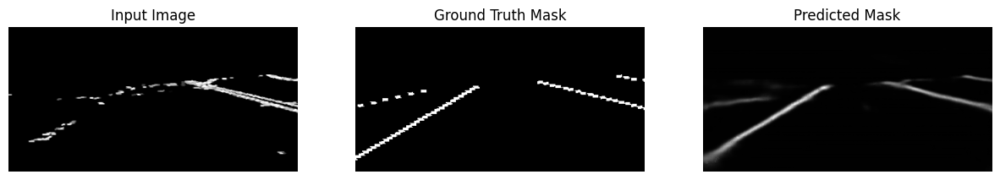

Epoch [55/50], Loss: 0.0006605549261593445
Visualizing predictions after epoch 56


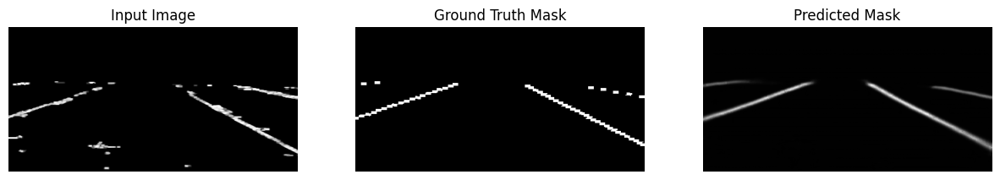

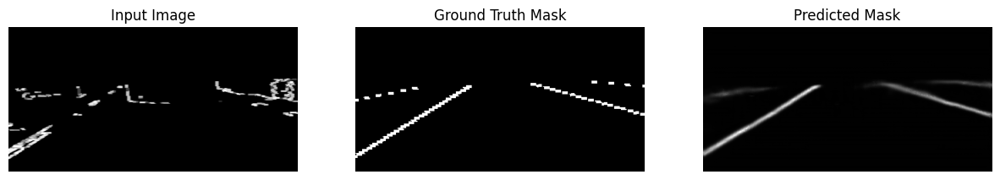

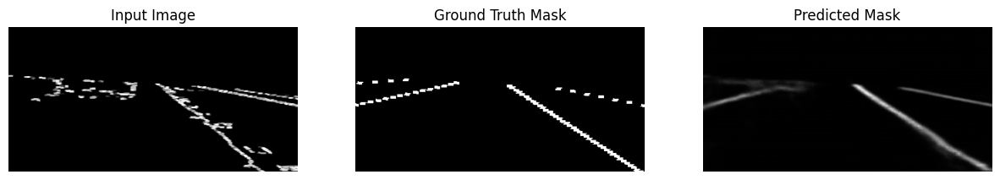

Epoch [56/50], Loss: 0.0006568807370587363
Visualizing predictions after epoch 57


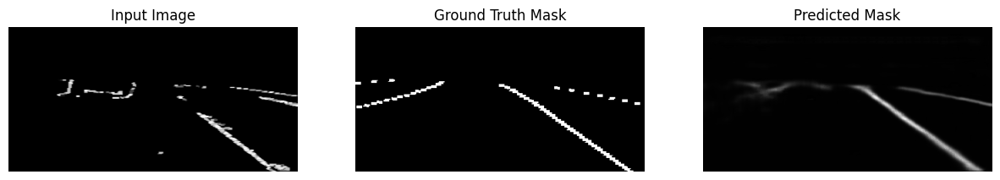

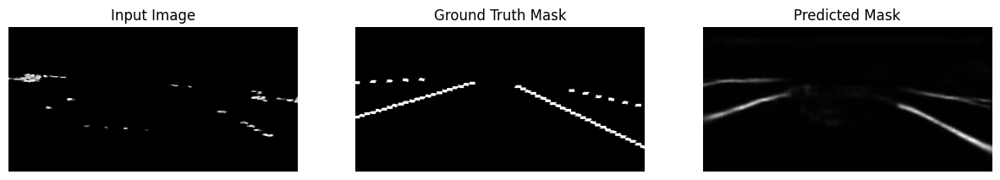

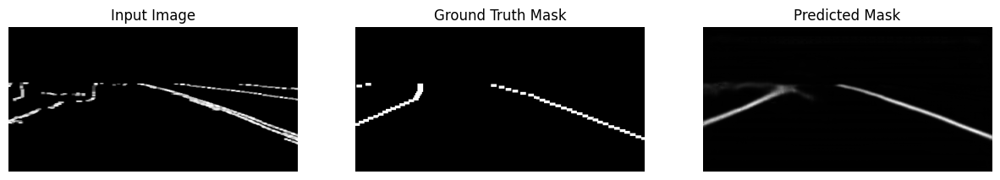

Epoch [57/50], Loss: 0.0006545385974561919
Visualizing predictions after epoch 58


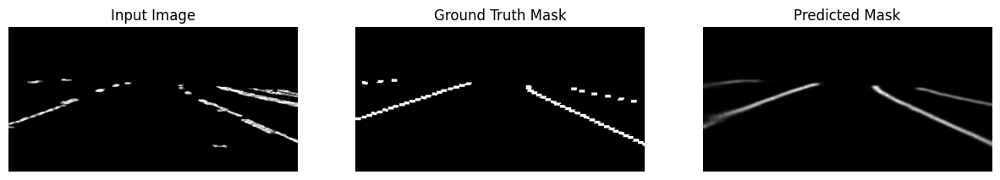

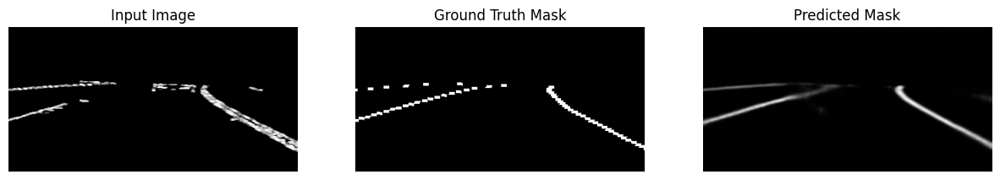

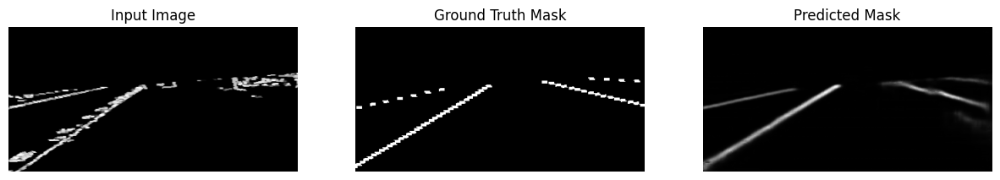

Epoch [58/50], Loss: 0.0006514096259250252
Visualizing predictions after epoch 59


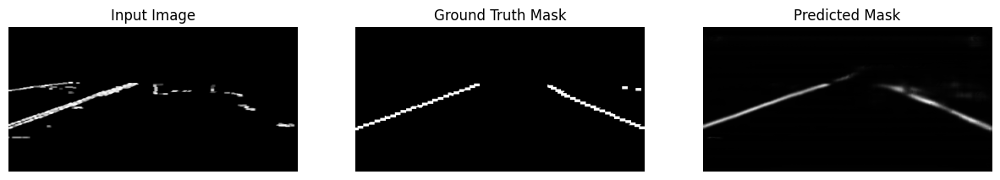

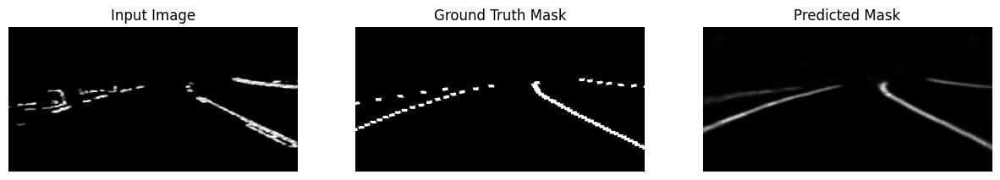

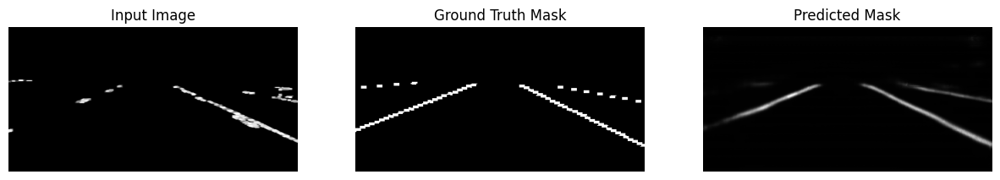

Epoch [59/50], Loss: 0.0006491032714692933
Visualizing predictions after epoch 60


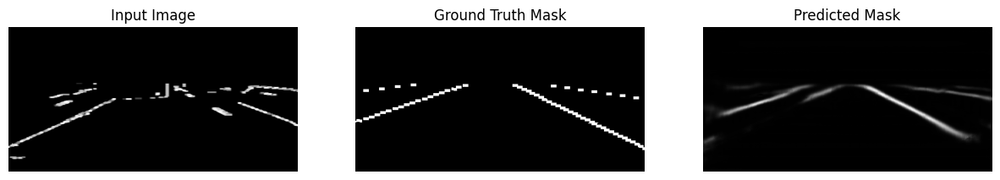

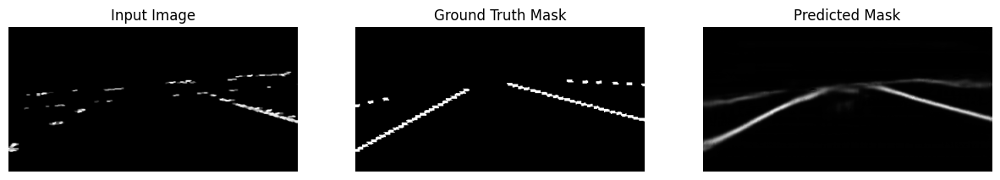

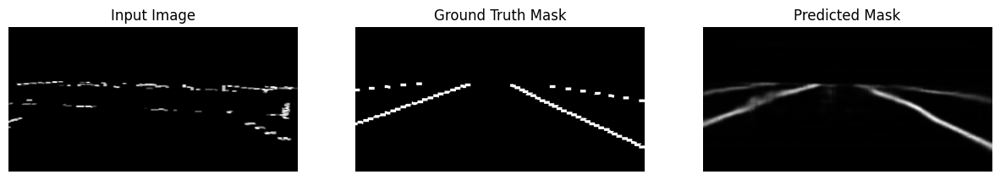

Epoch [60/50], Loss: 0.0006473783466714693
Visualizing predictions after epoch 61


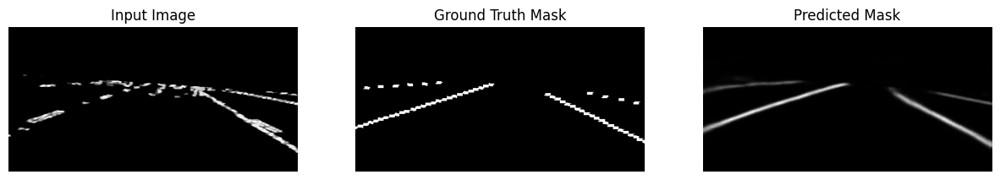

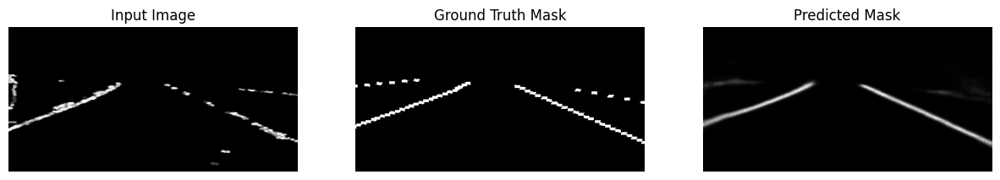

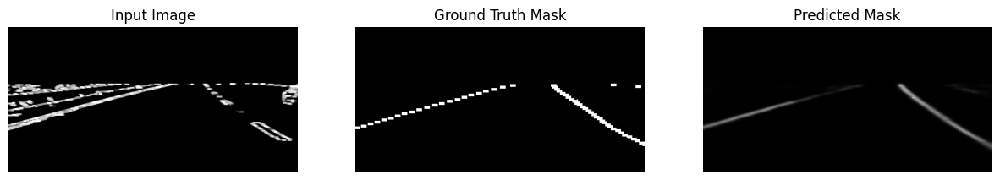

Epoch [61/50], Loss: 0.0006448507005357007
Visualizing predictions after epoch 62


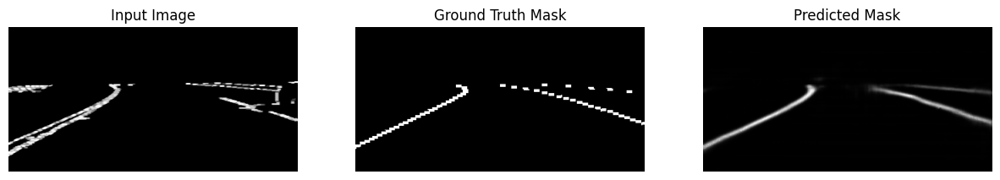

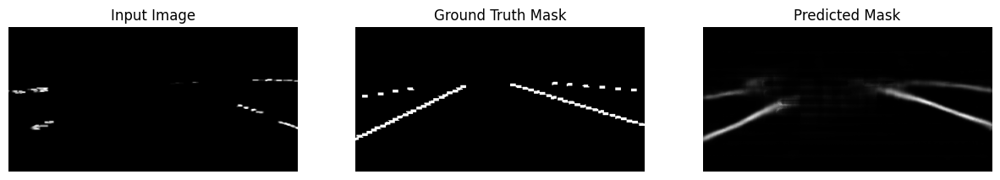

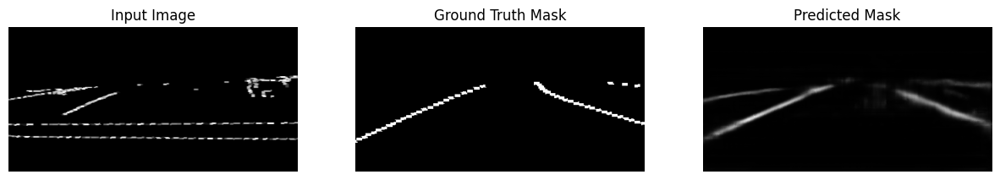

Epoch [62/50], Loss: 0.0006435509937269703
Visualizing predictions after epoch 63


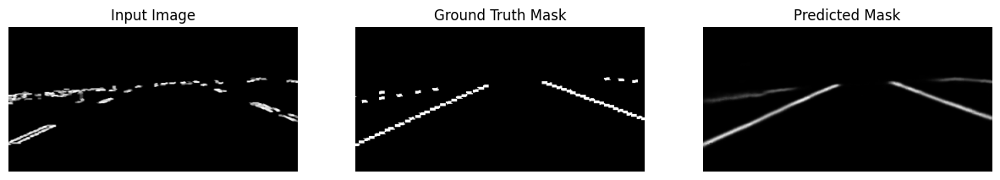

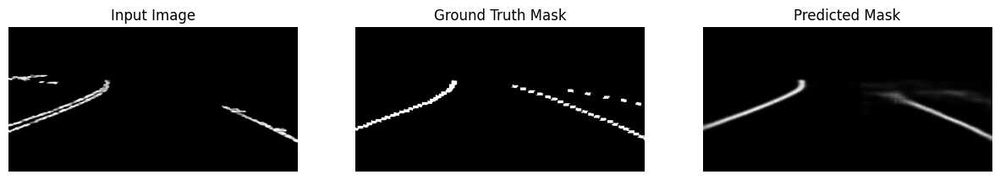

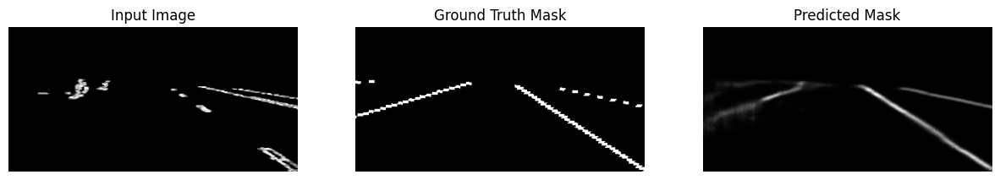

Epoch [63/50], Loss: 0.0006416740900086083
Visualizing predictions after epoch 64


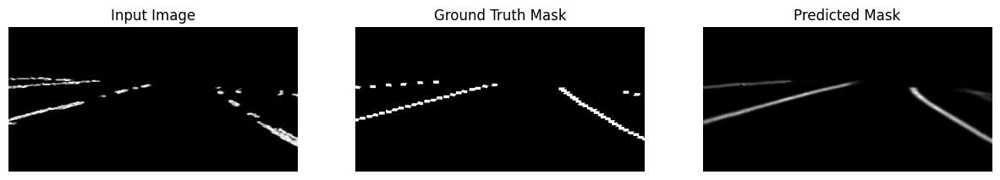

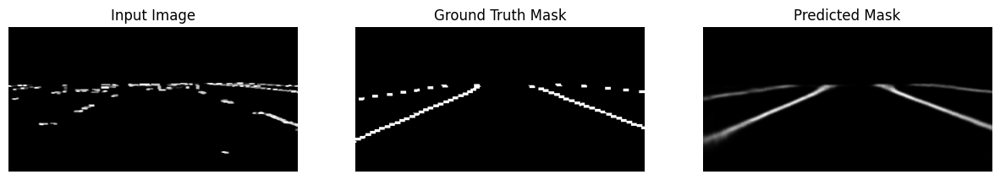

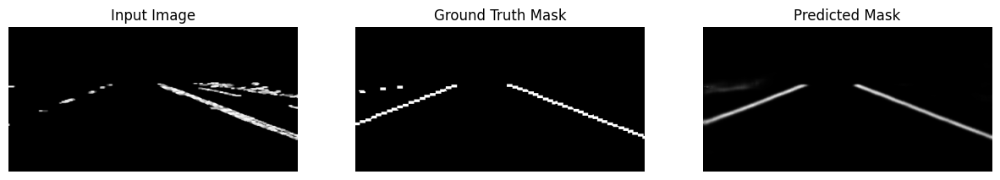

Epoch [64/50], Loss: 0.0006404516722038717
Visualizing predictions after epoch 65


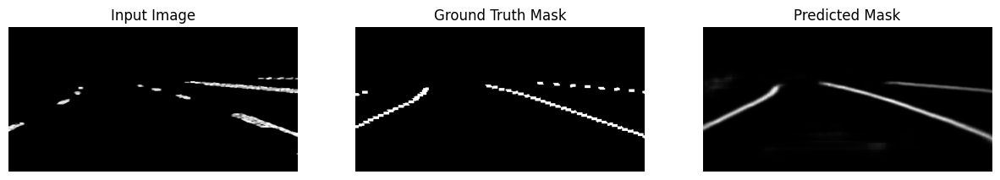

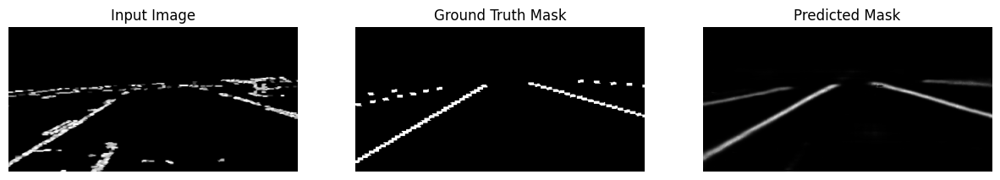

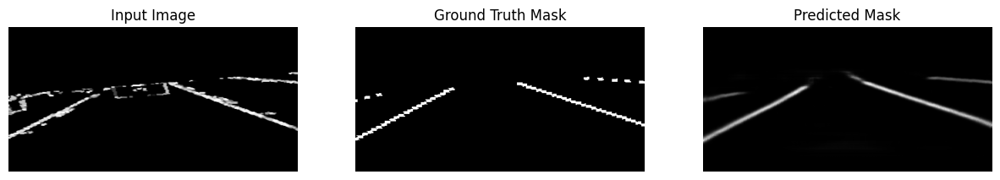

Epoch [65/50], Loss: 0.0006393844642294858
Visualizing predictions after epoch 66


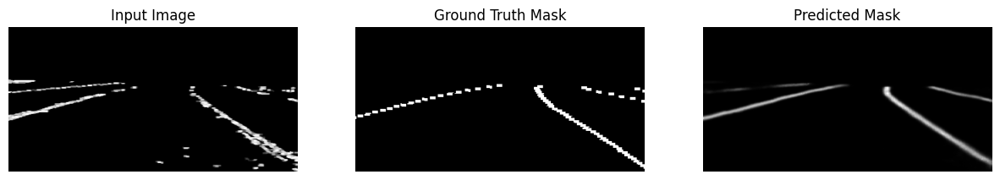

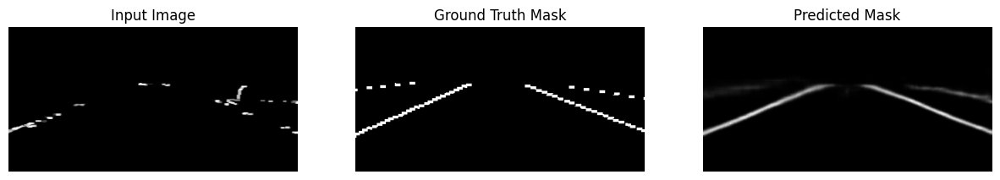

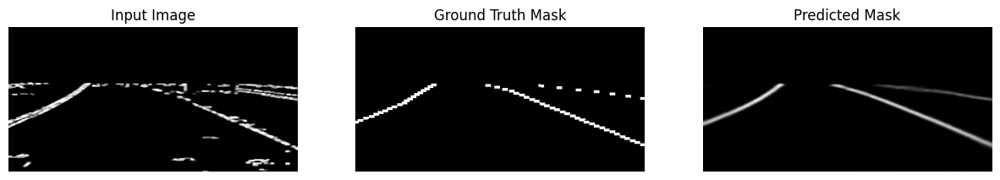

Epoch [66/50], Loss: 0.0006372500177665659
Visualizing predictions after epoch 67


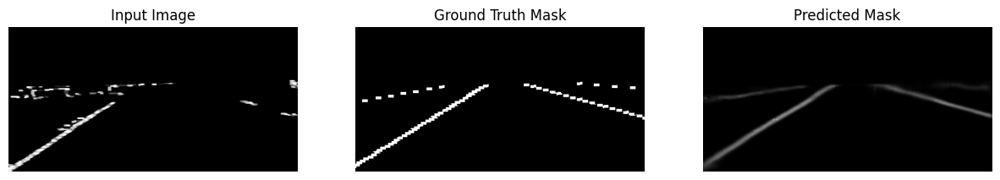

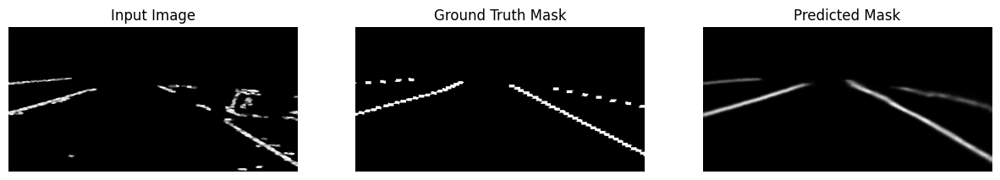

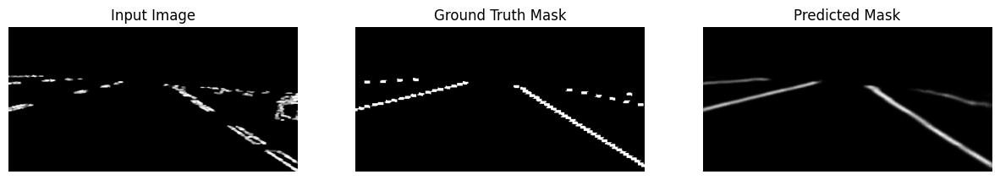

Epoch [67/50], Loss: 0.0006374773915061144
breaking to avoid overfitting


In [ ]:
import torch.optim as optim

# Initialize the U-Net model
device = torch.device('cuda:1')
model = UNet().to(device)
optimizer = optim.Adam(model.parameters(), lr=0.0001)
criterion = nn.BCELoss()  # Binary Cross Entropy for lane detection

# Load dataset and data loader
image_files = []  # List of image path
for temp_annotation in annotations:
    image_files.append('TUSimple/train_set/'+temp_annotation['raw_file'])
transform=CustomTransform(target_size=(256,512))
train_dataset = LaneDataset(image_files, annotations, transform=transform)
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=16, shuffle=True)
print(len(train_dataset))
# Training loop
prev=float('inf')
num_epochs = 50
epoch=0
while True:
    epoch+=1
    model.train()
    running_loss = 0.0

    for images, masks,_ in train_loader:
        images, masks = images.to(device), masks.to(device)

        

        # Zero the gradients
        optimizer.zero_grad()

        # Forward pass
        outputs = model(images)
        
        # Compute the loss
        loss = criterion(outputs, masks)

        # Backward pass and optimization
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()

    print(f"Visualizing predictions after epoch {epoch + 1}")
    visualize_predictions(model, train_loader, device, num_samples=3)
    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {running_loss / len(train_loader)}")
    if running_loss / len(train_loader) > prev:
        print('breaking to avoid overfitting')
        break
    else:
        prev=running_loss / len(train_loader)

In [120]:
torch.save(model.state_dict(), 'lane_detection_unet.pth')

3626
Visualizing predictions after epoch 1


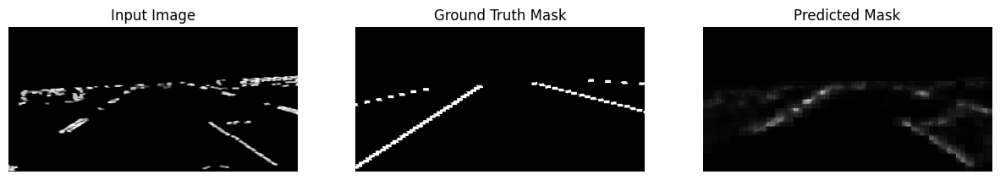

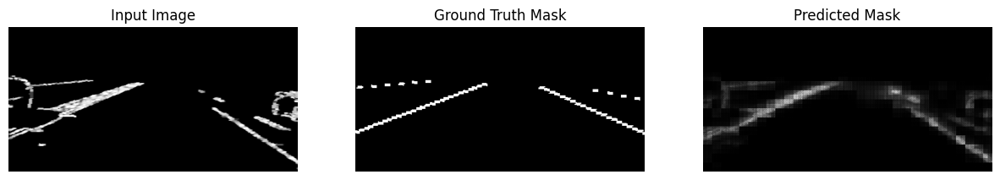

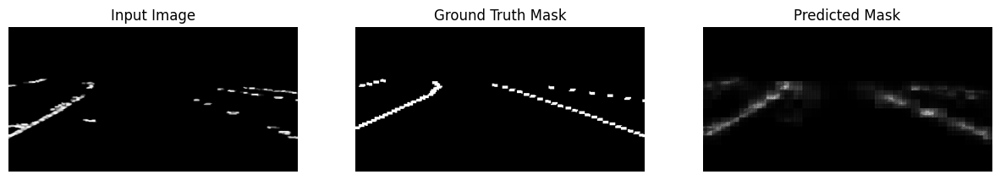

Epoch [1/50], Loss: 0.09003276442355038
Visualizing predictions after epoch 2


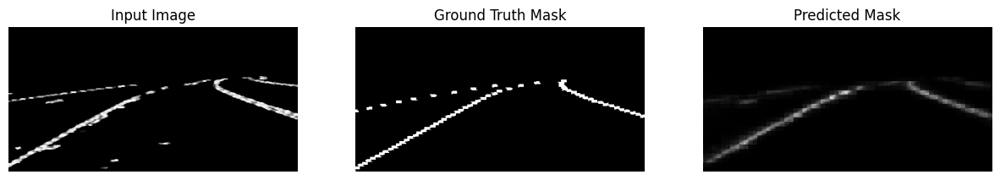

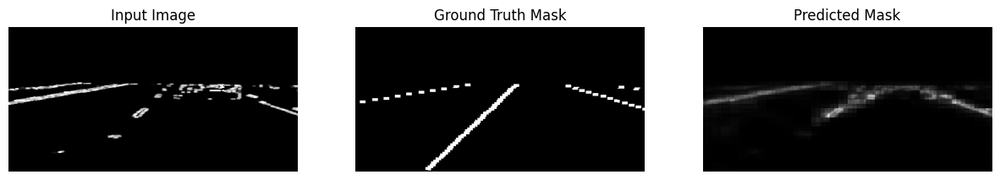

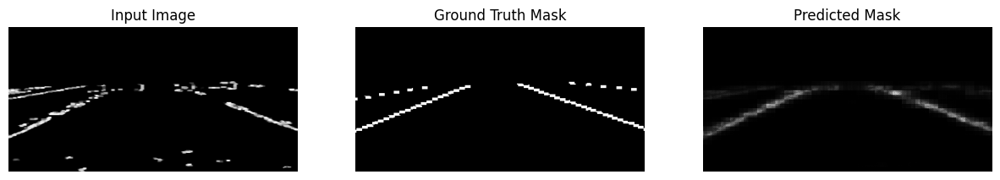

Epoch [2/50], Loss: 0.000715068493259964
Visualizing predictions after epoch 3


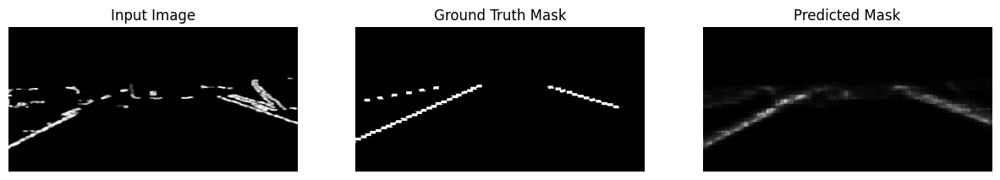

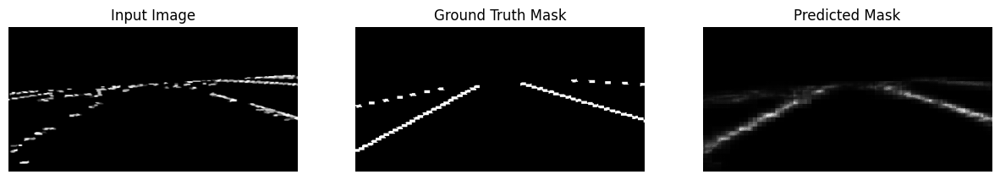

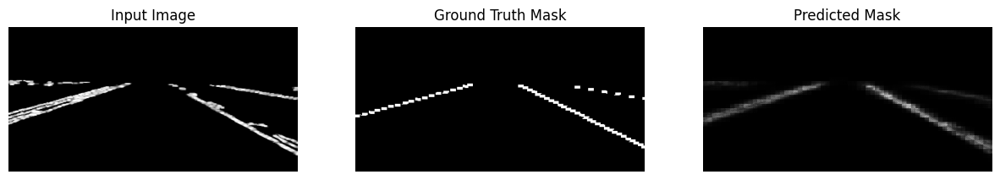

Epoch [3/50], Loss: 0.0006969502833692381
Visualizing predictions after epoch 4


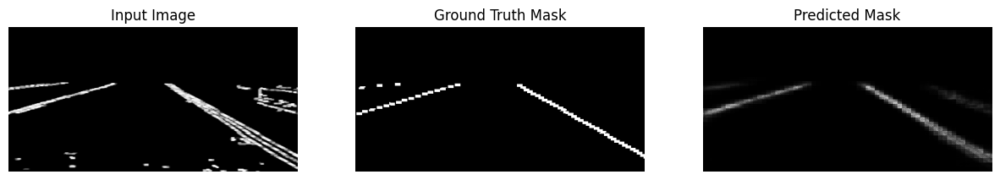

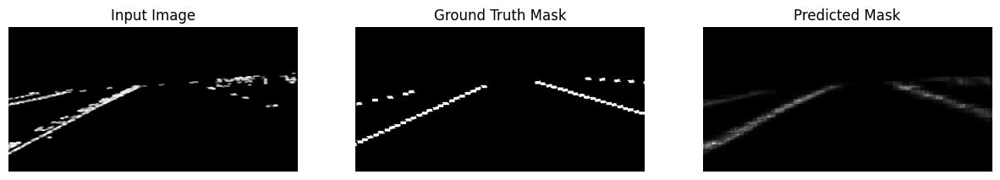

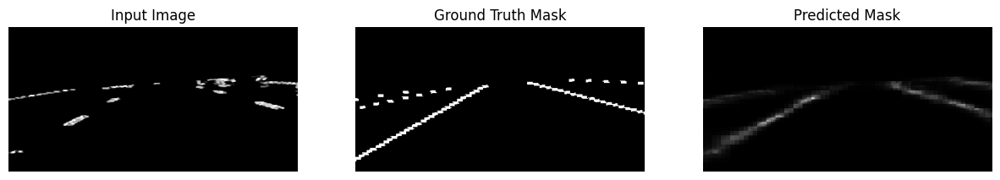

Epoch [4/50], Loss: 0.0006877104328670395
Visualizing predictions after epoch 5


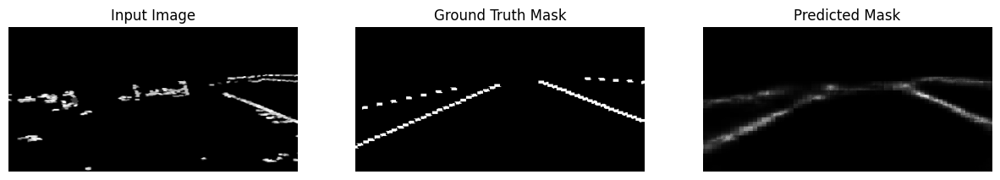

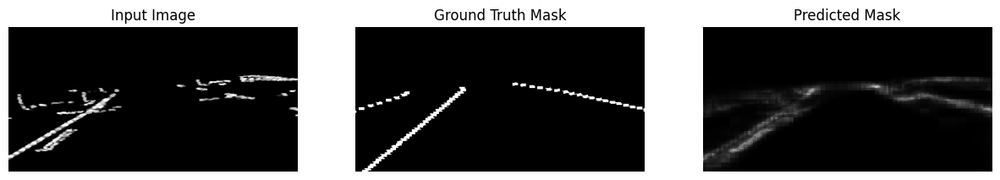

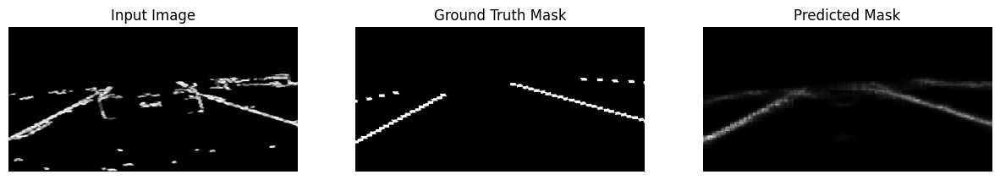

Epoch [5/50], Loss: 0.0006794198108467761
Visualizing predictions after epoch 6


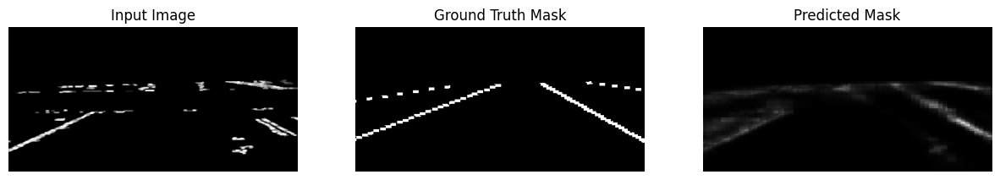

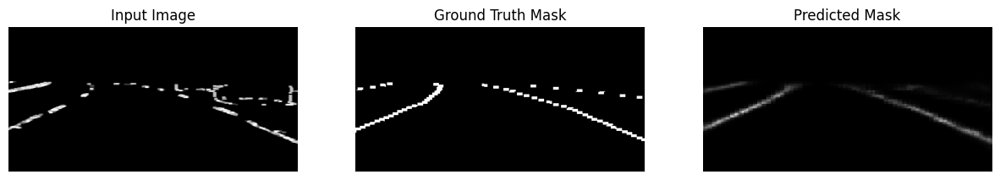

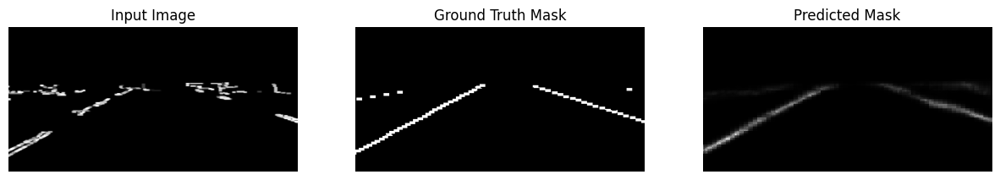

Epoch [6/50], Loss: 0.0006714091925483837
Visualizing predictions after epoch 7


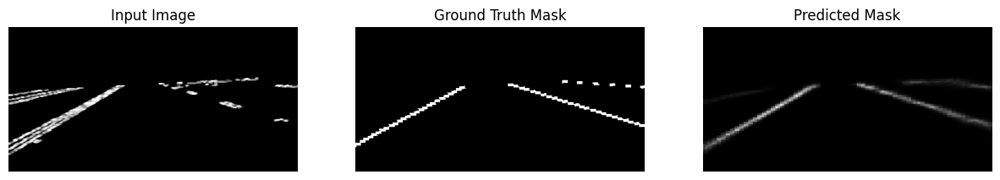

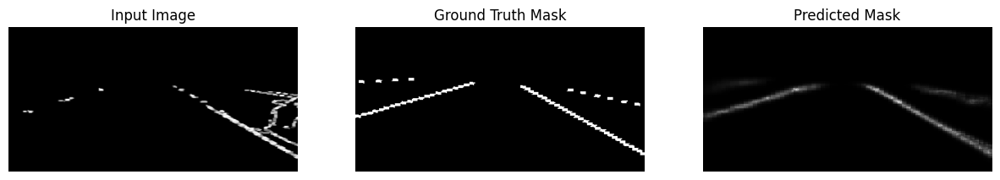

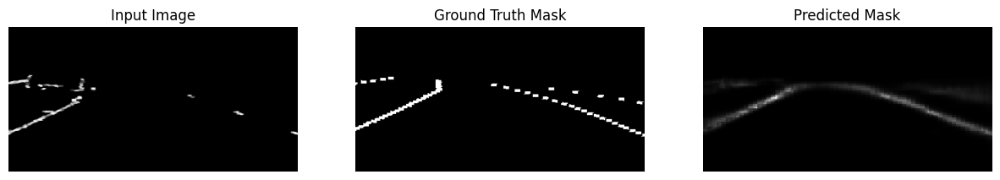

Epoch [7/50], Loss: 0.0006653907206750553
Visualizing predictions after epoch 8


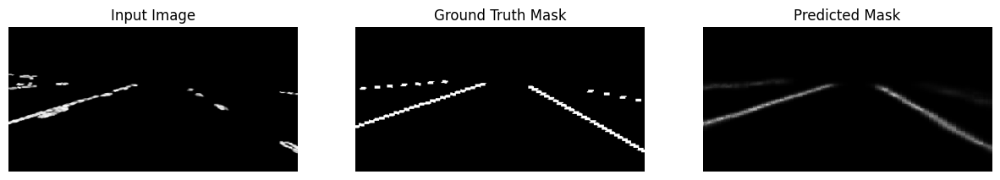

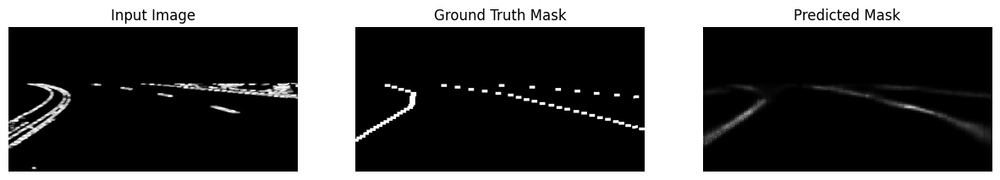

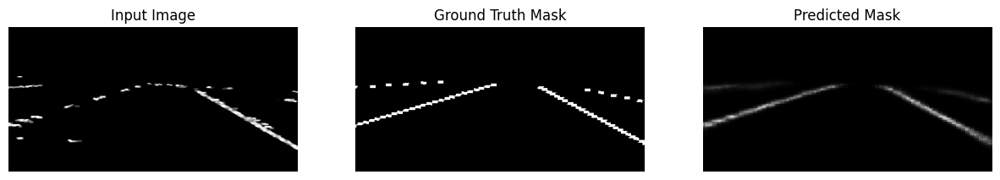

Epoch [8/50], Loss: 0.0006599820484120055
Visualizing predictions after epoch 9


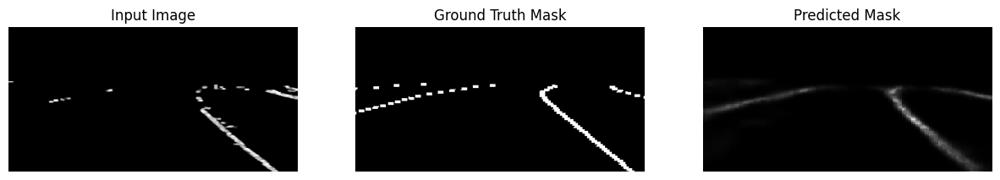

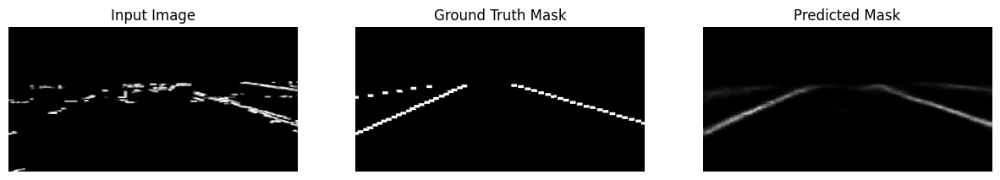

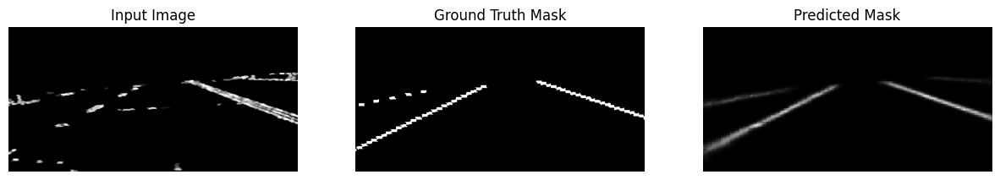

Epoch [9/50], Loss: 0.0006549694274843461
Visualizing predictions after epoch 10


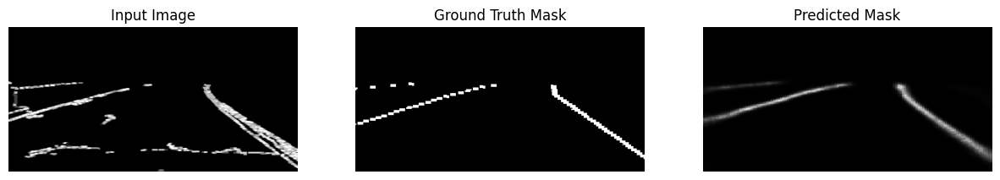

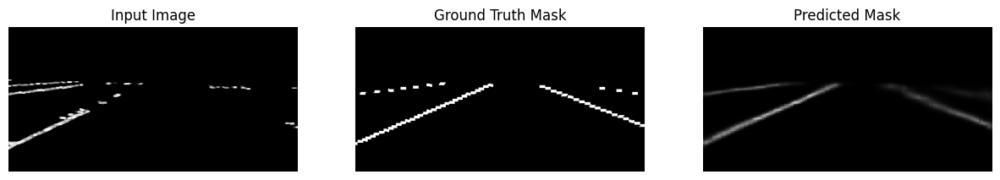

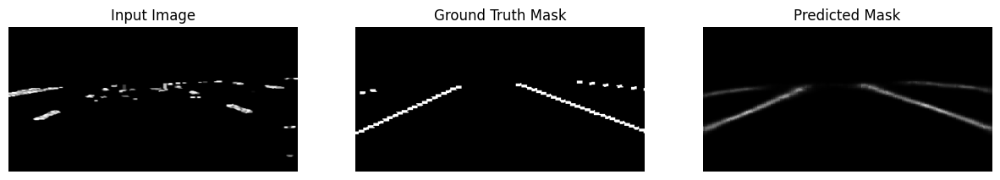

Epoch [10/50], Loss: 0.0006510495128200311
Visualizing predictions after epoch 11


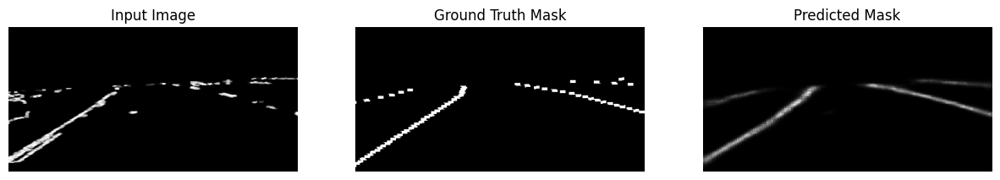

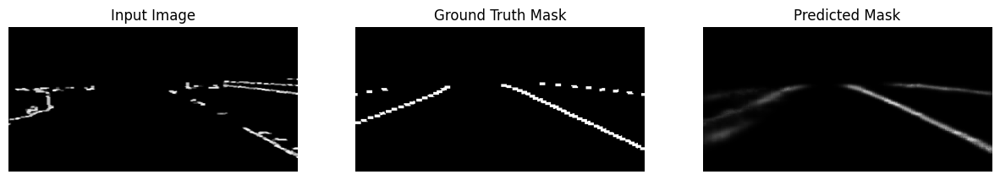

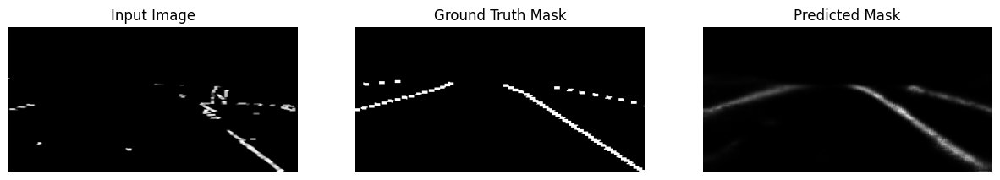

Epoch [11/50], Loss: 0.0006484160346434439
Visualizing predictions after epoch 12


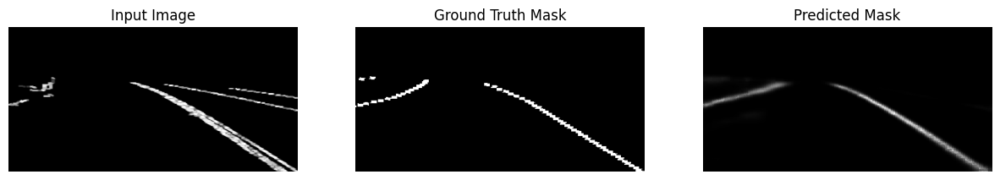

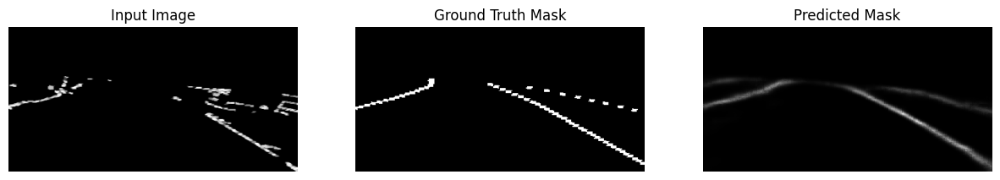

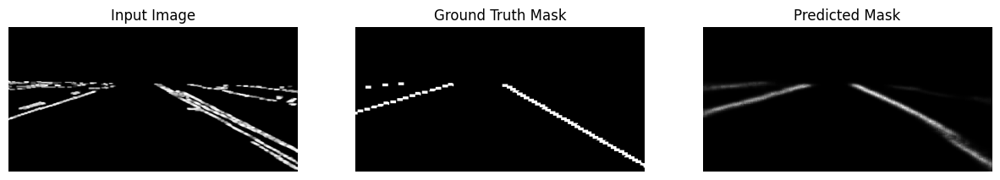

Epoch [12/50], Loss: 0.0006463216535135743
Visualizing predictions after epoch 13


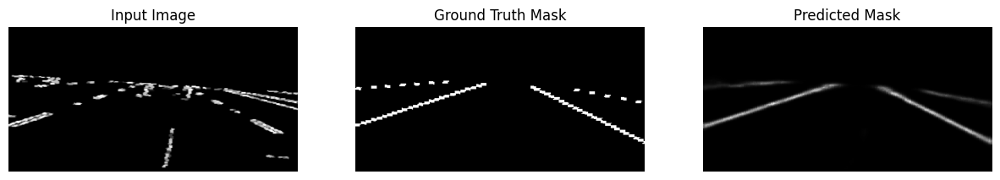

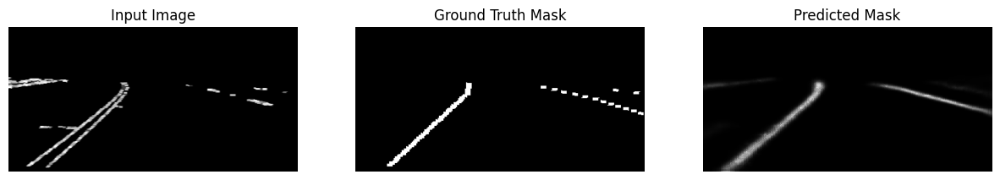

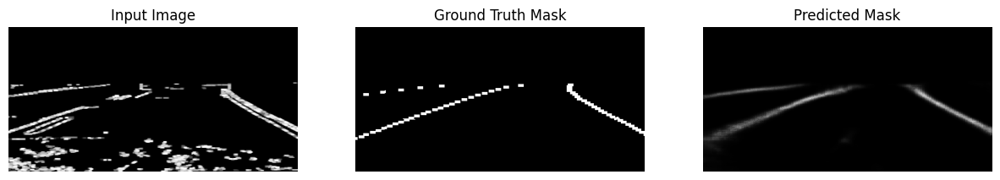

Epoch [13/50], Loss: 0.0006439253951459795
Visualizing predictions after epoch 14


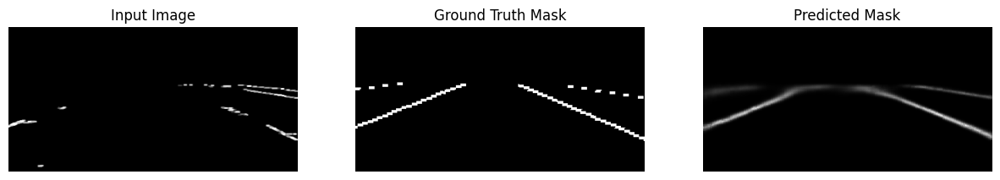

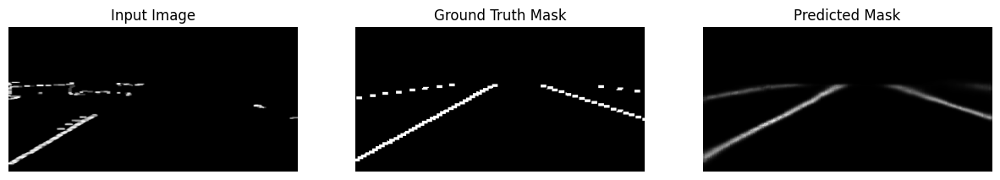

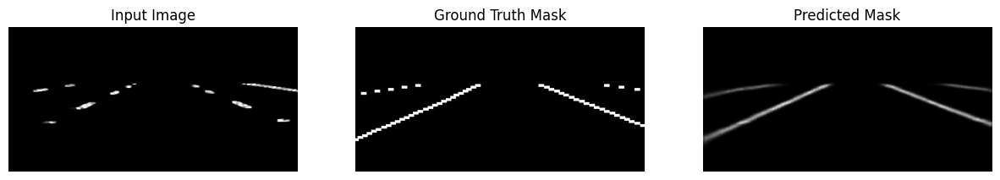

Epoch [14/50], Loss: 0.0006422551604201156
Visualizing predictions after epoch 15


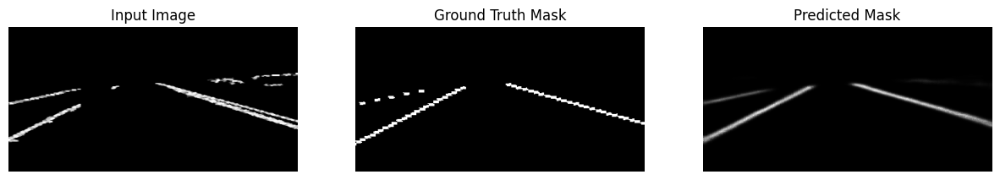

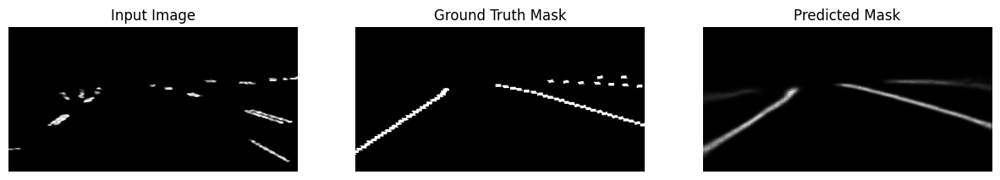

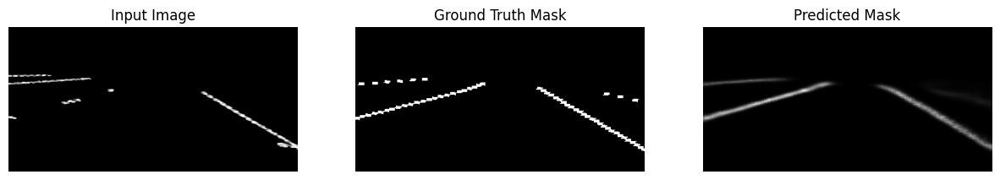

Epoch [15/50], Loss: 0.0006416573913333043
Visualizing predictions after epoch 16


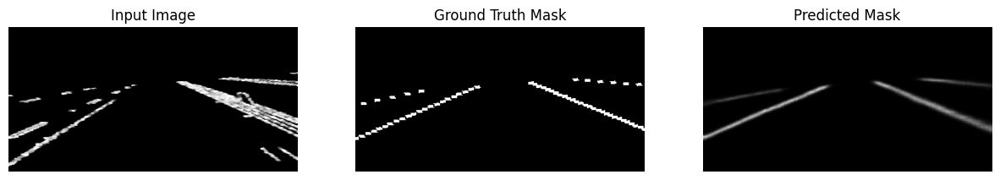

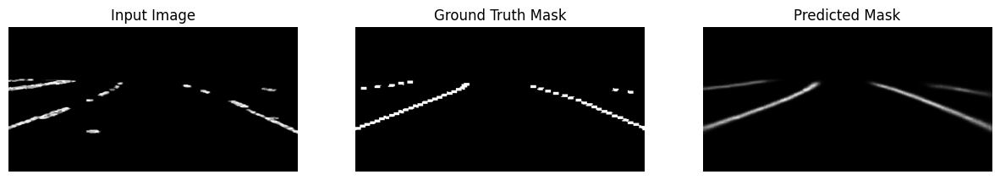

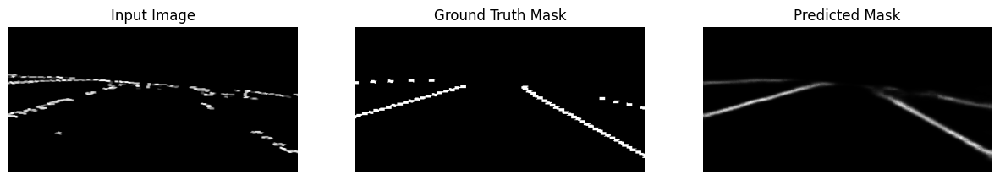

Epoch [16/50], Loss: 0.0006403376298058073
Visualizing predictions after epoch 17


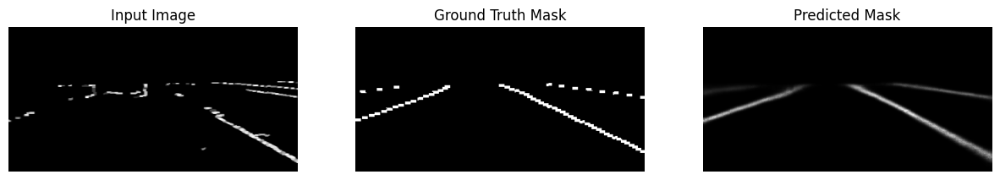

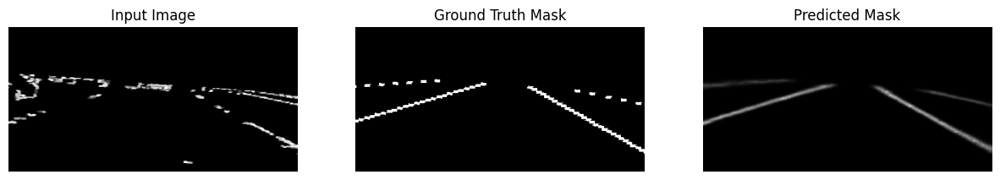

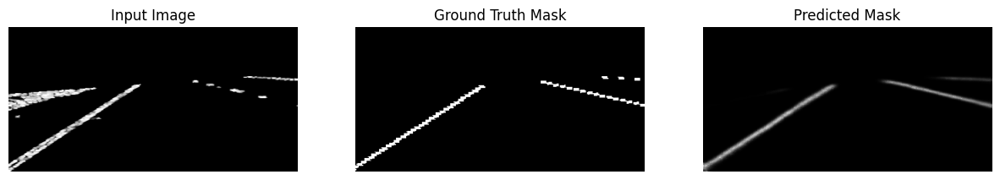

Epoch [17/50], Loss: 0.0006400325998668005
Visualizing predictions after epoch 18


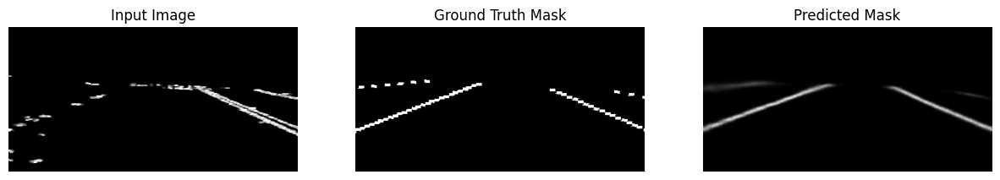

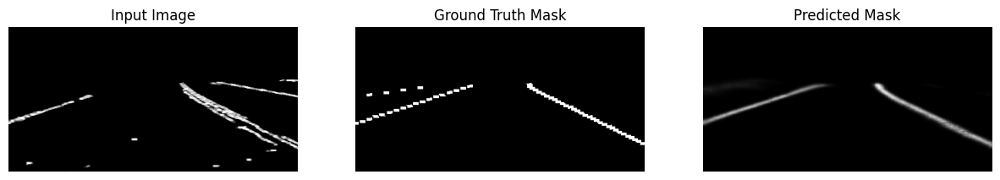

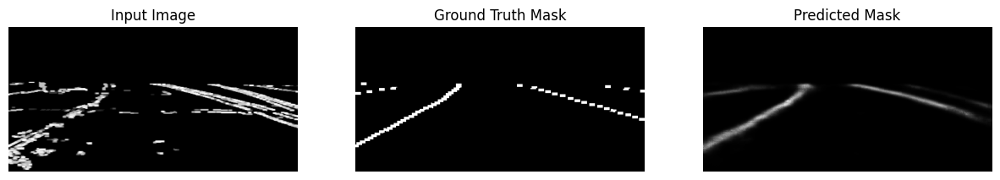

Epoch [18/50], Loss: 0.0006379278067454269
Visualizing predictions after epoch 19


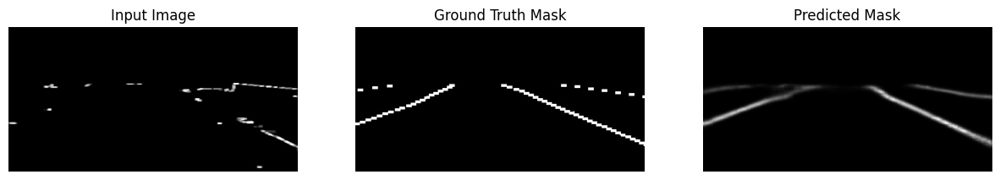

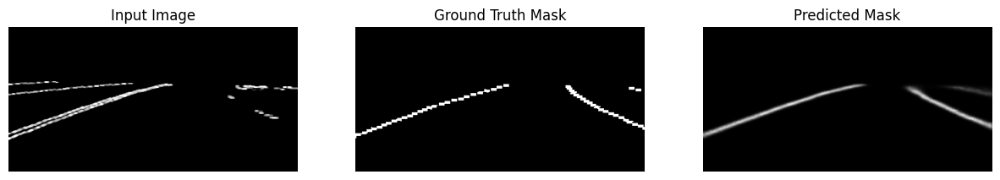

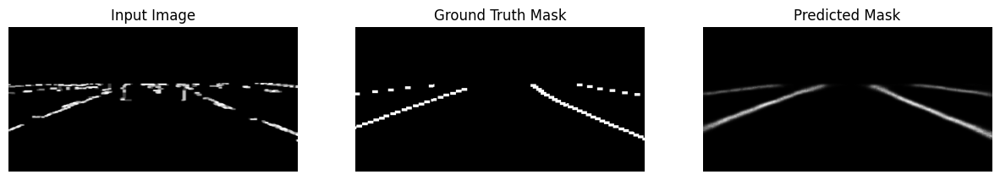

Epoch [19/50], Loss: 0.0006375468717087963
Visualizing predictions after epoch 20


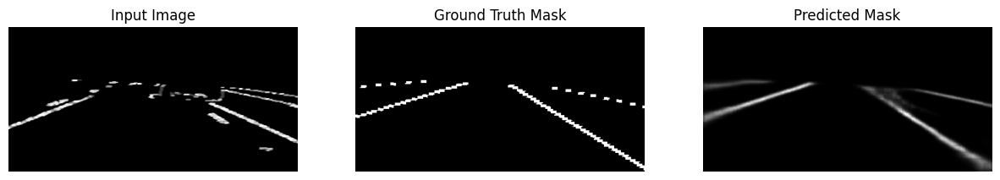

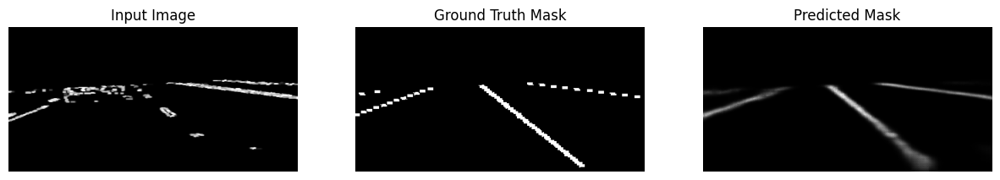

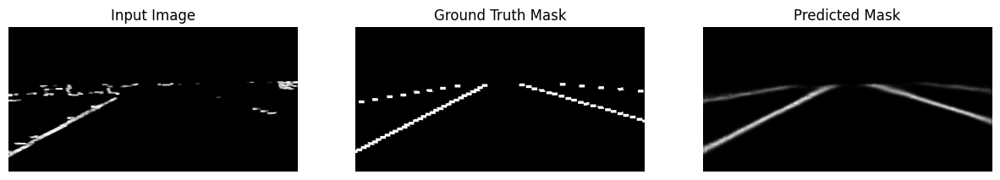

Epoch [20/50], Loss: 0.0006374737934008372
Visualizing predictions after epoch 21


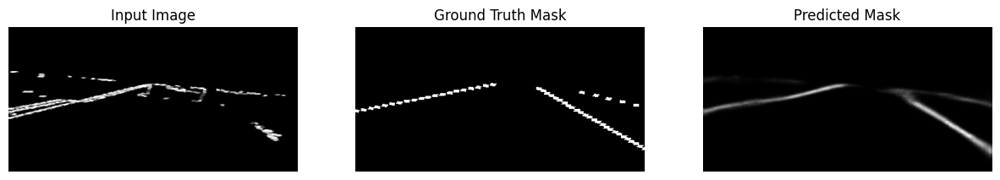

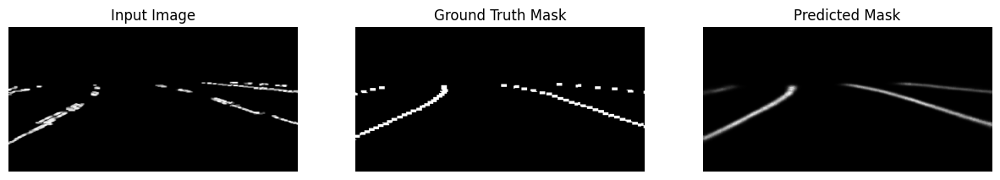

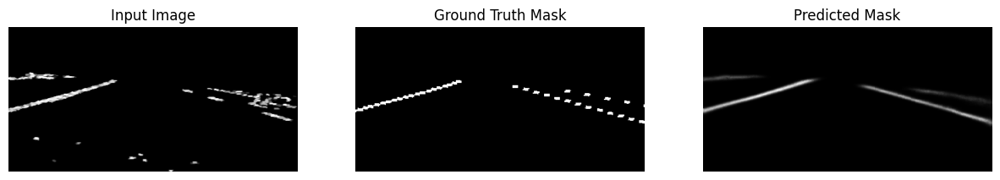

Epoch [21/50], Loss: 0.0006356534875297534
Visualizing predictions after epoch 22


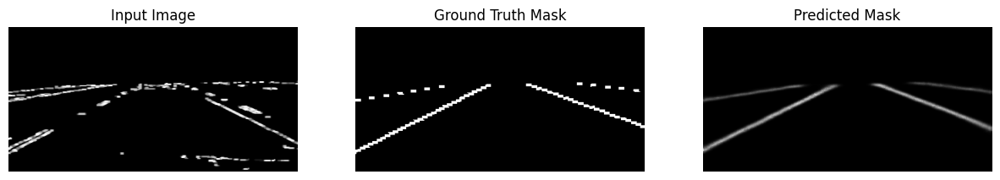

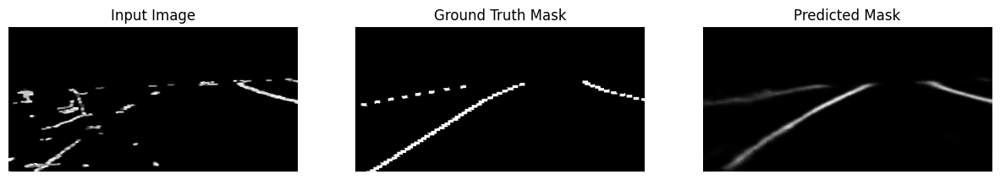

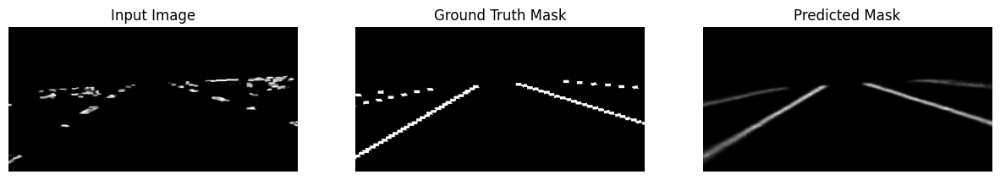

Epoch [22/50], Loss: 0.0006347525711499548
Visualizing predictions after epoch 23


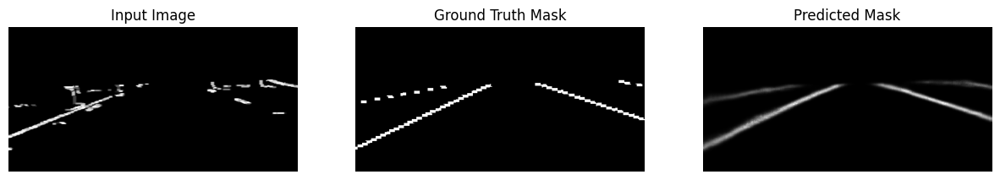

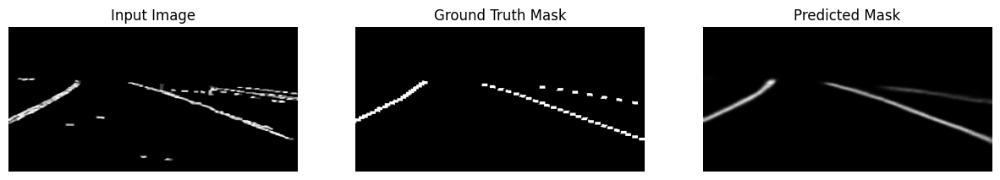

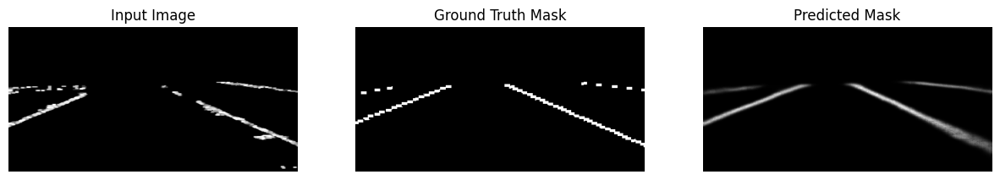

Epoch [23/50], Loss: 0.0006339229068448069
Visualizing predictions after epoch 24


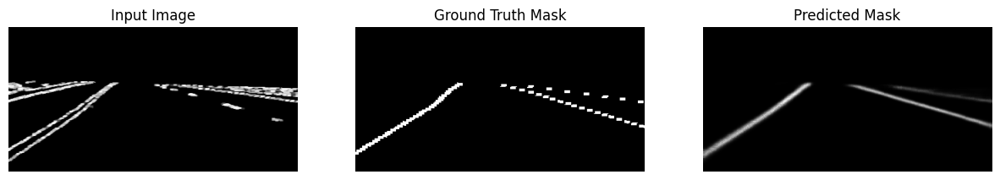

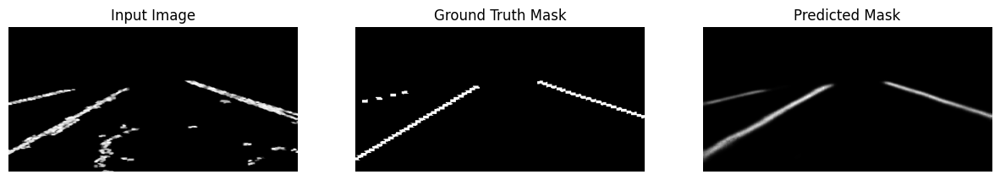

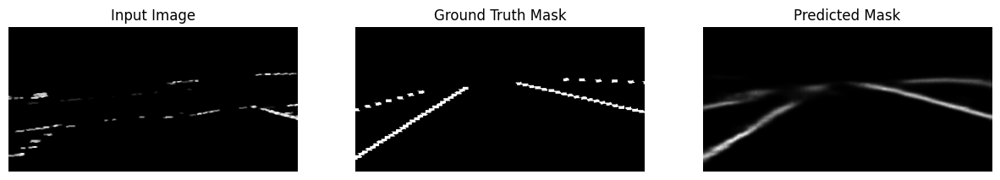

Epoch [24/50], Loss: 0.0006334928199259097
Visualizing predictions after epoch 25


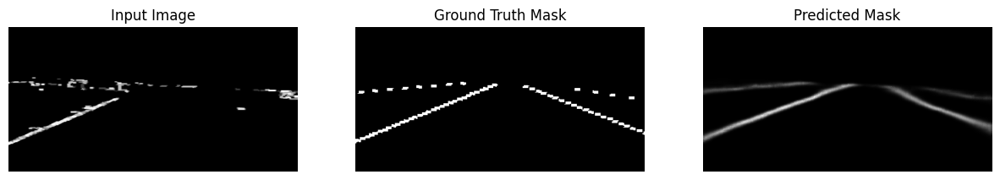

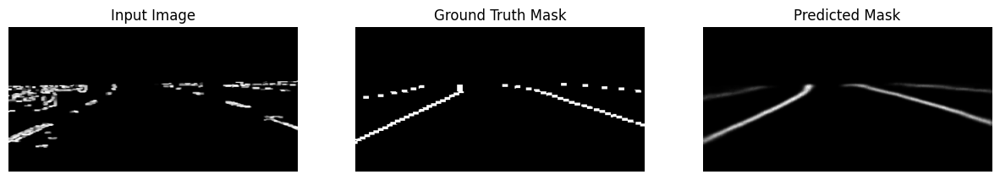

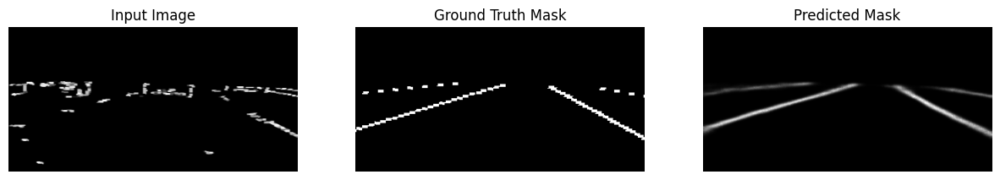

Epoch [25/50], Loss: 0.0006329080114030333
Visualizing predictions after epoch 26


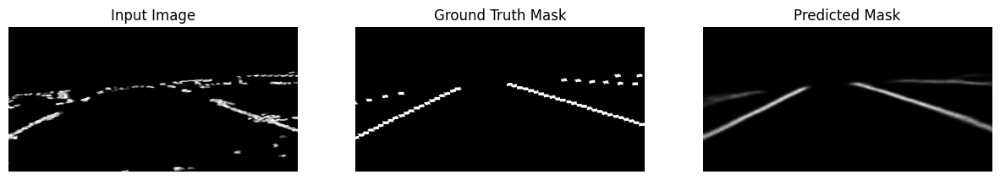

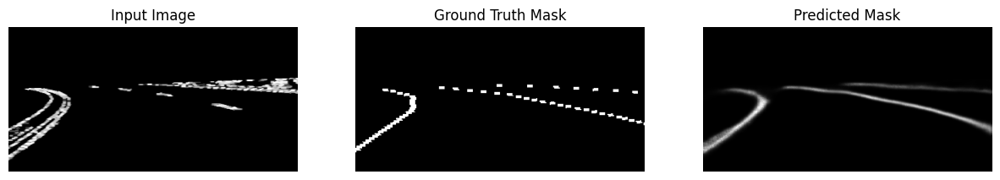

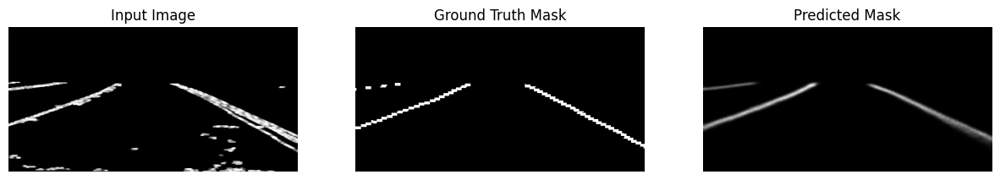

Epoch [26/50], Loss: 0.0006318062842343544
Visualizing predictions after epoch 27


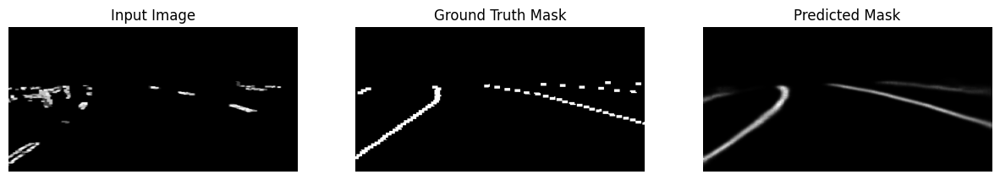

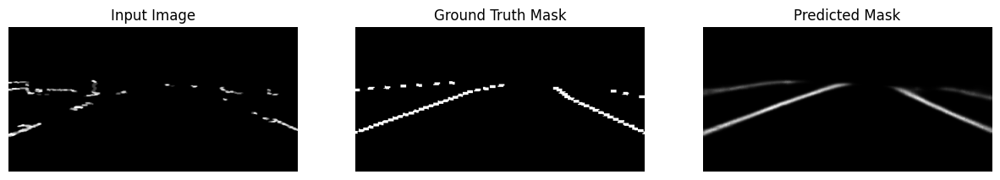

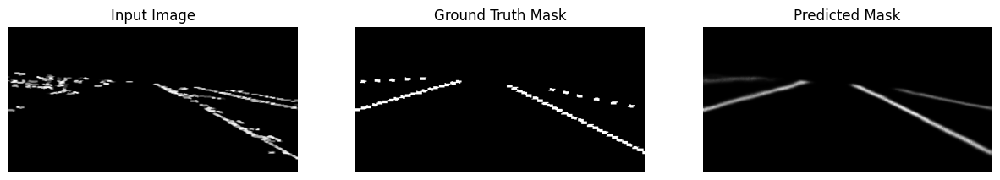

Epoch [27/50], Loss: 0.0006320755841571526
breaking to avoid overfitting


In [ ]:
import torch.optim as optim

# Initialize the U-Net model
device = torch.device('cuda:1')
model = CustomUNet().to(device)
optimizer = optim.Adam(model.parameters(), lr=0.0001)
criterion = nn.BCELoss()  # Binary Cross Entropy for lane detection

# Load dataset and data loader
image_files = []  # List of image path
for temp_annotation in annotations:
    image_files.append('TUSimple/train_set/'+temp_annotation['raw_file'])
transform=CustomTransform(target_size=(256,512))
train_dataset = LaneDataset(image_files, annotations, transform=transform)
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=16, shuffle=True)
print(len(train_dataset))
# Training loop
prev=float('inf')
num_epochs = 50
for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0

    for images, masks in train_loader:
        images, masks,_ = images.to(device), masks.to(device)

        # Zero the gradients
        optimizer.zero_grad()

        # Forward pass
        outputs = model(images)
        
        # Compute the loss
        loss = criterion(outputs, masks)

        # Backward pass and optimization
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()

    print(f"Visualizing predictions after epoch {epoch + 1}")
    visualize_predictions(model, train_loader, device, num_samples=3)
    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {running_loss / len(train_loader)}")
    if running_loss / len(train_loader) > prev:
        print('breaking to avoid overfitting')
        break
    else:
        prev=running_loss / len(train_loader)

In [125]:
torch.save(model.state_dict(), 'lane_detection_customnet.pth')

In [12]:
model_net=UNet()
model_net.load_state_dict(torch.load("lane_detection_unet.pth", map_location=torch.device('cpu')))
model_net.eval()

/var/folders/zr/gzwryy5s75s63h4qbx6269tc0000gn/T/ipykernel_14227/109508311.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model_net.load_state_dict(torch.load("lane_det

UNet(
  (enc1): Sequential(
    (0): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
  )
  (enc2): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
  )
  (enc3): Sequential(
    (0): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_r

In [13]:
model_customnet=CustomUNet()
model_customnet.load_state_dict(torch.load("lane_detection_customnet.pth", map_location=torch.device('cpu')))
model_customnet.eval()

/var/folders/zr/gzwryy5s75s63h4qbx6269tc0000gn/T/ipykernel_14227/4181156205.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model_customnet.load_state_dict(torch.load("l

CustomUNet(
  (enc1): ResidualBlock(
    (conv1): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (residual_conv): Conv2d(1, 64, kernel_size=(1, 1), stride=(1, 1))
  )
  (enc2): ResidualBlock(
    (conv1): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (bn1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (bn2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (residual_conv): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1))
  )
  (enc3): ResidualBlock(
    (conv1): Conv

2782


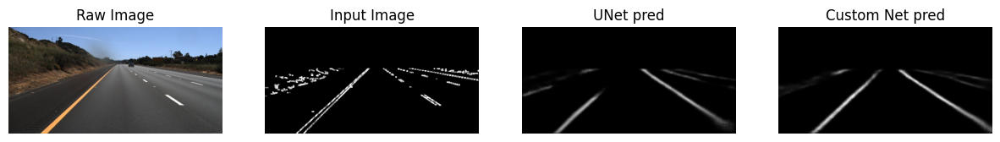

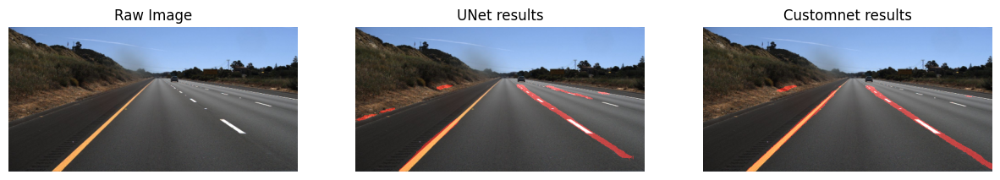

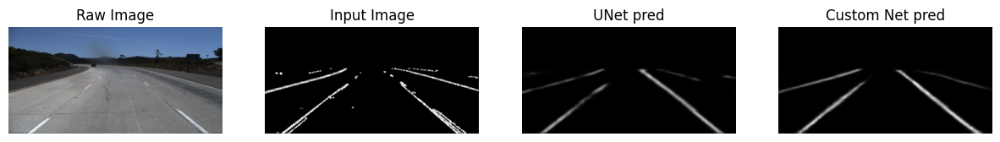

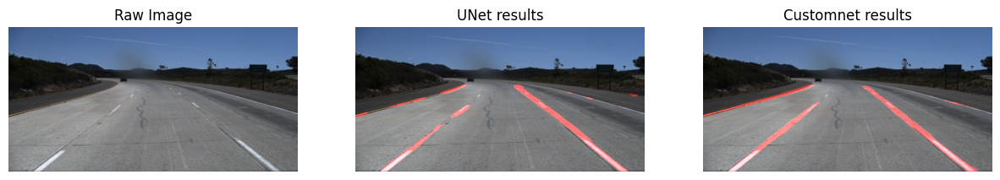

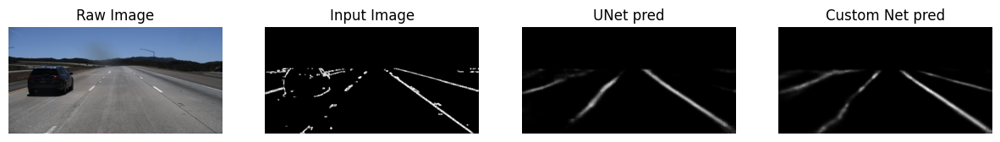

...

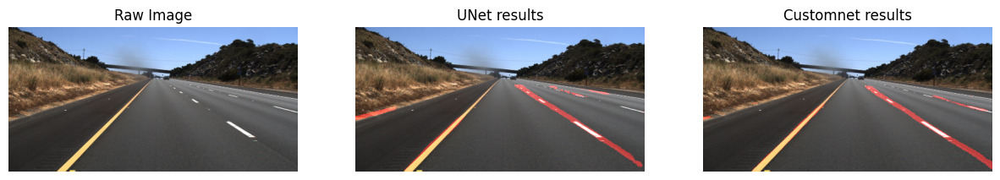

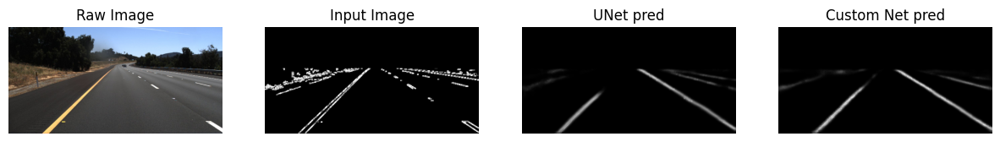

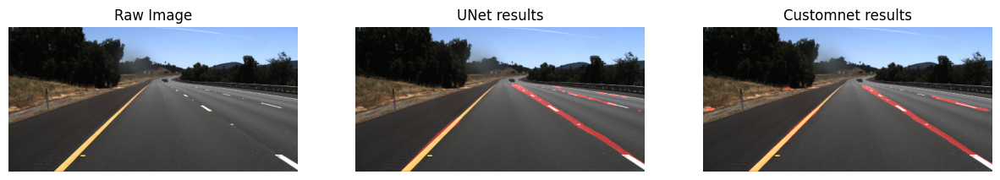

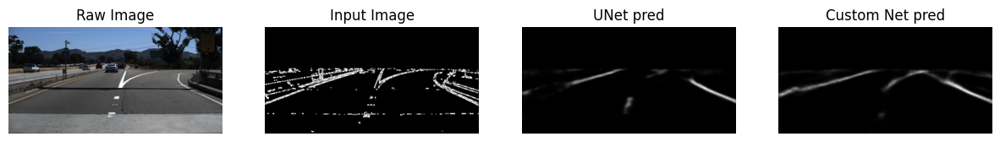

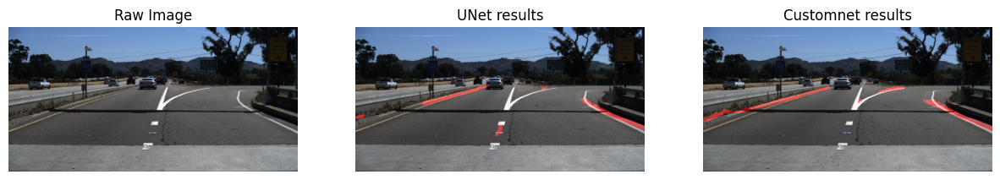

In [16]:
test_image_files = []
for temp_annotation in test_annotations:
    test_image_files.append('TUSimple/test_set/'+temp_annotation['raw_file'])
# transform=CustomTransform(target_size=(256,512))
test_dataset = LaneDataset(test_image_files, test_annotations, transform=TestTransform(target_size=(256, 512)), apply_transform=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=16,shuffle=False)
print(len(test_dataset))
visualize_test_results(model_net, model_customnet, test_loader, 'cpu', num_samples=10)


In [14]:
video_test_transform = VideoTestTransform(target_size=(256, 512))

def create_header(text, width, height=50, font=cv2.FONT_HERSHEY_SIMPLEX, font_scale=1, thickness=2):
    header = np.ones((height, width, 3), dtype=np.uint8) * 255  # White background
    text_size = cv2.getTextSize(text, font, font_scale, thickness)[0]
    text_x = (width - text_size[0]) // 2
    text_y = (height + text_size[1]) // 2
    cv2.putText(header, text, (text_x, text_y), font, font_scale, (0, 0, 0), thickness, cv2.LINE_AA)
    return header

def preprocess_image(frame, target_size=(256, 512)):
    gray_image = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    blurred_image = cv2.GaussianBlur(gray_image, (5, 5), 0)
    edges = cv2.Canny(blurred_image, threshold1=50, threshold2=150)

    horizontal_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (15, 1))
    horizontal_edges = cv2.morphologyEx(edges, cv2.MORPH_OPEN, horizontal_kernel)
    edges_no_horizontal = cv2.subtract(edges, horizontal_edges)

    edges_no_horizontal[:100, :] = 0  # Black out top 100 pixels
    normalized_image = edges_no_horizontal / 255.0
    resized_image = cv2.resize(normalized_image, target_size)
    resized_image[:100, :] = 0  # Black out top 100 pixels again after resizing
    filled_edges = fill_lane_markings(resized_image, kernel_size=3, dilate_iterations=1)

    return filled_edges

def apply_lane_detection(frame, model1, device):
    # Convert the frame to RGB and PIL format, then apply TestTransform
    preprocessed_frame = preprocess_image(frame)

    # Convert preprocessed image to PIL format and apply VideoTestTransform
    input_image = Image.fromarray((preprocessed_frame * 255).astype(np.uint8))  # Scale back to [0, 255]
    input_tensor = video_test_transform(input_image).unsqueeze(0).to(device)  # Apply transform

    # Model predictions
    with torch.no_grad():
        output1 = model1(input_tensor)
        output1=output1.cpu().squeeze().numpy()
        
        # Convert outputs to binary masks
        pred_mask1 = (output1 > 0.001).astype(np.uint8)

    # Resize the masks to the original frame size
    pred_mask1 = cv2.resize(pred_mask1, (frame.shape[1], frame.shape[0]))

    # Create color overlays for each model's prediction
    color_overlay1 = np.zeros_like(frame)
    color_overlay1[:, :, 2] = pred_mask1 * 255  # Green overlay for Model 1

    # Combine both overlays with transparency
    overlayed_frame = cv2.addWeighted(frame, 1, color_overlay1, 0.5, 0)

    return overlayed_frame


# Main function to process and save video with predictions from both models
def process_side_by_side_video(input_video_path, output_video_path, model1, model2, device='cpu', duration=4):
    model1.to(device)
    model2.to(device)
    model1.eval()
    model2.eval()

    cap = cv2.VideoCapture(input_video_path)
    if not cap.isOpened():
        print(f"Error: Could not open video {input_video_path}")
        return

    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps = cap.get(cv2.CAP_PROP_FPS)
    max_frames = int(fps * duration)

    header_height = 50
    out = cv2.VideoWriter(output_video_path, cv2.VideoWriter_fourcc(*'mp4v'), fps, (width * 3, height + header_height))

    frame_count = 0
    while cap.isOpened() and frame_count < max_frames:
        ret, frame = cap.read()
        if not ret:
            break

        # Get predictions for each model
        model1_prediction = apply_lane_detection(frame, model1, device)
        model2_prediction = apply_lane_detection(frame, model2, device)

        # Create headers for each segment
        header1 = create_header("Unet Prediction", width, height=header_height)
        header2 = create_header("Original Video", width, height=header_height)
        header3 = create_header("Custom UNet Prediction", width, height=header_height)

        # Stack headers above each segment
        model1_with_header = np.vstack((header1, model1_prediction))
        original_with_header = np.vstack((header2, frame))
        model2_with_header = np.vstack((header3, model2_prediction))

        # Concatenate the three segments horizontally
        combined_frame = np.concatenate(( original_with_header,model1_with_header, model2_with_header), axis=1)

        # Write to output video
        out.write(combined_frame)

        frame_count += 1

    cap.release()
    out.release()
    cv2.destroyAllWindows()
    print(f"Processed side-by-side video with headers saved to {output_video_path}")





In [ ]:
device = 'cpu'
model1 = model_net  # Replace with your first model instance
model2 = model_customnet  # Replace with your second model instance
input_video_paths = ["videos/nD_14.mp4", "videos/nN_11.mp4", "videos/rD_14.mp4", "videos/test_video.mp4","videos/monza-fastest.mp4"]
# input_video_paths = ["videos/nD_14.mp4"]

for idx, video_path in enumerate(input_video_paths):
    output_path = f"output_video_model_comparison_{idx + 1}.mp4"
    process_side_by_side_video(video_path, output_path, model1, model2, device)

In [15]:
fps = 20 
header_height = 50  

def process_folders_to_video(folders, output_video_path, model1, model2, device='cpu'):
    model1.to(device)
    model2.to(device)
    model1.eval()
    model2.eval()

    # Get sample frame dimensions for video output size
    sample_frame = cv2.imread(os.path.join(folders[0], sorted(os.listdir(folders[0]))[0]))
    height, width, _ = sample_frame.shape
    out_width = width * 3  # Concatenate original, model1, model2 horizontally

    # Initialize VideoWriter
    out = cv2.VideoWriter(output_video_path, cv2.VideoWriter_fourcc(*'mp4v'), fps, (out_width, height + header_height))

    # Process each folder
    for folder in folders:
        frame_files = sorted(os.listdir(folder),key=lambda x: int(x.split('.')[0]))
        print(frame_files)
        
        for frame_file in frame_files:
            frame_path = os.path.join(folder, frame_file)
            frame = cv2.imread(frame_path)

            # Generate model predictions
            model1_prediction = apply_lane_detection(frame, model1, device)
            model2_prediction = apply_lane_detection(frame, model2, device)

            # Create headers
            header1 = create_header("Unet Prediction", width, height=header_height)
            header2 = create_header("Original Video", width, height=header_height)
            header3 = create_header("Custom Unet Prediction", width, height=header_height)

            # Stack headers and frames
            original_with_header = np.vstack((header2, frame))
            model1_with_header = np.vstack((header1, model1_prediction))
            
            model2_with_header = np.vstack((header3, model2_prediction))

            # Concatenate the frames horizontally
            combined_frame = np.concatenate(( original_with_header, model1_with_header, model2_with_header), axis=1)

            # Write the combined frame to the video
            out.write(combined_frame)

    # Release resources
    out.release()
    cv2.destroyAllWindows()
    print(f"Processed video saved to {output_video_path}")




In [16]:
folders = ["TUSimple/test_set/clips/0530/1492626224112349377_0", "TUSimple/test_set/clips/0530/1492626333048395643_0", "TUSimple/test_set/clips/0531/1492626720211673794", "TUSimple/test_set/clips/0531/1492627794294178571", "TUSimple/test_set/clips/0601/1494452649476239215","TUSimple/test_set/clips/0530/1492628365714746456_0","TUSimple/test_set/clips/0530/1492629750677018212_0","TUSimple/test_set/clips/0531/1492636817429327121",
           "TUSimple/test_set/clips/0531/1492729736271950741","TUSimple/test_set/clips/0531/1495489721550725241","TUSimple/test_set/clips/0601/1494452673465751161"]



device = 'cpu'
model1 = model_net  # Replace with your first model instance
model2 = model_customnet  # Replace with your second model instance
output_video_path = "output_collated_video.mp4"

process_folders_to_video(folders, output_video_path, model1, model2, device)

['1.jpg', '2.jpg', '3.jpg', '4.jpg', '5.jpg', '6.jpg', '7.jpg', '8.jpg', '9.jpg', '10.jpg', '11.jpg', '12.jpg', '13.jpg', '14.jpg', '15.jpg', '16.jpg', '17.jpg', '18.jpg', '19.jpg', '20.jpg']
['1.jpg', '2.jpg', '3.jpg', '4.jpg', '5.jpg', '6.jpg', '7.jpg', '8.jpg', '9.jpg', '10.jpg', '11.jpg', '12.jpg', '13.jpg', '14.jpg', '15.jpg', '16.jpg', '17.jpg', '18.jpg', '19.jpg', '20.jpg']
['1.jpg', '2.jpg', '3.jpg', '4.jpg', '5.jpg', '6.jpg', '7.jpg', '8.jpg', '9.jpg', '10.jpg', '11.jpg', '12.jpg', '13.jpg', '14.jpg', '15.jpg', '16.jpg', '17.jpg', '18.jpg', '19.jpg', '20.jpg']
['1.jpg', '2.jpg', '3.jpg', '4.jpg', '5.jpg', '6.jpg', '7.jpg', '8.jpg', '9.jpg', '10.jpg', '11.jpg', '12.jpg', '13.jpg', '14.jpg', '15.jpg', '16.jpg', '17.jpg', '18.jpg', '19.jpg', '20.jpg']
['1.jpg', '2.jpg', '3.jpg', '4.jpg', '5.jpg', '6.jpg', '7.jpg', '8.jpg', '9.jpg', '10.jpg', '11.jpg', '12.jpg', '13.jpg', '14.jpg', '15.jpg', '16.jpg', '17.jpg', '18.jpg', '19.jpg', '20.jpg']
['1.jpg', '2.jpg', '3.jpg', '4.jpg', '5.

In [9]:
new_width=512
new_height=256

def preprocess_image(image):
        gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        cv2.imshow('grayscale',gray_image)
        cv2.waitKey(0)  # Waits until you press any key
        cv2.destroyAllWindows()
        # Step 2: Apply Gaussian blur to reduce noise
        blurred_image = cv2.GaussianBlur(gray_image, (5, 5), 0)
        cv2.imshow('guassian blur',blurred_image)
        cv2.waitKey(0)  # Waits until you press any key
        cv2.destroyAllWindows()
        # Step 3: Apply Canny edge detection to get all edges
        edges = cv2.Canny(blurred_image, threshold1=50, threshold2=150)
        cv2.imshow('Canny edge',edges)
        cv2.waitKey(0)  # Waits until you press any key
        cv2.destroyAllWindows()
        # Step 4: Detect horizontal edges
        horizontal_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (15, 1))  # Horizontal kernel
        horizontal_edges = cv2.morphologyEx(edges, cv2.MORPH_OPEN, horizontal_kernel)

        # Step 5: Remove horizontal edges from the main edge-detected image
        edges_no_horizontal = cv2.subtract(edges, horizontal_edges)
        cv2.imshow('No Horizontal images',edges_no_horizontal)
        cv2.waitKey(0)  # Waits until you press any key
        cv2.destroyAllWindows()
        # Step 6: Black out the top 100 pixels
        edges_no_horizontal[:100, :] = 0

        # Step 7: Normalize the image to [0, 1] range
        normalized_image = edges_no_horizontal / 255.0
        cv2.imshow('Normalized',normalized_image)
        cv2.waitKey(0)  # Waits until you press any key
        cv2.destroyAllWindows()
        # Resize the image
        resized_image = cv2.resize(normalized_image, (new_width, new_height))
        resized_image[:100,:]=0
        
        filled_edges = fill_lane_markings(resized_image,3,1)
        cv2.imshow('filled edges',filled_edges)
        cv2.waitKey(0)  # Waits until you press any key
        cv2.destroyAllWindows()
        filled_edges = cv2.resize(filled_edges, (new_width, new_height))
        filled_edges[:100,:]=0
        cv2.imshow('top 100 pixels blacked out',filled_edges)
        cv2.waitKey(0)  # Waits until you press any key
        cv2.destroyAllWindows()

        # return resized_image

        return filled_edges
image=cv2.imread('TUSimple/train_set/clips/0601/1494452403585050201/15.jpg')
cv2.imshow('Image', image)
cv2.waitKey(0)  # Waits until you press any key
cv2.destroyAllWindows()
preprocess_image(image)

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])